# GUC Clustering Project 

* Abdelrahman Gelany
* 43-17100
- IET-Networks
- NETW 1013 Machine Learning

**Objective:** 
The objective of this project teach students how to apply clustering to real data sets

The projects aims to teach student: 
* Which clustering approach to use
* Compare between Kmeans, Hierarchal, DBScan, and Gaussian Mixtures  
* How to tune the parameters of each data approach
* What is the effect of different distance functions (optional) 
* How to evaluate clustering approachs 
* How to display the output
* What is the effect of normalizing the data 

Students in this project will use ready-made functions from Sklearn, plotnine, numpy and pandas 
 



In [1]:
# if plotnine is not installed in Jupter then use the following command to install it through CMD
# !pip install plotnine

Running this project require the following imports 

In [257]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *   
# StandardScaler is a function to normalize the data 
# You may also check MinMaxScaler and MaxAbsScaler 
#from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

from sklearn.cluster import DBSCAN


from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

%matplotlib inline

In [2]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    color = 'brgcmyk'  #List colors
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
    else:
        for i in range(num_clusters):
            plt.scatter(X[km.labels_==i,0],X[km.labels_==i,1],c = color[i],alpha = alpha,s=s)
            plt.scatter(km.cluster_centers_[i][0],km.cluster_centers_[i][1],c = color[i], marker = 'x', s = 100)

## Multi Blob Data Set 
* The Data Set generated below has 6 cluster with varying number of users and varing densities
* Cluster the data set below using 



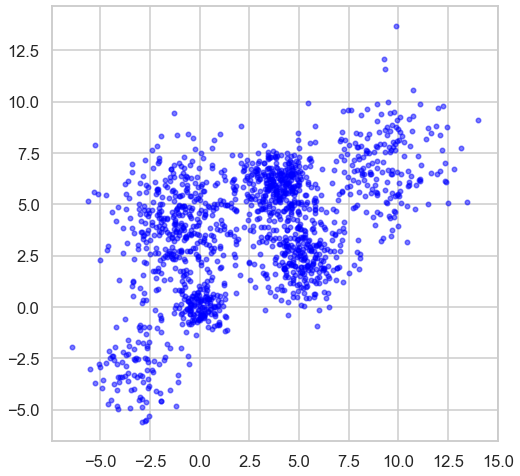

In [25]:
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6  
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data)

### Kmeans 
* Use Kmeans with different values of K to cluster the above data 
* Display the outcome of each value of K 
* Plot distortion function versus K and choose the approriate value of k 
* Plot the silhouette_score versus K and use it to choose the best K 
* Store the silhouette_score for the best K for later comparison with other clustering techniques. 

[ref1](https://www.analyticsvidhya.com/blog/2021/04/k-means-clustering-simplified-in-python/#:~:text=K%20means%20is%20one%20of,having%20similar%20features%2C%20common%20patterns)

The distortion = 5.387614153571204


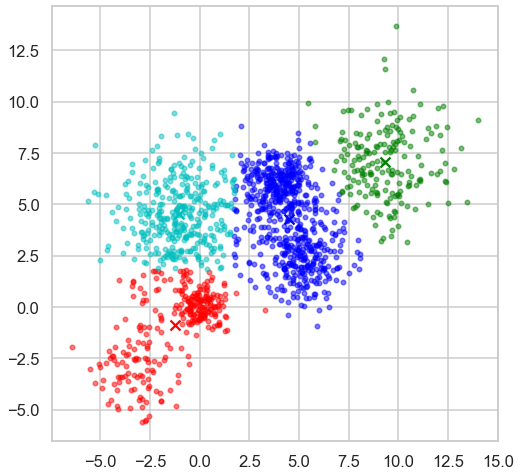

In [4]:
num_clusters = 4
X1 = Multi_blob_Data
km =KMeans(n_clusters = num_clusters).fit(X1)
print(f"The distortion = {km.inertia_ /len(X1)}")
display_cluster(np.array(X1), km, num_clusters)

In [5]:
#https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam
# Calculate Silhoutte Score
score = silhouette_score(X1, km.labels_, metric='euclidean')
# Print the score
print('Silhouetter Score: %.3f' % score)

Silhouetter Score: 0.463


The distortion = 2.9727628867589284


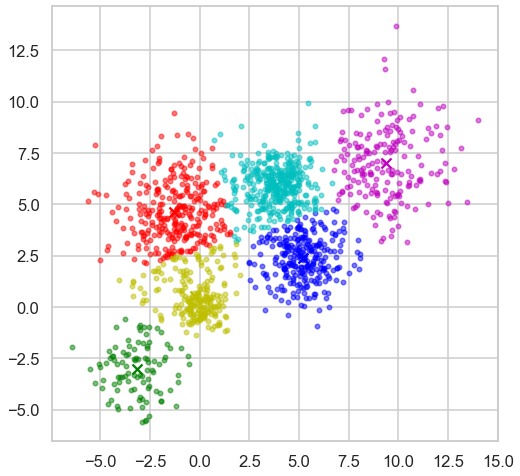

In [6]:
num_clusters = 6
X1 = Multi_blob_Data
km =KMeans(n_clusters = num_clusters).fit(X1)
print(f"The distortion = {km.inertia_ /len(X1)}")
display_cluster(X1, km, num_clusters)

In [7]:
#https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam
# Calculate Silhoutte Score
score = silhouette_score(X1, km.labels_, metric='euclidean')
# Print the score
print('Silhouetter Score: %.3f' % score)

Silhouetter Score: 0.486


Text(0.5, 0, 'All Silhoutte scores : [0.475, 0.436, 0.463, 0.481, 0.486, 0.463, 0.445, 0.449] Optimal Silhoutte : 0.486 (Optimal k : 6)')

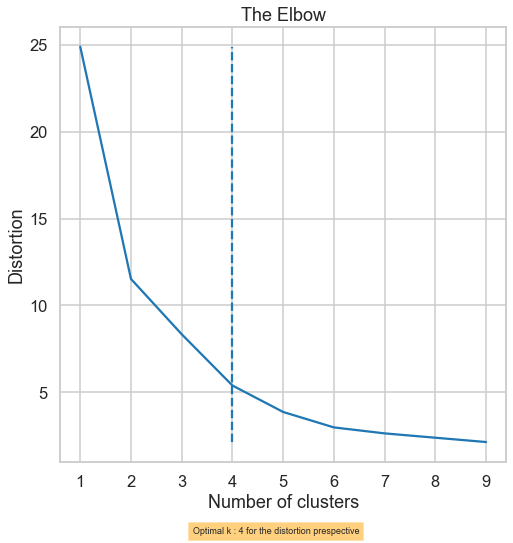

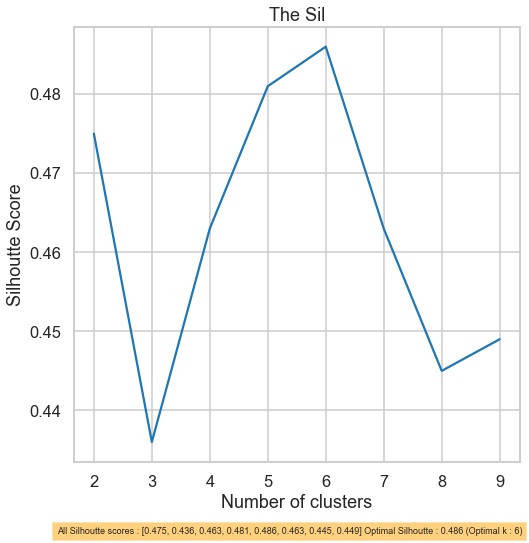

In [62]:
#wcss => distortion function for certain K
wcss=[]
sil=[]
for i in range(1,10): # i = number_clusters
    # Calculate Distortion from KMeans
    kmeans = KMeans(i)
    X1 = Multi_blob_Data
    kmeans.fit(X1)
    wcss_iter = kmeans.inertia_ / len(X1) #to get a small number to observe easily
    wcss.append(wcss_iter)
    
    # Calculate Silhoutte Score
    #https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam
    if(i>1):
        score = silhouette_score(X1, kmeans.labels_, metric='euclidean')
        # Print the score
        sil.append(float('%.3f' % score))
####################################################################


number_clusters = range(1,10) #silhouette_score requires more than 1 cluster labels to can compare
#Plot Distortion for each no. of clusters
plt.figure()
plt.plot(number_clusters,wcss)
plt.title('The Elbow')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')

# Specify the ELbow Point
from knee_locator import KneeLocator
kn = KneeLocator(number_clusters, wcss, curve='convex', direction='decreasing')
#print(f'Optimal k : {kn.knee} for the distortion prespective')
plt.figtext(0.5, 0, (f'Optimal k : {kn.knee} for the distortion prespective'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
plt.vlines(kn.knee, min(wcss), max(wcss), linestyles='dashed')
#####################################################################

number_clusters = range(2,10) #silhouette_score requires more than 1 cluster labels to can compare
#Plot Silhoutte Score for each no. of clusters
plt.figure()
plt.plot(number_clusters,sil)
plt.title('The Sil')
plt.xlabel('Number of clusters')
plt.ylabel('Silhoutte Score')

# Specify the max(optimal) Silhoutte Score as optimal
##print(f'All Silhoutte scores : {(sil)} Optimal Silhoutte : {max(sil)} (Optimal k : {sil.index(max(sil))+2})')
plt.figtext(0.5, 0, (f'All Silhoutte scores : {sil} Optimal Silhoutte : {max(sil)} (Optimal k : {sil.index(max(sil))+2})'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
        
# plt.figure()  
# plt.title("The Sil") 
#plt.vlines(max(sil), min(sil), max(sil), linestyles='dashed')



### ======================================================================================

### Hierarchal Clustering
* Use AgglomerativeClustering function to  to cluster the above data 
* In the  AgglomerativeClustering change the following parameters 
    * Affinity (use euclidean, manhattan and cosine)
    * Linkage( use average and single )
    * Distance_threshold (try different)
* For each of these trials plot the Dendograph , calculate the silhouette_score and display the resulting clusters  
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observation 

* [ref1](https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/)

* [ref2](https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam)

* [ref3](https://towardsdatascience.com/introduction-to-hierarchical-clustering-part-1-theory-linkage-and-affinity-e3b6a4817702)

##### <font color='mentage'> single as choice for linkage</font>

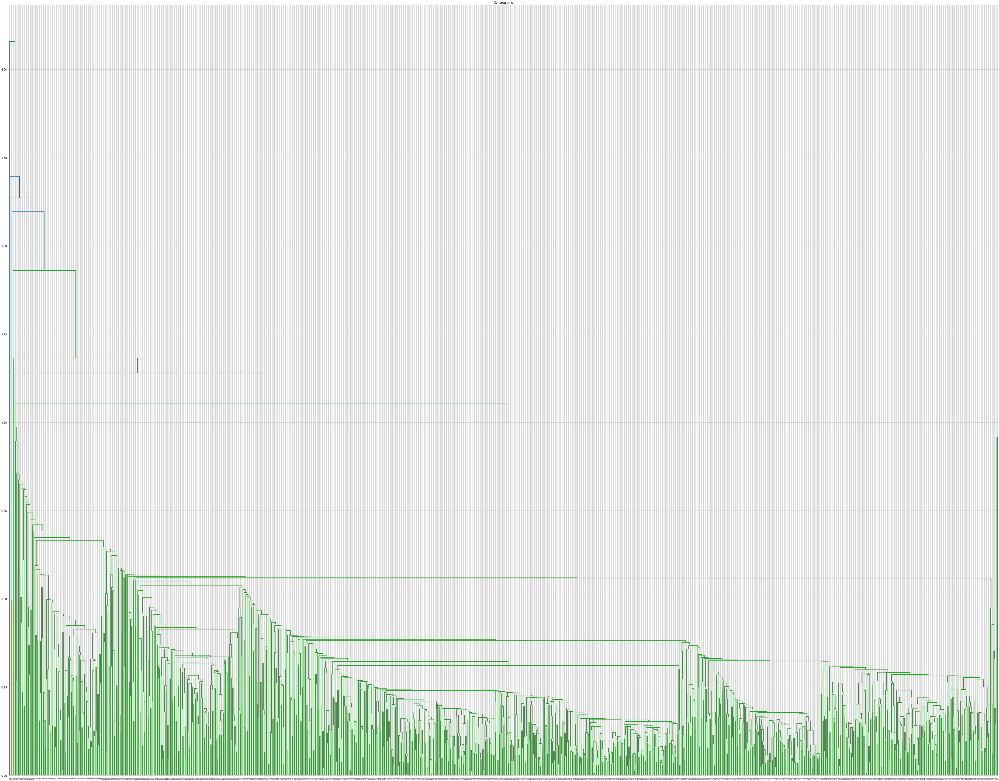

In [56]:
import scipy.cluster.hierarchy as shc
X2 = Multi_blob_Data
plt.figure(figsize=(100, 80))  
plt.title("Dendrograms") 
dend = shc.dendrogram(shc.linkage(X2, method='single'))

In [57]:
# The vertical line with maximum distance is the blue line and hence we can decide a threshold of 'S' and cut the dendrogram
plt.figure(figsize=(200, 200))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(X2, method='single'))
plt.axhline(y=2, color='r', linestyle='--')

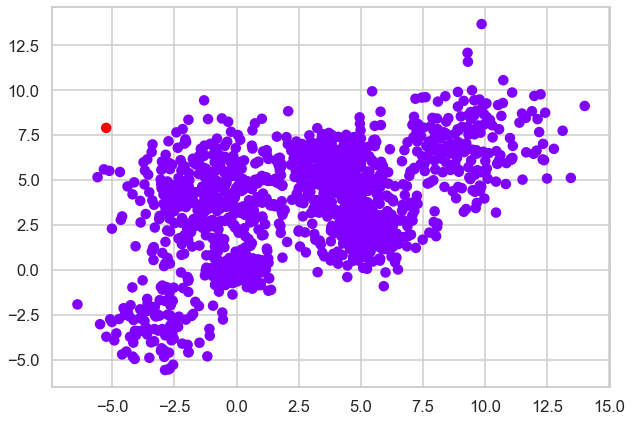

In [16]:
# We have 'two' clusters as this line cuts the dendrogram at 'two' points.
# Let’s now apply hierarchical clustering for 2 clusters:
from sklearn.cluster import AgglomerativeClustering
X2 = Multi_blob_Data
no_of_clusters = 2
cluster = AgglomerativeClustering(n_clusters=no_of_clusters, affinity='euclidean', linkage='single')  
cluster.fit_predict(X2)
# display_cluster(X2, cluster, 2) # no km.cluster_centers_ in the km of AgglomerativeClustering so, comment it in disply_cluster methods
plt.figure(figsize=(10, 7))
plt.scatter(X2[:,0], X2[:,1], c=cluster.labels_, cmap='rainbow')

In [17]:
# Calculate Silhoutte Score
#https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam
score = silhouette_score(X2, cluster.labels_, metric='euclidean')
# Print the score
sil2 = '%.3f' % score
print(f'{sil2} [single & euclidean]')

0.322 [single & euclidean]


----------------------------------------------------------

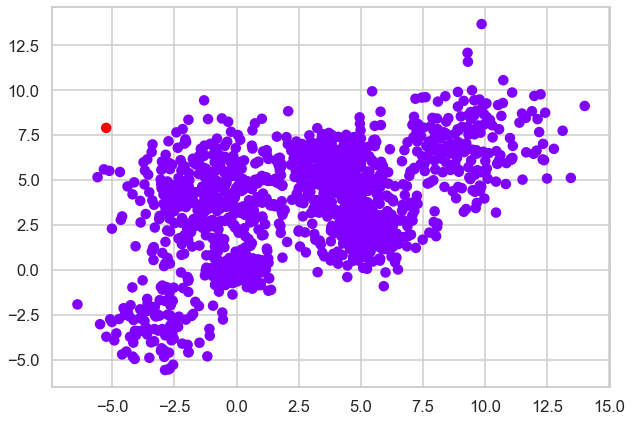

In [18]:
# We have 'two' clusters as this line cuts the dendrogram at 'two' points.
# Let’s now apply hierarchical clustering for 2 clusters:
from sklearn.cluster import AgglomerativeClustering
X2 = Multi_blob_Data
no_of_clusters = 2
cluster = AgglomerativeClustering(n_clusters=no_of_clusters, affinity='manhattan', linkage='single')  
cluster.fit_predict(X2)
plt.figure(figsize=(10, 7))
plt.scatter(X2[:,0], X2[:,1], c=cluster.labels_, cmap='rainbow')

In [19]:
# Calculate Silhoutte Score
#https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam
score = silhouette_score(X2, cluster.labels_, metric='euclidean')
# Print the score
sil2 = '%.3f' % score
print(f'{sil2} [single & manhattan]')

0.322 [single & manhattan]


----------------------------------------------------------

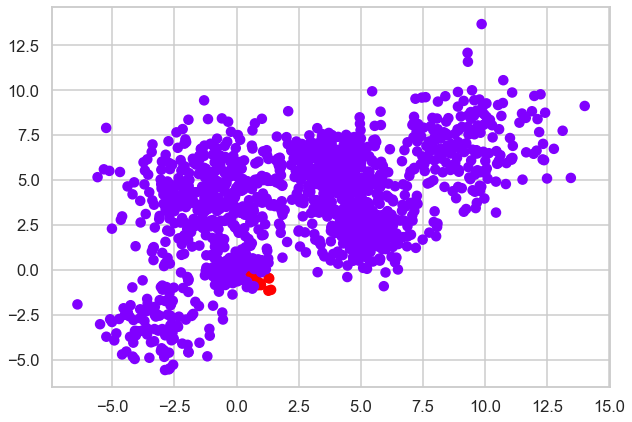

In [20]:
# We have 'two' clusters as this line cuts the dendrogram at 'two' points.
# Let’s now apply hierarchical clustering for 2 clusters:
from sklearn.cluster import AgglomerativeClustering
X2 = Multi_blob_Data
no_of_clusters = 2
cluster = AgglomerativeClustering(n_clusters=no_of_clusters, affinity='cosine', linkage='single')  
cluster.fit_predict(X2)
plt.figure(figsize=(10, 7))
plt.scatter(X2[:,0], X2[:,1], c=cluster.labels_, cmap='rainbow')

In [21]:
# Calculate Silhoutte Score
#https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam
score = silhouette_score(X2, cluster.labels_, metric='euclidean')
# Print the score
sil2 = '%.3f' % score
print(f'{sil2} [single & cosine]')

-0.017 [single & cosine]


----------------------------------------------------------
----------------------------------------------------------

##### <font color='mentage'> average as choice for linkage</font>

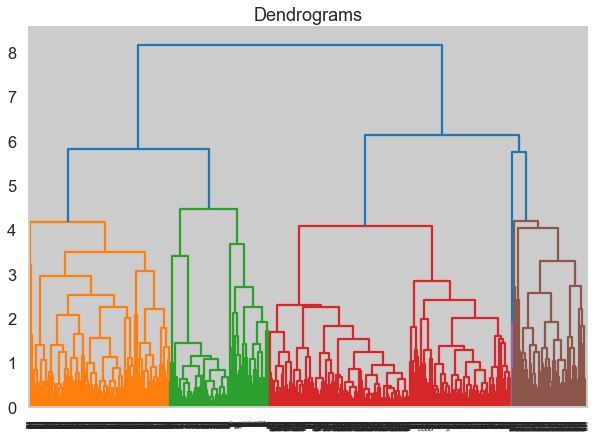

In [47]:
import scipy.cluster.hierarchy as shc
X2 = Multi_blob_Data
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms") 
dend = shc.dendrogram(shc.linkage(X2, method='average'))

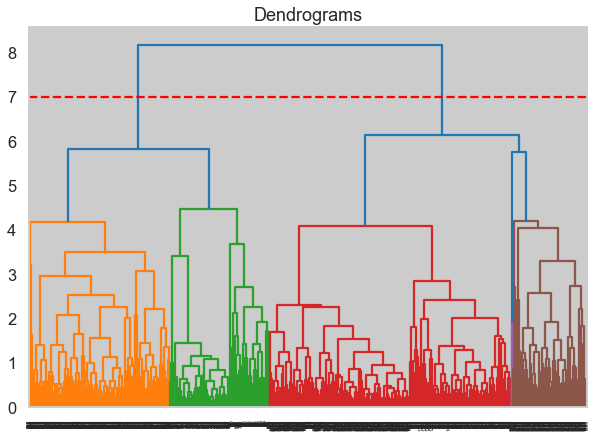

In [49]:
# The vertical line with maximum distance is the blue line and hence we can decide a threshold of '7' and cut the dendrogram
## If we draw a horizontal line that passes through longest distance without a horizontal line
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(X2, method='average'))
plt.axhline(y=7, color='r', linestyle='--')

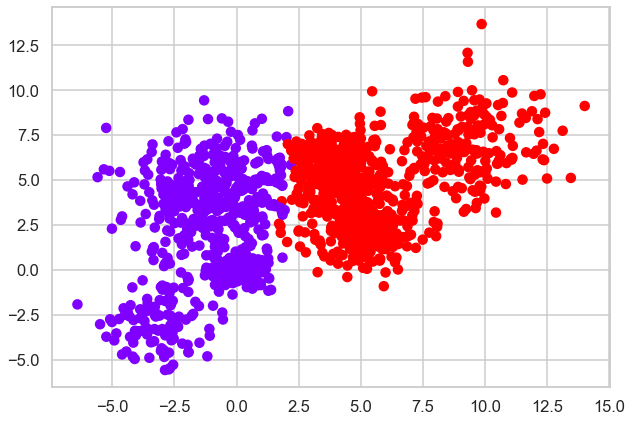

In [234]:
# We have 'two' clusters as this line cuts the dendrogram at 'two' points.
# Let’s now apply hierarchical clustering for 2 clusters:
from sklearn.cluster import AgglomerativeClustering
X2 = Multi_blob_Data
no_of_clusters = 2
cluster = AgglomerativeClustering(n_clusters=no_of_clusters, affinity='manhattan', linkage='average')  
cluster.fit_predict(X2)
plt.figure(figsize=(10, 7))
plt.scatter(X2[:,0], X2[:,1], c=cluster.labels_, cmap='rainbow')

In [235]:
# Calculate Silhoutte Score
score = silhouette_score(X2, cluster.labels_, metric='euclidean')
# Print the score
sil2 = '%.3f' % score
print(f'{sil2} [average & manhattan]')

0.468 [average & manhattan]


----------------------------------------------------------

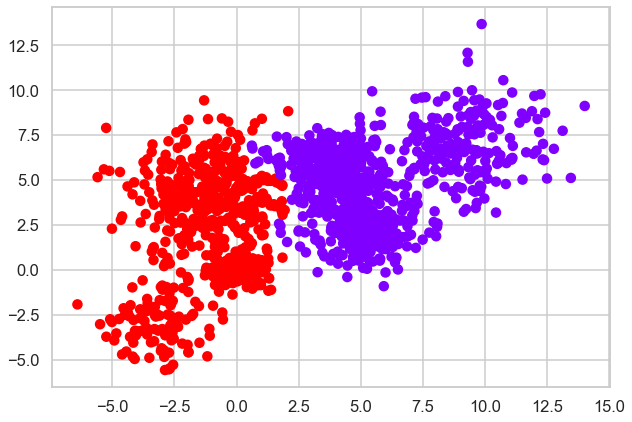

In [213]:
# We have 'two' clusters as this line cuts the dendrogram at 'two' points.
# Let’s now apply hierarchical clustering for 2 clusters:
from sklearn.cluster import AgglomerativeClustering
no_of_clusters = 2
cluster = AgglomerativeClustering(n_clusters=no_of_clusters, affinity='euclidean', linkage='average')  
cluster.fit_predict(X2)
plt.figure(figsize=(10, 7))
plt.scatter(X2[:,0], X2[:,1], c=cluster.labels_, cmap='rainbow')

In [214]:
# Calculate Silhoutte Score
score = silhouette_score(X2, cluster.labels_, metric='euclidean')
# Print the score
sil2 = '%.3f' % score
print(f'{sil2} [average & euclidean]')

0.472 [average & euclidean]


----------------------------------------------------------

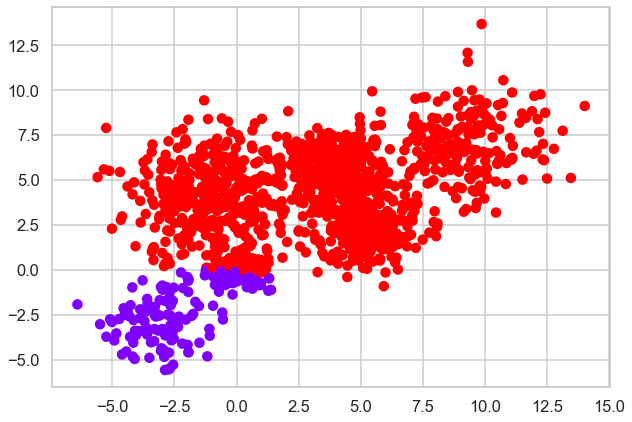

In [215]:
# We have 'two' clusters as this line cuts the dendrogram at 'two' points.
# Let’s now apply hierarchical clustering for 2 clusters:
from sklearn.cluster import AgglomerativeClustering
X2 = Multi_blob_Data
no_of_clusters = 2
cluster = AgglomerativeClustering(n_clusters=no_of_clusters, affinity='cosine', linkage='average')  
cluster.fit_predict(X2)
plt.figure(figsize=(10, 7))
plt.scatter(X2[:,0], X2[:,1], c=cluster.labels_, cmap='rainbow')

In [216]:
# Calculate Silhoutte Score
#https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam
score = silhouette_score(X2, cluster.labels_, metric='euclidean')
# Print the score
sil2 = '%.3f' % score
print(f'{sil2} [average & cosine]')

0.353 [average & cosine]


#### Test different distance threshold values (with the optimal choices {euclidean & average})
> [ref1](https://fda.readthedocs.io/en/latest/modules/ml/autosummary/skfda.ml.clustering.AgglomerativeClustering.html)
> [ref2](https://www.educative.io/edpresso/what-is-agglomerative-clustering)

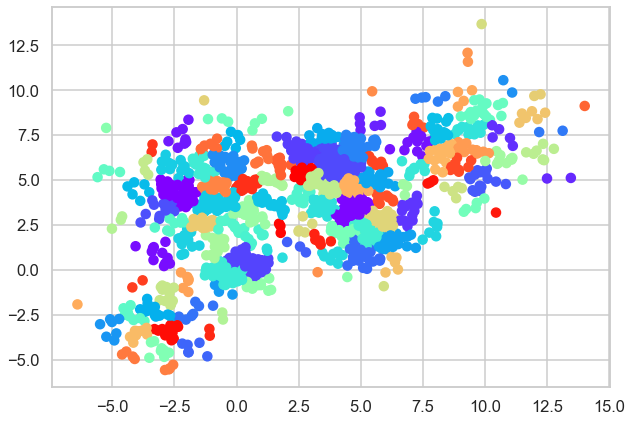

In [217]:
#1
#THRESHOLD_DISTANCE:- The linkage distance threshold above which, clusters will not be merged. 
from sklearn.cluster import AgglomerativeClustering
X2 = Multi_blob_Data
cluster = AgglomerativeClustering(n_clusters= None, distance_threshold=1, affinity='euclidean', linkage='average')  
cluster.fit_predict(X2)
plt.figure(figsize=(10, 7))
plt.scatter(X2[:,0], X2[:,1], c=cluster.labels_, cmap='rainbow')

In [218]:
# Calculate Silhoutte Score
score = silhouette_score(X2, cluster.labels_, metric='euclidean')
# Print the score
sil2 = '%.3f' % score
print(sil2) #average, euclidean

0.324


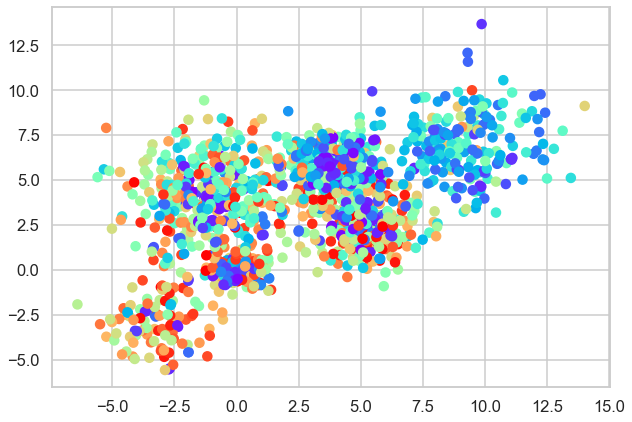

In [219]:
#0.1
from sklearn.cluster import AgglomerativeClustering
X2 = Multi_blob_Data
cluster = AgglomerativeClustering(n_clusters= None, distance_threshold=0.1, affinity='euclidean', linkage='average')  
cluster.fit_predict(X2)
plt.figure(figsize=(10, 7))
plt.scatter(X2[:,0], X2[:,1], c=cluster.labels_, cmap='rainbow')

In [220]:
# Calculate Silhoutte Score
score = silhouette_score(X2, cluster.labels_, metric='euclidean')
# Print the score
sil2 = '%.3f' % score
print(sil2) #average, euclidean

0.188


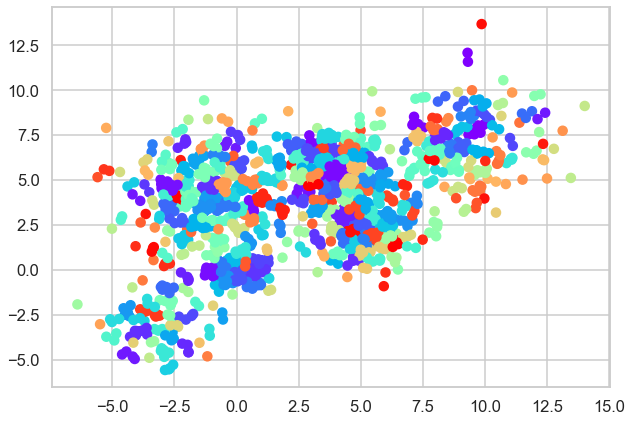

In [222]:
#0.5
from sklearn.cluster import AgglomerativeClustering
X2 = Multi_blob_Data
cluster = AgglomerativeClustering(n_clusters= None, distance_threshold=0.5, affinity='euclidean', linkage='average')  
cluster.fit_predict(X2)
plt.figure(figsize=(10, 7))
plt.scatter(X2[:,0], X2[:,1], c=cluster.labels_, cmap='rainbow')

In [223]:
# Calculate Silhoutte Score
score = silhouette_score(X2, cluster.labels_, metric='euclidean')
# Print the score
sil2 = '%.3f' % score
print(sil2) #average, euclidean

0.374


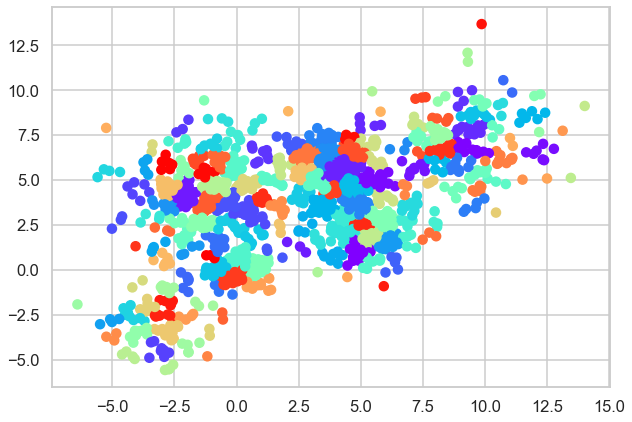

In [230]:
#0.8
from sklearn.cluster import AgglomerativeClustering
X2 = Multi_blob_Data
cluster = AgglomerativeClustering(n_clusters= None, distance_threshold=0.8, affinity='euclidean', linkage='average')  
cluster.fit_predict(X2)
plt.figure(figsize=(10, 7))
plt.scatter(X2[:,0], X2[:,1], c=cluster.labels_, cmap='rainbow')

In [231]:
# Calculate Silhoutte Score
score = silhouette_score(X2, cluster.labels_, metric='euclidean')
# Print the score
sil2 = '%.3f' % score
print(sil2) #average, euclidean

0.351


---------------------------------------------------------------------

##### <font color='red'> The outcome of this algorithm in terms of the final clusters created can be influenced by two main things:</font>
- the affinity metric chosen (how the distance between points is calculated).
- the distance threshold lower positive values under one has bigger silhouette score and more clusters.
- the linkage method chosen (between which points the distance is calculated).
* Furthermore, the algorithm is not that sensitive to the distance metric, meaning that the results should not be that affected by the choice of the affinity metric.
>[https://towardsdatascience.com/introduction-to-hierarchical-clustering-part-1-theory-linkage-and-affinity-e3b6a4817702]
>[https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/]

##### <font color='red'> The main observations on Linkage are:</font>
- the affinity metric chosen (how the distance between points is calculated).
- the distance threshold lower positive values under one has bigger silhouette score and more clusters.
- the linkage method chosen (between which points the distance is calculated).
* Furthermore, the algorithm is not that sensitive to the distance metric, meaning that the results should not be that affected by the choice of the affinity metric.
>[https://towardsdatascience.com/introduction-to-hierarchical-clustering-part-1-theory-linkage-and-affinity-e3b6a4817702]
>[https://stackabuse.com/hierarchical-clustering-with-python-and-scikit-learn/]

* single linkage is fast, and can perform well on non-globular data, but it performs poorly in the presence of noise.

* average and complete linkage perform well on cleanly separated globular clusters, but have mixed results otherwise.

* Ward is the most effective method for noisy data.

##### <font color='red'> The final observations:</font>
1) The silhouette score falls within the range [-1, 1].
>* The silhouette score of 1 means that the clusters are very dense and nicely separated.
>* The score of 0 means that clusters are overlapping.
>* The score of less than 0 means that data belonging to clusters may be wrong/incorrect.

2) The best combination is n_clusters= None, distance_threshold=None, affinity='euclidean', linkage='average'

### ======================================================================================

### DBScan
* Use DBScan function to cluster the above data 
* In the  DBscan change the following parameters 
    * EPS (from 0.1 to 3)
    * Min_samples (from 5 to 25)
* Plot the silhouette_score versus the variation in the EPS and the min_samples
* Plot the resulting Clusters in this case 
* Find the set of paramters that would find result in the best silhouette_score and store this score for later comparison with other clustering techniques. 
* Record your observations and comments 

------------------------------
* DBSCAN is a density-based clustering algorithm that works on the assumption that clusters are dense regions in space
separated by regions of lower density.

* DBSCAN is not just able to cluster the data points correctly, but it also perfectly detects noise in the dataset.

* The most exciting feature of DBSCAN clustering is that it is robust to outliers.
------------------------------
- The value of minPoints should be at least one greater than the number of dimensions of the dataset,
i.e., minPoints>=Dimensions+1.
- The value of epsilon can be decided from the K-distance graph.
The point of maximum curvature (elbow) in this graph tells us about the value of epsilon.
- ----------------------------

* [ref1](https://www.analyticsvidhya.com/blog/2020/09/how-dbscan-clustering-works/)

* [ref2](https://www.kdnuggets.com/2020/04/dbscan-clustering-algorithm-machine-learning.html)

* [ref3](https://towardsdatascience.com/dbscan-clustering-explained-97556a2ad556#:~:text=e.g.%20anomaly%20detection.-,DBSCAN%20algorithm,many%20points%20from%20that%20cluster.)

* [ref4](https://stackoverflow.com/questions/61233304/clustering-with-dbscan-how-to-train-a-model-if-you-dont-set-the-number-of-clust)

Number of clusters = 10


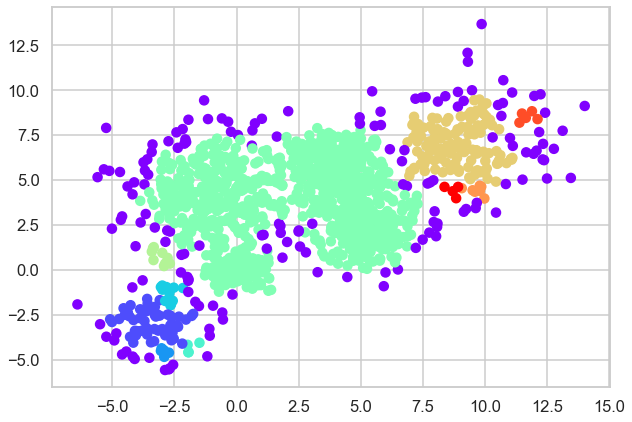

In [28]:
#before tuning the eps & minPoint
from sklearn.cluster import DBSCAN
X3 = Multi_blob_Data
dbscan=DBSCAN() #EPS & MinPoint not assigned yet
dbscan.fit_predict(X3)
plt.figure(figsize=(10, 7))
plt.scatter(X3[:,0], X3[:,1], c=dbscan.labels_, cmap='rainbow')

# Number of clusters in labels, ignoring noise if present.
labels = dbscan.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
print(f'Number of clusters = {n_clusters_}')

#### For epsilon

In [29]:
#For epsilon, the K-distance graph is used. For plotting a K-distance Graph, we need the distance between a point and its nearest data point for all data points in the dataset. We obtain this using NearestNeighbors from sklearn.neighbors.
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(X3)
distances, indices = nbrs.kneighbors(X3)

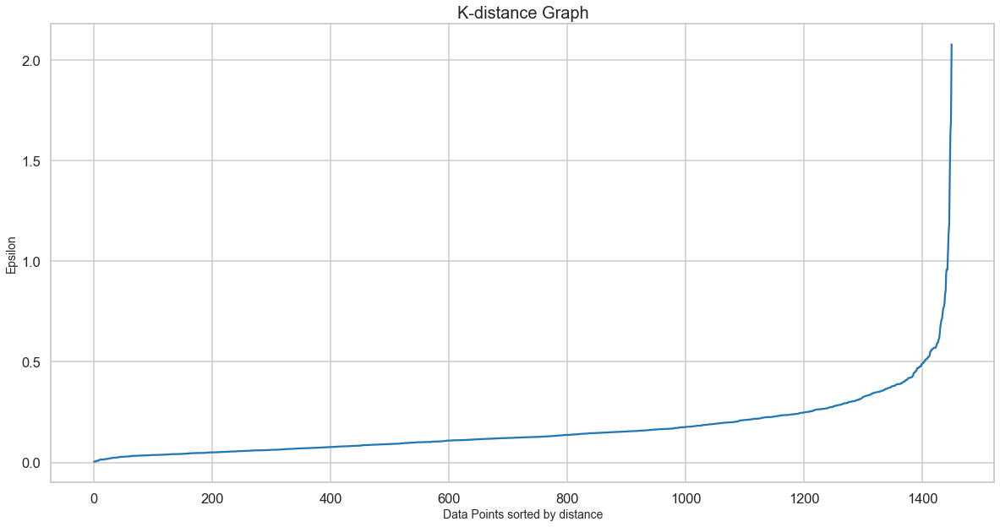

In [30]:
#Let’s plot our K-distance graph and find the optimal value of epsilon. Use the following syntax:

# Plotting K-distance Graph
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()



> The optimum value of epsilon is at the point of maximum curvature in the K-Distance Graph (= 0.5)

> The value of minPoints also depends on domain knowledge. This time I am taking minPoints as 6
or loop over the range of 5 to 25 and get the maximum silhouette-score as the optimal 

#### For min_samples

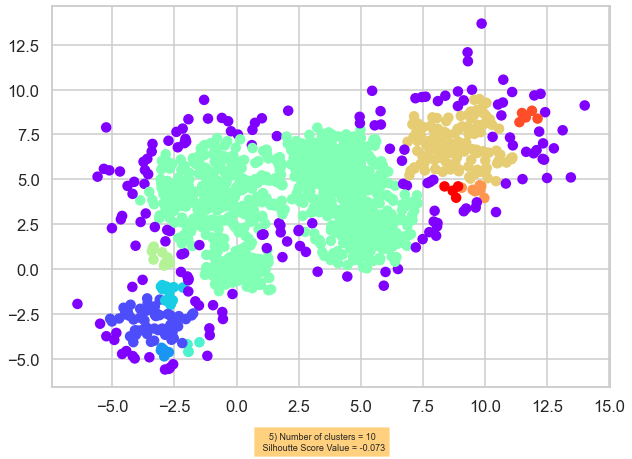

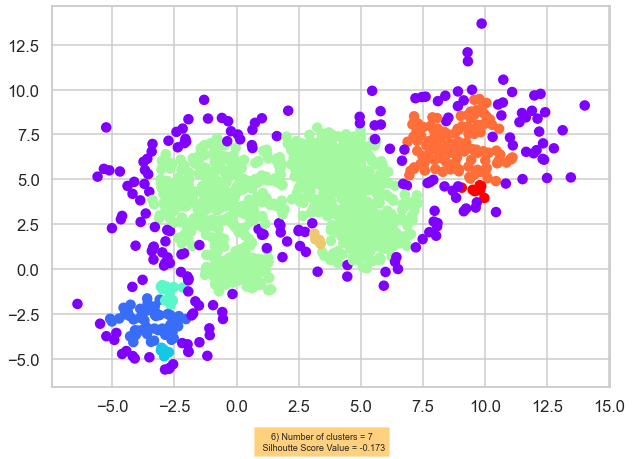

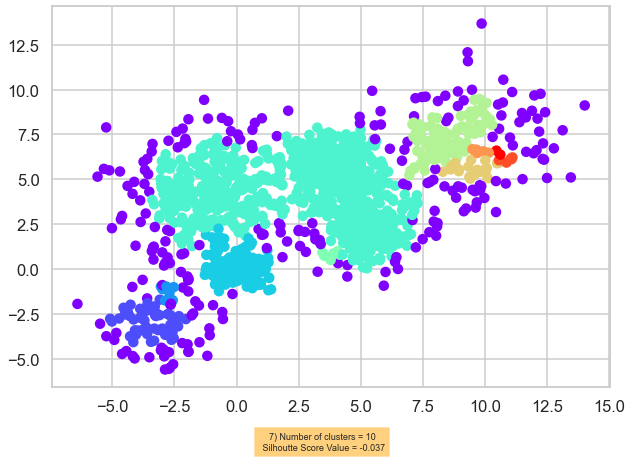

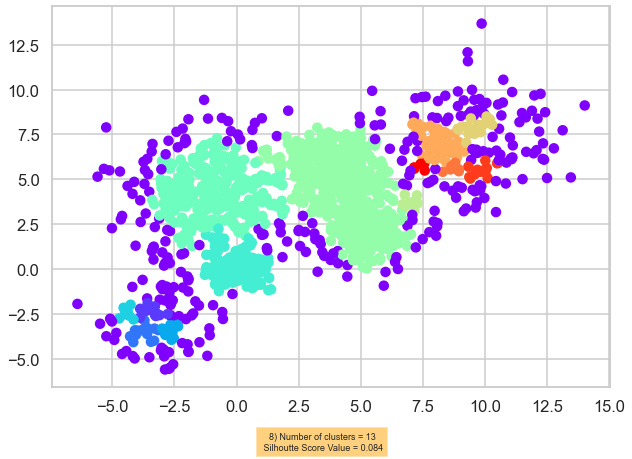

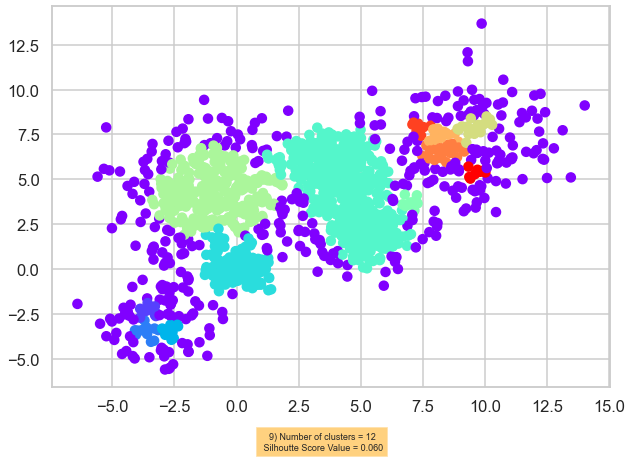

...

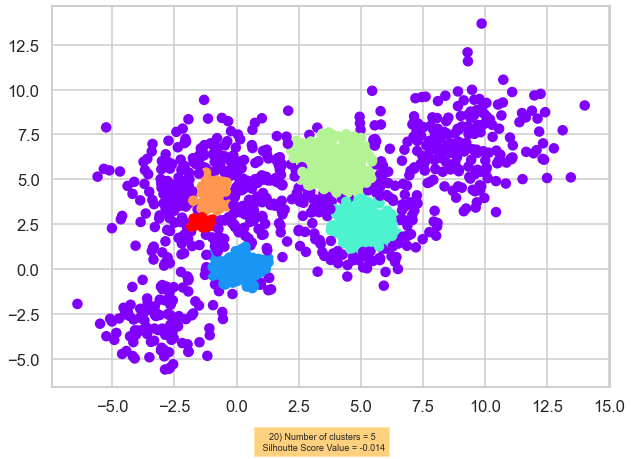

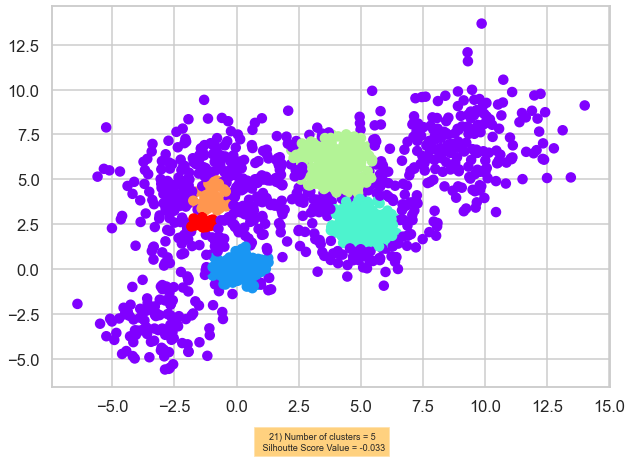

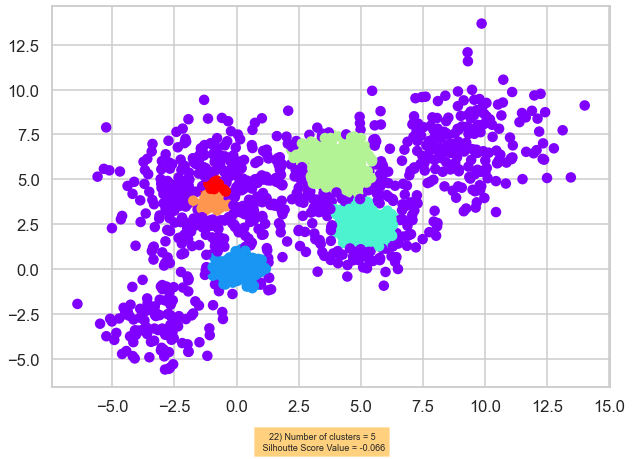

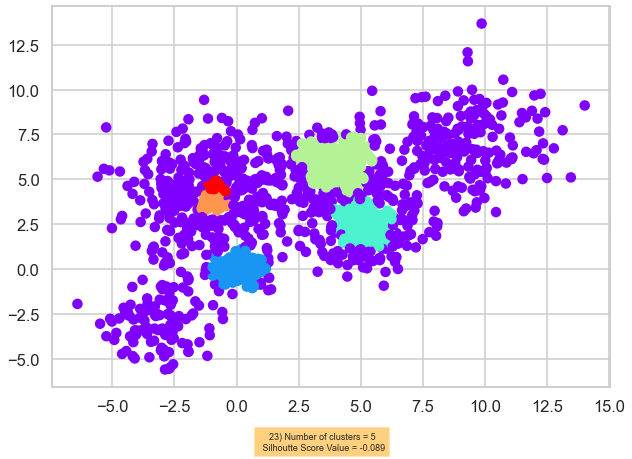

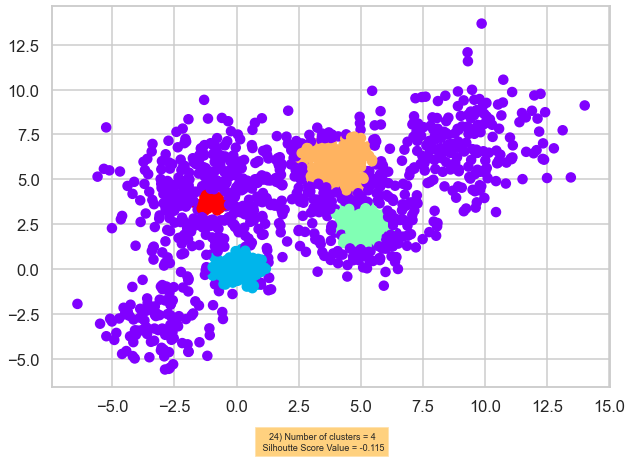

In [84]:
from sklearn.cluster import DBSCAN
X3 = Multi_blob_Data
sill_all = []
clusters_all = []
for i in range(5, 25):
    dbscan=DBSCAN(eps=0.5,min_samples=i)
    dbscan.fit_predict(X3)
    plt.figure(figsize=(10, 7))
    plt.scatter(X3[:,0], X3[:,1], c=dbscan.labels_, cmap='rainbow')


    # Number of clusters in labels, ignoring noise if present.
    labels = dbscan.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    clusters_all.append(n_clusters_)
    #print(f'{i}) Number of clusters = {n_clusters_}')

    # Calculate Silhoutte Score
    score = silhouette_score(X3, dbscan.labels_, metric='euclidean')
    # Print the score
    sil3 = '%.3f' % score
    sill_all.append(float(sil3))
    #print(f'Silhoutte Score Value = {sil3}')
    
    #printing below each figure
    plt.figtext(0.5, 0, (f'{i}) Number of clusters = {n_clusters_}\n Silhoutte Score Value = {sil3}'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
    
    



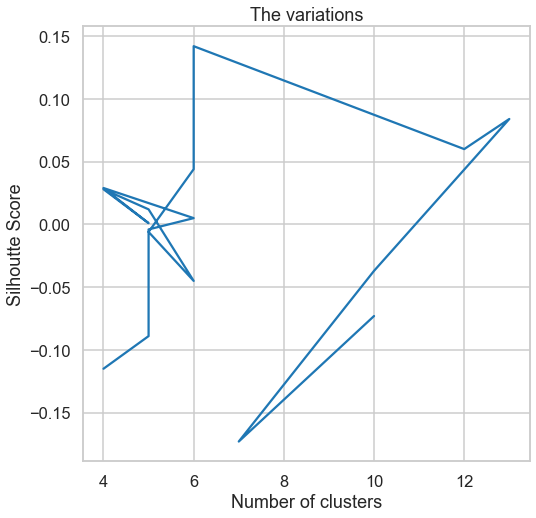

In [85]:
#Plot the silhouette_score versus the variation in the optimal EPS and the min_samples
plt.figure()
plt.title('The variations')
plt.xlabel('Number of clusters')
plt.ylabel('Silhoutte Score')
plt.plot(clusters_all,sill_all)

Number of clusters = 13
Silhoutte Score Value = 0.084


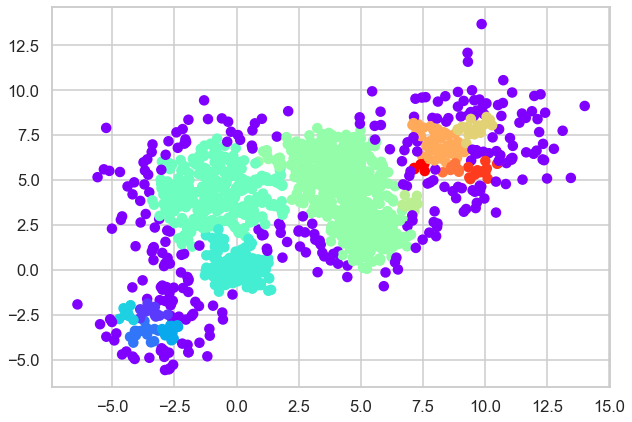

In [37]:
# after the loop over the range of 5 to 25 and get the maximum silhouette-score as the optimal,
# we observe that it is at min_samples equal to 8
from sklearn.cluster import DBSCAN
X3 = Multi_blob_Data
dbscan=DBSCAN(eps=0.5,min_samples=8)
dbscan.fit_predict(X3)
plt.figure(figsize=(10, 7))
plt.scatter(X3[:,0], X3[:,1], c=dbscan.labels_, cmap='rainbow')


# Number of clusters in labels, ignoring noise if present.
labels = dbscan.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
print(f'Number of clusters = {n_clusters_}')

# Calculate Silhoutte Score
score = silhouette_score(X3, dbscan.labels_, metric='euclidean')
# Print the score
sil3 = '%.3f' % score
print(f'Silhoutte Score Value = {sil3}') # 0.5, 8

Number of clusters = 7
Silhoutte Score Value = -0.173


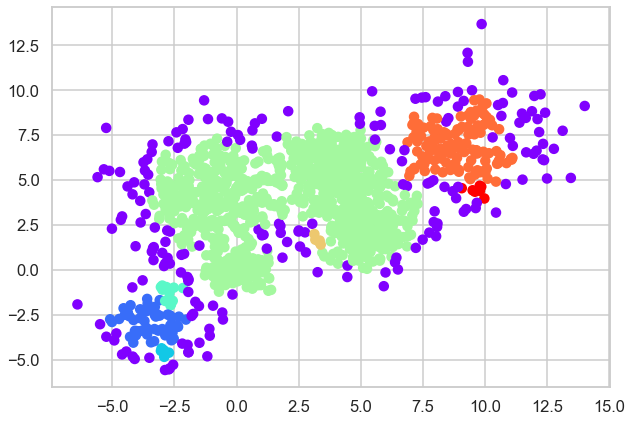

In [31]:
#Now, according to the domain knowledge, we make the min_samples as 6
from sklearn.cluster import DBSCAN
X3 = Multi_blob_Data
dbscan=DBSCAN(eps=0.5,min_samples=6)
dbscan.fit_predict(X3)
plt.figure(figsize=(10, 7))
plt.scatter(X3[:,0], X3[:,1], c=dbscan.labels_, cmap='rainbow')


# Number of clusters in labels, ignoring noise if present.
labels = dbscan.labels_
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
print(f'Number of clusters = {n_clusters_}')

# Calculate Silhoutte Score
score = silhouette_score(X3, dbscan.labels_, metric='euclidean')
# Print the score
sil3 = '%.3f' % score
print(f'Silhoutte Score Value = {sil3}') # 0.5, 6

### ======================================================================================

### Gaussian Mixture
* Use GaussianMixture function to cluster the above data 
* In GMM change the covariance_type and check the difference in the resulting proabability fit 
* Use a 2D contour plot to plot the resulting distribution (the components of the GMM) as well as the total Gaussian mixture 

> [ref1](https://www.analyticsvidhya.com/blog/2019/10/gaussian-mixture-models-clustering/)
> [ref2](https://pythonmachinelearning.pro/clustering-with-gaussian-mixture-models/)
> [ref3](https://jakevdp.github.io/PythonDataScienceHandbook/05.12-gaussian-mixtures.html)
> [ref4](http://ethen8181.github.io/machine-learning/clustering/GMM/GMM.html)
> [ref5](chrome-extension://efaidnbmnnnibpcajpcglclefindmkaj/viewer.html?pdfurl=https%3A%2F%2Fwww.cbrinton.net%2FECE20875-2020-Spring%2FW11%2Fgmms_notebook.pdf&clen=336234&chunk=true)

- k-means only considers the mean to update the centroid
- while GMM takes into account the mean as well as the variance of the data!
- Gaussian Mixture Models are probabilistic models and use the soft clustering approach for distributing the points in different clusters.
- Expectation-Maximization tries to use the existing data to determine the optimum values for these variables and then finds the model parameters
- we need to find the values (the mean and covariance values and the density) for these parameters to define the Gaussian distributions.

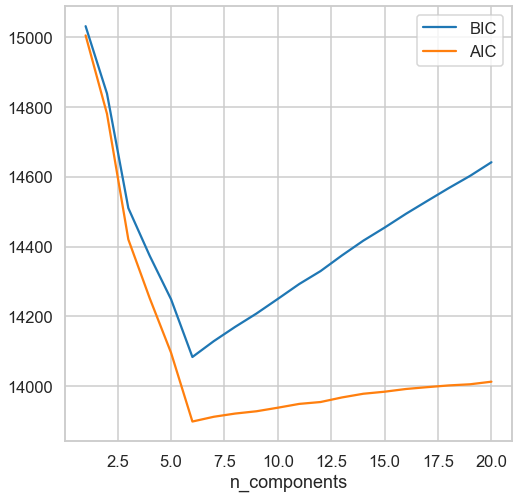

In [50]:
# the optimal number of components (that minimizes the AIC or BIC)
n_components = np.arange(1, 21)
X4 = Multi_blob_Data
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(X4)
          for n in n_components]

plt.plot(n_components, [m.bic(X4) for m in models], label='BIC')
plt.plot(n_components, [m.aic(X4) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

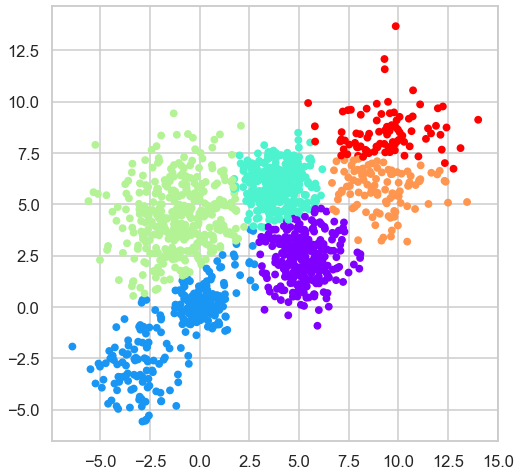

In [53]:
from sklearn.mixture import GaussianMixture
X4 = Multi_blob_Data
gmm = GaussianMixture(n_components=6).fit(X4)
labels = gmm.predict(X4)
plt.scatter(X4[:, 0], X4[:, 1], c=labels, s=40, cmap='rainbow');

In [54]:
print(gmm.means_)
print('\n')
print(gmm.covariances_)
print('\n')
probs = gmm.predict_proba(X4)
print(probs[:5].round(3))

[[ 5.20471237  2.42415237]
 [-0.9150021  -0.71059563]
 [ 3.9408309   5.93827588]
 [-1.05366297  4.2645228 ]
 [ 9.06948412  5.90472391]
 [ 9.28282437  8.14821183]]


[[[ 1.06790816e+00 -3.44346573e-03]
  [-3.44346573e-03  1.31086029e+00]]

 [[ 3.97037932e+00  3.17320770e+00]
  [ 3.17320770e+00  4.24526112e+00]]

 [[ 8.74443067e-01 -8.69401622e-03]
  [-8.69401622e-03  7.87053938e-01]]

 [[ 2.41236300e+00  2.40622592e-01]
  [ 2.40622592e-01  3.14225691e+00]]

 [[ 2.36966622e+00  4.39362665e-03]
  [ 4.39362665e-03  1.69866365e+00]]

 [[ 3.09143012e+00  2.75357467e-01]
  [ 2.75357467e-01  2.08117184e+00]]]


[[0.    1.    0.    0.    0.    0.   ]
 [0.    0.982 0.    0.018 0.    0.   ]
 [0.    1.    0.    0.    0.    0.   ]
 [0.    0.996 0.    0.004 0.    0.   ]
 [0.    0.999 0.    0.001 0.    0.   ]]


#### different covariance types

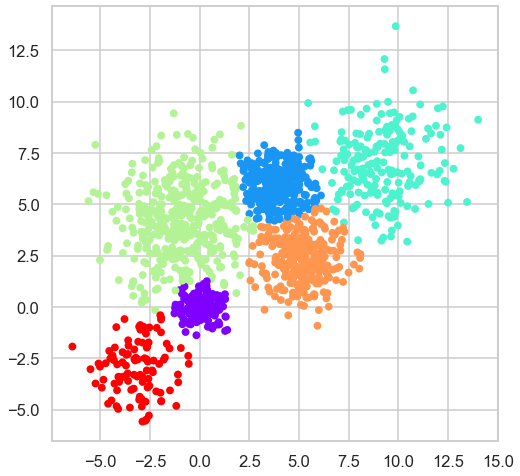

In [58]:
from sklearn.mixture import GaussianMixture
X4 = Multi_blob_Data
gmm = GaussianMixture(n_components=6, covariance_type="full").fit(X4)
labels = gmm.predict(X4)
plt.scatter(X4[:, 0], X4[:, 1], c=labels, s=40, cmap='rainbow');

In [59]:
print(gmm.means_)
print('\n')
print(gmm.covariances_)
print('\n')
probs = gmm.predict_proba(X4)
print(probs[:5].round(3))

[[ 5.34300440e-02  8.44832413e-04]
 [ 3.95569625e+00  5.95993982e+00]
 [ 9.09803377e+00  6.86865768e+00]
 [-8.97601058e-01  4.12569672e+00]
 [ 5.10460433e+00  2.44511374e+00]
 [-3.12551668e+00 -2.92051066e+00]]


[[[ 0.38096774 -0.02728547]
  [-0.02728547  0.31672142]]

 [[ 0.80882229 -0.0066711 ]
  [-0.0066711   0.75488065]]

 [[ 2.86298524  0.41594619]
  [ 0.41594619  3.31787036]]

 [[ 2.7049779   0.15341584]
  [ 0.15341584  3.33142936]]

 [[ 1.15501575 -0.03264885]
  [-0.03264885  1.35010679]]

 [[ 1.2480227   0.11023286]
  [ 0.11023286  1.71386008]]]


[[0.    0.    0.    0.001 0.    0.999]
 [0.004 0.    0.    0.103 0.    0.893]
 [0.    0.    0.    0.    0.    1.   ]
 [0.013 0.    0.    0.05  0.    0.937]
 [0.    0.    0.    0.002 0.    0.998]]


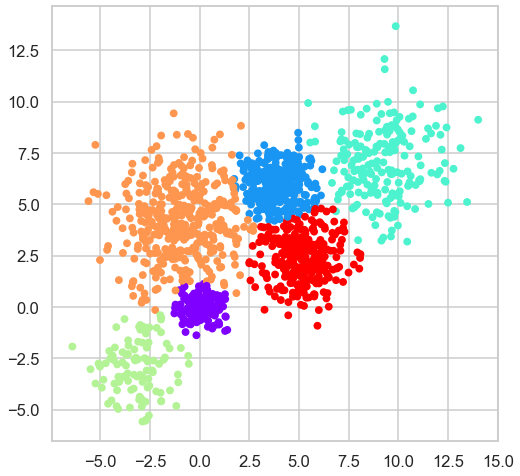

In [62]:
from sklearn.mixture import GaussianMixture
X4 = Multi_blob_Data
gmm = GaussianMixture(n_components=6, covariance_type="diag").fit(X4)
labels = gmm.predict(X4)
plt.scatter(X4[:, 0], X4[:, 1], c=labels, s=40, cmap='rainbow');

In [63]:
print(gmm.means_)
print('\n')
print(gmm.covariances_)
print('\n')
probs = gmm.predict_proba(X4)
print(probs[:5].round(3))

[[ 5.32818171e-02 -4.64810801e-03]
 [ 3.94668004e+00  5.95732148e+00]
 [ 9.15423127e+00  6.92636186e+00]
 [-3.13540490e+00 -2.92711456e+00]
 [-9.09373371e-01  4.10580511e+00]
 [ 5.12793665e+00  2.46006962e+00]]


[[0.38498145 0.31402688]
 [0.83575937 0.7583994 ]
 [2.74526898 3.19382584]
 [1.23302745 1.70629837]
 [2.66541371 3.35049913]
 [1.17024967 1.36738415]]


[[0.    0.    0.    0.999 0.001 0.   ]
 [0.008 0.    0.    0.884 0.109 0.   ]
 [0.    0.    0.    1.    0.    0.   ]
 [0.023 0.    0.    0.916 0.061 0.   ]
 [0.    0.    0.    0.999 0.001 0.   ]]


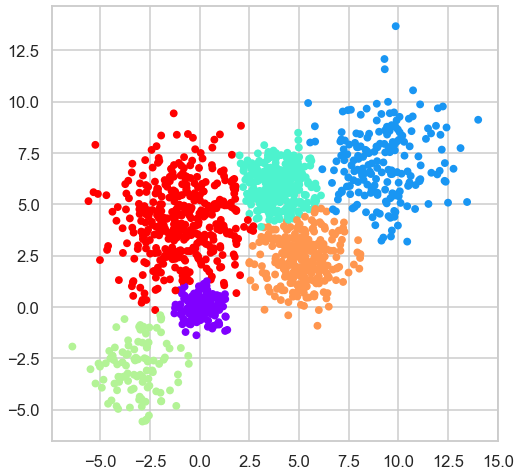

In [64]:
from sklearn.mixture import GaussianMixture
X4 = Multi_blob_Data
gmm = GaussianMixture(n_components=6, covariance_type="spherical").fit(X4)
labels = gmm.predict(X4)
plt.scatter(X4[:, 0], X4[:, 1], c=labels, s=40, cmap='rainbow');

In [65]:
print(gmm.means_)
print('\n')
print(gmm.covariances_)
print('\n')
probs = gmm.predict_proba(X4)
print(probs[:5].round(3))

[[ 4.80584769e-02  8.86254281e-03]
 [ 9.12420422e+00  6.92925609e+00]
 [ 3.96544160e+00  5.94534013e+00]
 [-3.13304767e+00 -2.94562729e+00]
 [ 5.14488575e+00  2.42699480e+00]
 [-8.72038691e-01  4.13800759e+00]]


[0.35783427 2.99551691 0.78465051 1.44152254 1.24443561 3.04871978]


[[0.    0.    0.    1.    0.    0.   ]
 [0.007 0.    0.    0.908 0.    0.085]
 [0.    0.    0.    1.    0.    0.   ]
 [0.035 0.    0.    0.939 0.    0.026]
 [0.    0.    0.    0.999 0.    0.001]]


#### My Observations
- go to section '_Choosing the covariance type_' in this [link](https://jakevdp.github.io/PythonDataScienceHandbook/05.12-gaussian-mixtures.html)

##### Dr. Ing- Maggie method for contour

In [21]:
def bivariate_normal(X, Y, sigmax=1.0, sigmay=1.0,
                 mux=0.0, muy=0.0, sigmaxy=0.0):
    """
    Bivariate Gaussian distribution for equal shape *X*, *Y*.
    See `bivariate normal
    <http://mathworld.wolfram.com/BivariateNormalDistribution.html>`_
    at mathworld.
    """
    Xmu = X-mux
    Ymu = Y-muy

    rho = sigmaxy/(sigmax*sigmay)
    z = Xmu**2/sigmax**2 + Ymu**2/sigmay**2 - 2*rho*Xmu*Ymu/(sigmax*sigmay)
    denom = 2*np.pi*sigmax*sigmay*np.sqrt(1-rho**2)
    return np.exp(-z/(2*(1-rho**2))) / denom

In [73]:
#by using bivariate_normal
def plot_contours(data, means, covs, title):
    plt.figure()
    plt.plot([x[0] for x in data], [y[1] for y in data],'k.') # data

    delta = 0.025
    k = len(means)
    x = np.arange(-6, 15, delta)
    y = np.arange(-6, 15, delta)
    X, Y = np.meshgrid(x, y)
    col = ['green', 'red', 'indigo', 'blue', 'pink', 'yellow', 'cyan', 'magenta'] #should be at least equal no. of n components
    for i in range(k):
        mean = means[i]
        cov = covs[i]
        sigmax = np.sqrt(cov[0][0])
        sigmay = np.sqrt(cov[1][1])
        sigmaxy = cov[0][1]/(sigmax*sigmay)
        Z = bivariate_normal(X, Y, sigmax, sigmay, mean[0], mean[1], sigmaxy)
        plt.contour(X, Y, Z, colors = col[i])
        plt.title(title)
    plt.rcParams.update({'font.size':16})
    plt.tight_layout()

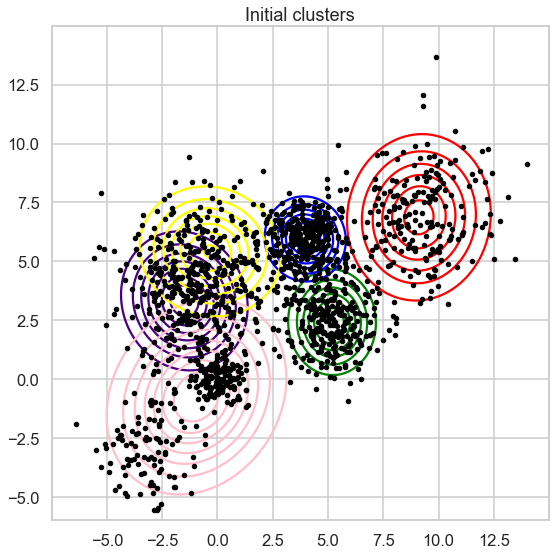

In [140]:
# Parameters after initialization
# run the Gaussian Matrix with covariance type equal to 'full'
plot_contours(Multi_blob_Data, gmm.means_, gmm.covariances_, 'Initial clusters')

###### My method for contour

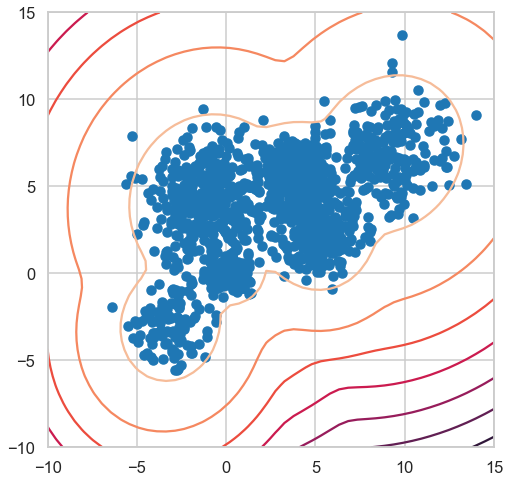

In [78]:
#Contour
X, Y = np.meshgrid(np.linspace(-10, 15), np.linspace(-10,15))
XX = np.array([X.ravel(), Y.ravel()]).T
Z = gmm.score_samples(XX)
Z = Z.reshape((50,50))
plt.contour(X, Y, Z)
plt.scatter(X4[:, 0], X4[:, 1])
plt.show()

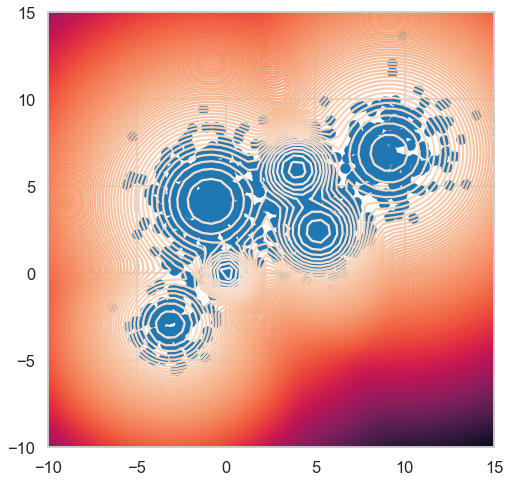

In [50]:
#Contour with 200 region
X, Y = np.meshgrid(np.linspace(-10, 15), np.linspace(-10,15))
XX = np.array([X.ravel(), Y.ravel()]).T
Z = gmm.score_samples(XX)
Z = Z.reshape((50,50))
plt.contour(X, Y, Z, 200)
plt.scatter(X4[:, 0], X4[:, 1])
plt.show()

In [ ]:
# # import matplotlib.mlab as mlab
# from scipy.stats import multivariate_normal
# def plot_contours(data, means, covs, title):
#     plt.figure()
#     plt.plot([x[0] for x in data], [y[1] for y in data],'k.') # data

#     delta = 0.025
#     k = len(means)
#     x = np.arange(-6, 15, delta)
#     y = np.arange(-6, 15, delta)
#     X, Y = np.meshgrid(x, y)
#     col = 'rainbow'
#     for i in range(k):
#         mean = means[i]
#         cov = covs[i]
#         sigmax = np.sqrt(cov[0][0])
#         sigmay = np.sqrt(cov[1][1])
#         sigmaxy = cov[0][1]/(sigmax*sigmay)
#         rv = multivariate_normal([mean[0], mean[1]],[[sigmax, sigmaxy] ,[sigmay,sigmaxy]])
#         Z = rv.pdf(np.dstack((X, Y)))
#         plt.contour(X, Y, Z, cmap = col)
#         plt.title(title)
#     plt.rcParams.update({'font.size':16})
#     plt.tight_layout()

# # Parameters after initialization
# plot_contours(customer_data_array_scaled, gmm.means_, gmm.covariances_, 'Initial clusters')

### ======================================================================================
### ======================================================================================

## iris data set 
The iris data set is test data set that is part of the Sklearn module 
which contains 150 records each with 4 features. All the features are represented by real numbers 

The data represents three classes 


[reference 1](http://www.lac.inpe.br/~rafael.santos/Docs/CAP394/WholeStory-Iris.html)

In [4]:
# from sklearn.datasets import load_iris
# iris_data = load_iris()
# iris_data.target[[10, 25, 50]]
# #array([0, 0, 1])
# list(iris_data.target_names)
# # ['setosa', 'versicolor', 'virginica']

['setosa', 'versicolor', 'virginica']

In [60]:
# iris_data

{'data': array([[5.1, 3.5, 1.4, 0.2],
        [4.9, 3. , 1.4, 0.2],
        [4.7, 3.2, 1.3, 0.2],
        [4.6, 3.1, 1.5, 0.2],
        [5. , 3.6, 1.4, 0.2],
        [5.4, 3.9, 1.7, 0.4],
        [4.6, 3.4, 1.4, 0.3],
        [5. , 3.4, 1.5, 0.2],
        [4.4, 2.9, 1.4, 0.2],
        [4.9, 3.1, 1.5, 0.1],
        [5.4, 3.7, 1.5, 0.2],
        [4.8, 3.4, 1.6, 0.2],
        [4.8, 3. , 1.4, 0.1],
        [4.3, 3. , 1.1, 0.1],
        [5.8, 4. , 1.2, 0.2],
        [5.7, 4.4, 1.5, 0.4],
        [5.4, 3.9, 1.3, 0.4],
        [5.1, 3.5, 1.4, 0.3],
        [5.7, 3.8, 1.7, 0.3],
        [5.1, 3.8, 1.5, 0.3],
        [5.4, 3.4, 1.7, 0.2],
        [5.1, 3.7, 1.5, 0.4],
        [4.6, 3.6, 1. , 0.2],
        [5.1, 3.3, 1.7, 0.5],
        [4.8, 3.4, 1.9, 0.2],
        [5. , 3. , 1.6, 0.2],
        [5. , 3.4, 1.6, 0.4],
        [5.2, 3.5, 1.5, 0.2],
        [5.2, 3.4, 1.4, 0.2],
        [4.7, 3.2, 1.6, 0.2],
        [4.8, 3.1, 1.6, 0.2],
        [5.4, 3.4, 1.5, 0.4],
        [5.2, 4.1, 1.5, 0.1],
  

In [62]:
# type(iris_data)

sklearn.utils.Bunch

In [58]:
# iris_data.target_names[1]

'versicolor'

In [59]:
# # Get first 5 rows of each subset
# str(iris_data)
# subset(iris_data, Species == "setosa")[1:5,]

In [248]:
from sklearn.datasets import load_iris
iris_data = load_iris()
iris_data.target[[10, 25, 50]]
#array([0, 0, 1])
list(iris_data.target_names)
# ['setosa', 'versicolor', 'virginica']

['setosa', 'versicolor', 'virginica']

In [249]:
df = pd.DataFrame(iris_data.data, columns=iris_data.feature_names)
df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


In [250]:
iris_data_array = df.to_numpy()
iris_data_array

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
       [4.9, 3

* Repeat all the above clustering approaches and steps on the above data 
* Normalize the data then repeat all the above steps 
* Compare between the different clustering approaches 

-----------------------------------------------------------------------
-----------------------------------------------------------------------
###### KMEANS

Text(0.5, 0, 'All Silhoutte scores : [0.681, 0.553, 0.498, 0.489, 0.365] Optimal Silhoutte : 0.681 (Optimal k : 2)')

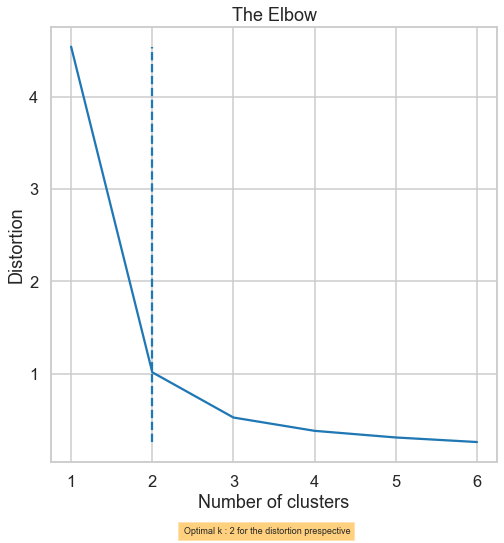

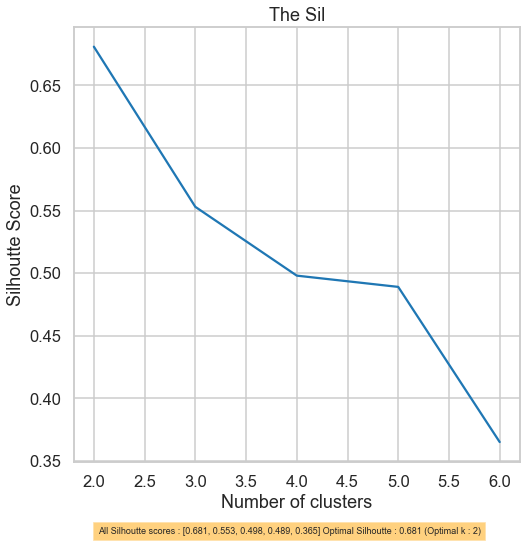

In [86]:
#wcss => distortion function for certain K
wcss=[]
sil=[]
for i in range(1,7): # i = number_clusters
    # Calculate Distortion from KMeans
    kmeans = KMeans(i)
    X1 = iris_data_array
    kmeans.fit(X1)
    wcss_iter = kmeans.inertia_ / len(X1) #to get a small number to observe easily
    wcss.append(wcss_iter)
    
    # Calculate Silhoutte Score
    #https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam
    if(i>1):
        score = silhouette_score(X1, kmeans.labels_, metric='euclidean')
        # Print the score
        sil.append(float('%.3f' % score))
####################################################################


number_clusters = range(1,7) #silhouette_score requires more than 1 cluster labels to can compare
#Plot Distortion for each no. of clusters
plt.figure()
plt.plot(number_clusters,wcss)
plt.title('The Elbow')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')

# Specify the ELbow Point
from knee_locator import KneeLocator
kn = KneeLocator(number_clusters, wcss, curve='convex', direction='decreasing')
#print(f'Optimal k : {kn.knee} for the distortion prespective')
plt.figtext(0.5, 0, (f'Optimal k : {kn.knee} for the distortion prespective'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
plt.vlines(kn.knee, min(wcss), max(wcss), linestyles='dashed')
#####################################################################

number_clusters = range(2,7) #silhouette_score requires more than 1 cluster labels to can compare
#Plot Silhoutte Score for each no. of clusters
plt.figure()
plt.plot(number_clusters,sil)
plt.title('The Sil')
plt.xlabel('Number of clusters')
plt.ylabel('Silhoutte Score')

# Specify the max(optimal) Silhoutte Score as optimal
##print(f'All Silhoutte scores : {(sil)} Optimal Silhoutte : {max(sil)} (Optimal k : {sil.index(max(sil))+2})')
plt.figtext(0.5, 0, (f'All Silhoutte scores : {sil} Optimal Silhoutte : {max(sil)} (Optimal k : {sil.index(max(sil))+2})'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
        
# plt.figure()  
# plt.title("The Sil") 
#plt.vlines(max(sil), min(sil), max(sil), linestyles='dashed')



In [138]:
def Two_D_Kmeans(TheDataFrame,k):
    
    #All unique possible combinations of the dataframe
    from itertools import combinations
    cc= list(combinations(TheDataFrame.columns,2))

    #loop over each combination
    for i in range(len(list(combinations(TheDataFrame.columns,2)))):
        tmp = pd.concat([TheDataFrame[cc[i][0]],(TheDataFrame[cc[i][1]])],axis = 1)
        
        
        #convert series to dataframe for columns name regarding figures
        dataframe = pd.DataFrame(tmp)
        
        #convert series to dataframe to np array
        array = np.array(dataframe)
        
        
        km = KMeans(n_clusters = k).fit(array)
        
        
        #visualize
        display_cluster(array, km, num_clusters)
        plt.title(f'{(dataframe.columns).tolist()}\n',fontsize = 14, fontweight ='bold')
        
        # Calculate distortion
        d = km.inertia_ /len(array)
        
        # Calculate Silhoutte Score
        score = silhouette_score(array, km.labels_, metric='euclidean')
        # placeholder the score
        s = 'Silhouetter Score: %.3f' % score
        
        #https://stackoverflow.com/questions/16066695/add-an-extra-information-in-a-python-plot/43768254  
        plt.figtext(0.5, 0, (f'The distortion : {d}\n The {s}'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
        plt.figure() 

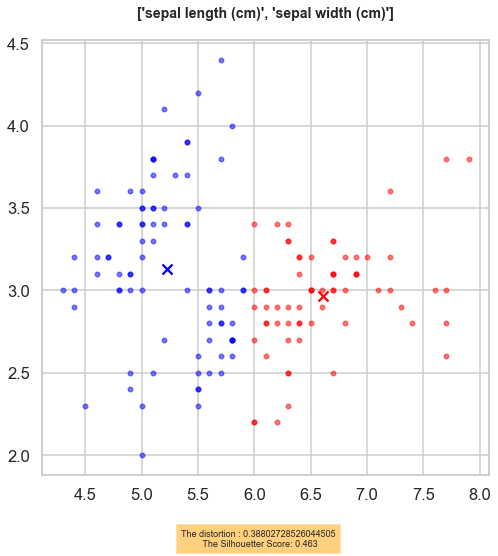

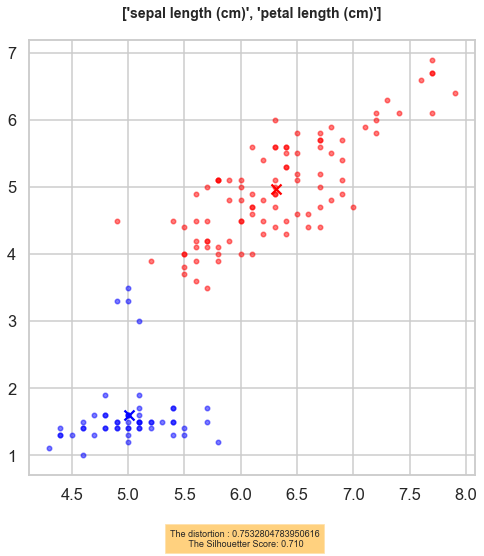

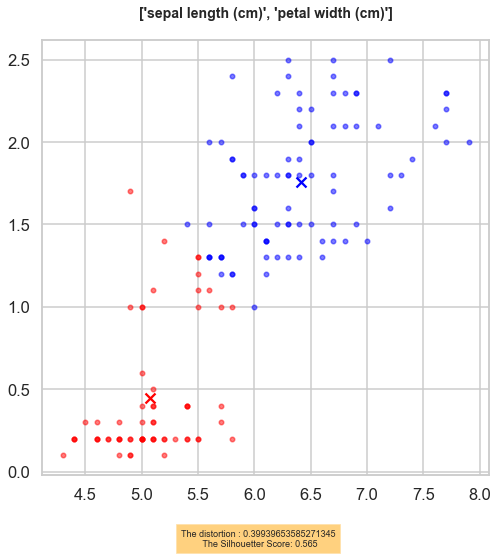

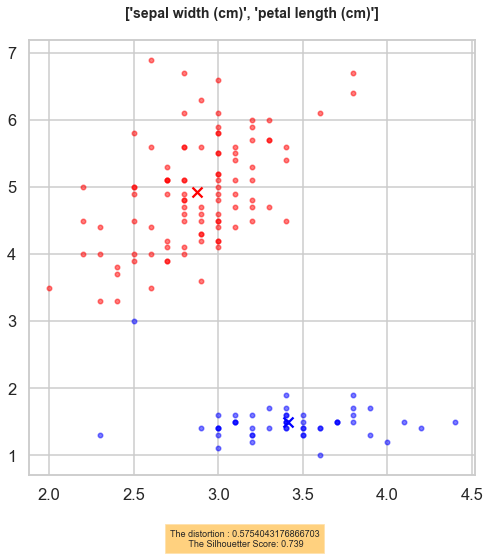

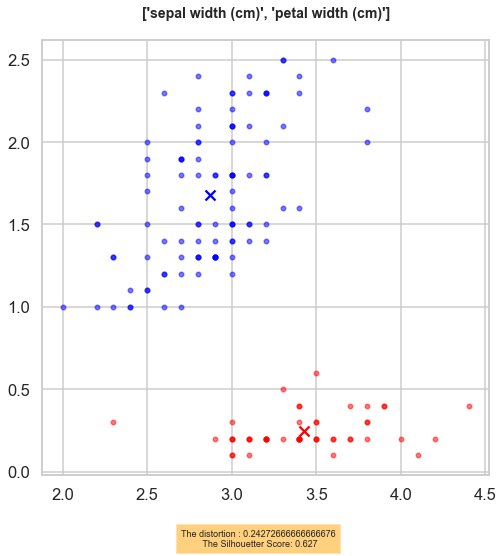

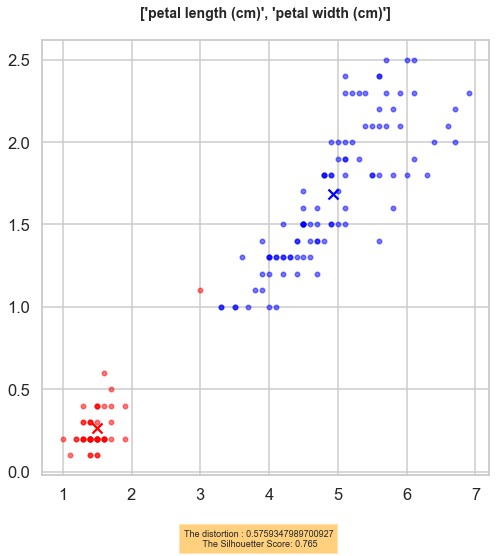

<Figure size 576x576 with 0 Axes>

In [141]:
Two_D_Kmeans(df,2)

-----------------------------------------------------------------------
-----------------------------------------------------------------------
###### Hierarchical

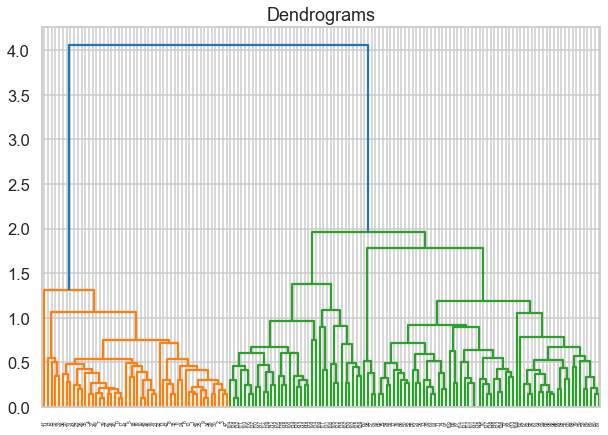

In [74]:
import scipy.cluster.hierarchy as shc
Y2 = iris_data_array
plt.figure(figsize=(10, 7))   
plt.title("Dendrograms") 
dend = shc.dendrogram(shc.linkage(Y2, method='average'))

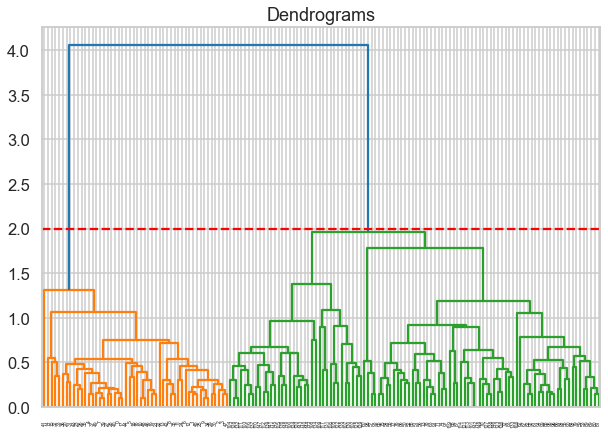

In [75]:
# The vertical line with maximum distance is the blue line and hence we can decide a threshold of '2' and cut the dendrogram
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(Y2, method='average'))
plt.axhline(y=2, color='r', linestyle='--')

In [142]:
def Two_D_Hierarchical(TheDataFrame, k, DistanceThreshold, AffinityType, LinkageType):
    
    #All unique possible combinations of the dataframe
    from itertools import combinations
    cc= list(combinations(TheDataFrame.columns,2))

    #loop over each combination
    for i in range(len(list(combinations(TheDataFrame.columns,2)))):
        tmp = pd.concat([TheDataFrame[cc[i][0]],(TheDataFrame[cc[i][1]])],axis = 1)
        
        
        #convert series to dataframe for columns name regarding figures
        dataframe = pd.DataFrame(tmp)
        
        #convert series to dataframe to np array
        array = np.array(dataframe)
        
        
        km = AgglomerativeClustering(n_clusters=k, distance_threshold=DistanceThreshold , affinity=AffinityType, linkage=LinkageType)
        km.fit_predict(array)
        
        
        #visualize
        plt.figure(figsize=(10, 7))
        plt.scatter(array[:,0], array[:,1], c=km.labels_, cmap='rainbow')
        plt.title(f'{(dataframe.columns).tolist()}\n',fontsize = 14, fontweight ='bold')
        
        # Calculate Silhoutte Score
        score = silhouette_score(array, km.labels_, metric='euclidean')
        # placeholder the score
        s = 'Silhouetter Score: %.3f' % score
        
        #https://stackoverflow.com/questions/16066695/add-an-extra-information-in-a-python-plot/43768254  
        plt.figtext(0.5, 0, (f'The {s}'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
        plt.figure()

All of affinity types have same effect here

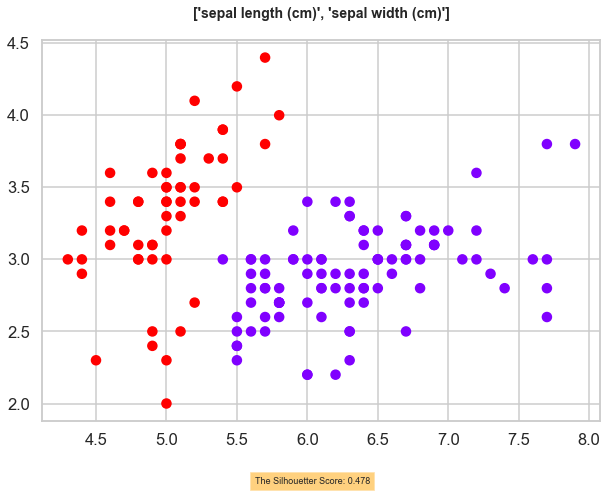

<Figure size 576x576 with 0 Axes>

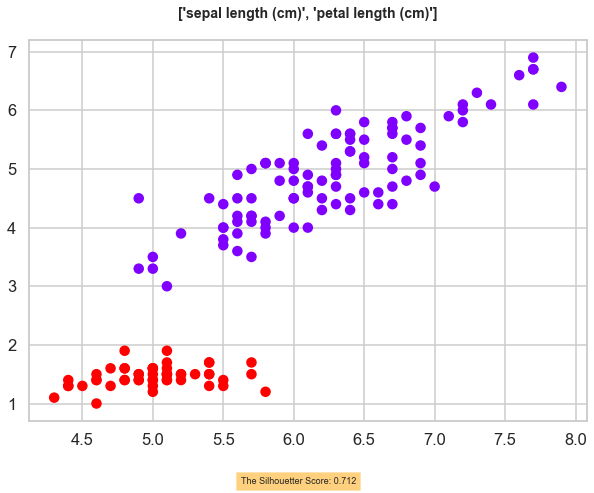

<Figure size 576x576 with 0 Axes>

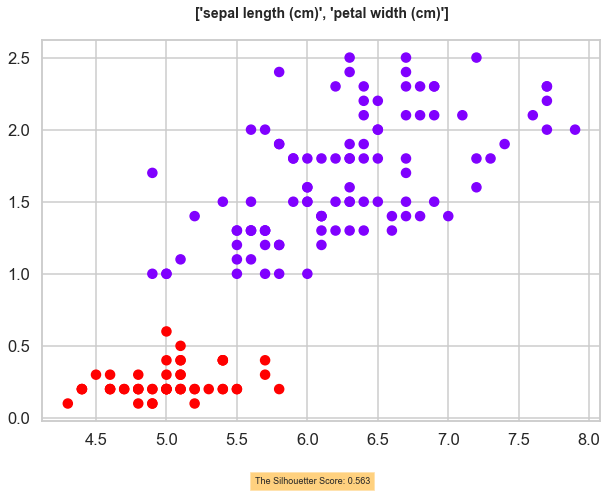

<Figure size 576x576 with 0 Axes>

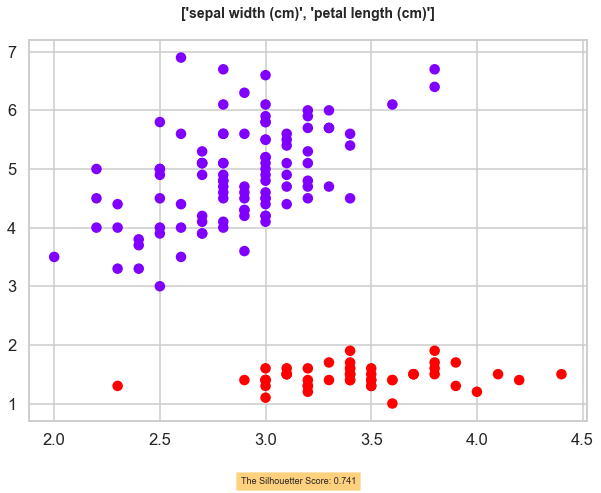

<Figure size 576x576 with 0 Axes>

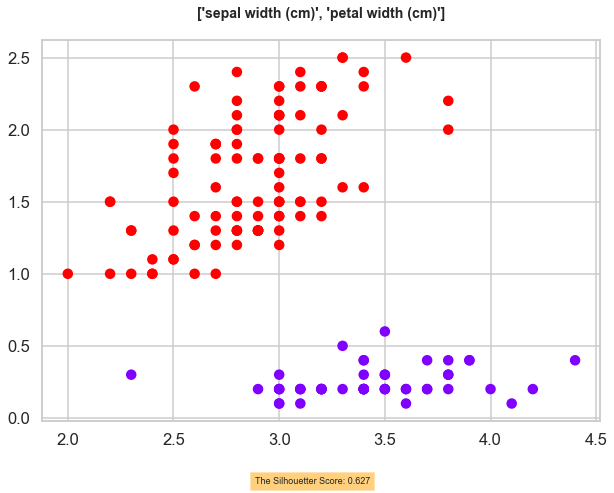

<Figure size 576x576 with 0 Axes>

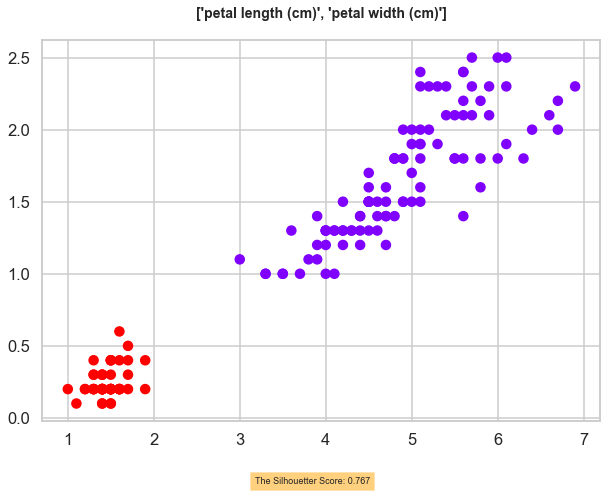

<Figure size 576x576 with 0 Axes>

In [240]:
# We have 'three' clusters as this line cuts the dendrogram at 'two' points.
# Let’s now apply hierarchical clustering for 2 clusters:
from sklearn.cluster import AgglomerativeClustering
Two_D_Hierarchical(df, 2, None, 'euclidean', 'average')

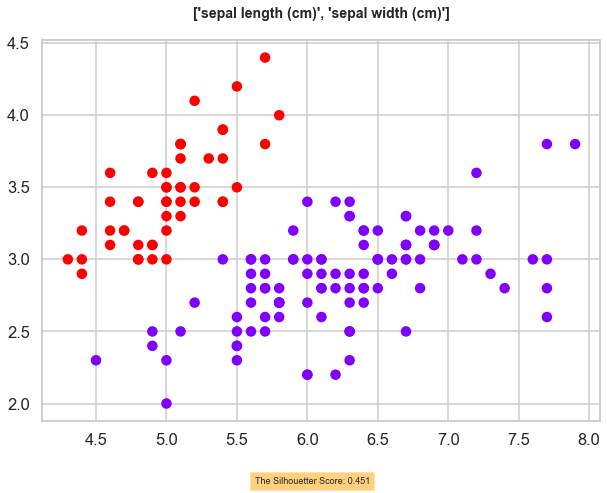

<Figure size 576x576 with 0 Axes>

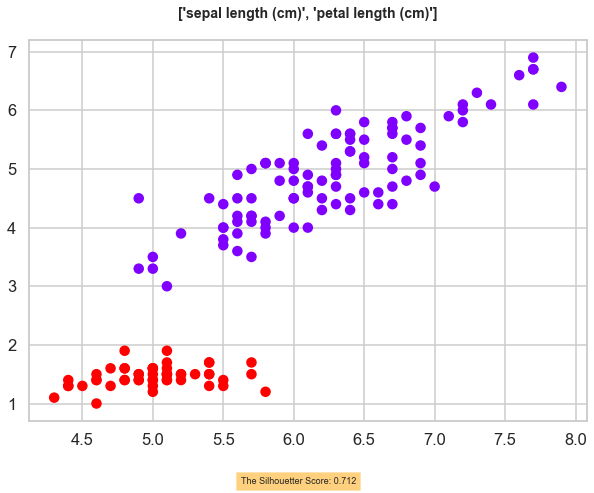

<Figure size 576x576 with 0 Axes>

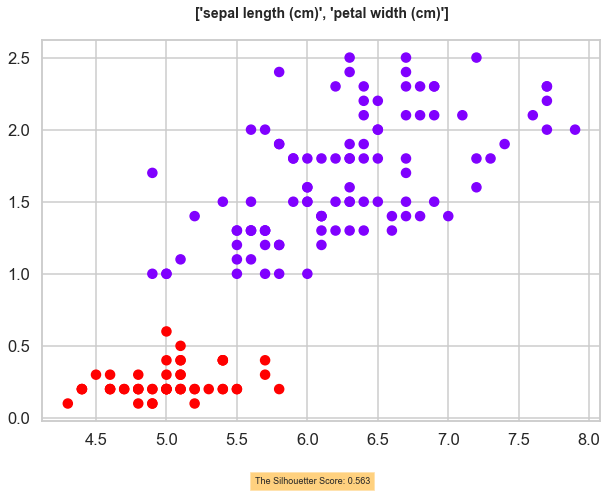

<Figure size 576x576 with 0 Axes>

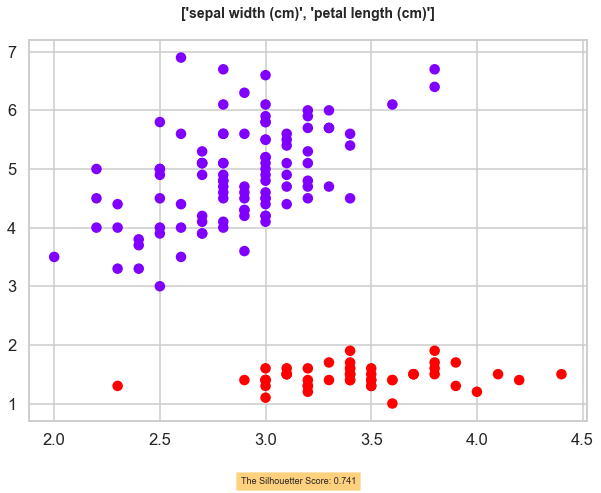

<Figure size 576x576 with 0 Axes>

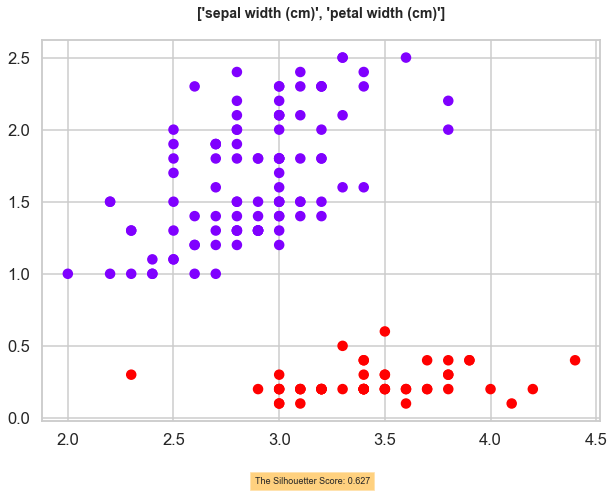

<Figure size 576x576 with 0 Axes>

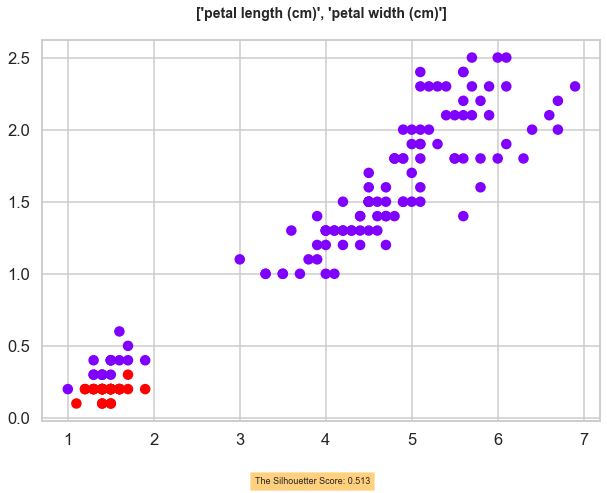

<Figure size 576x576 with 0 Axes>

In [241]:
# We have 'three' clusters as this line cuts the dendrogram at 'two' points.
# Let’s now apply hierarchical clustering for 2 clusters:
from sklearn.cluster import AgglomerativeClustering
Two_D_Hierarchical(df, 2, None, 'cosine', 'average')

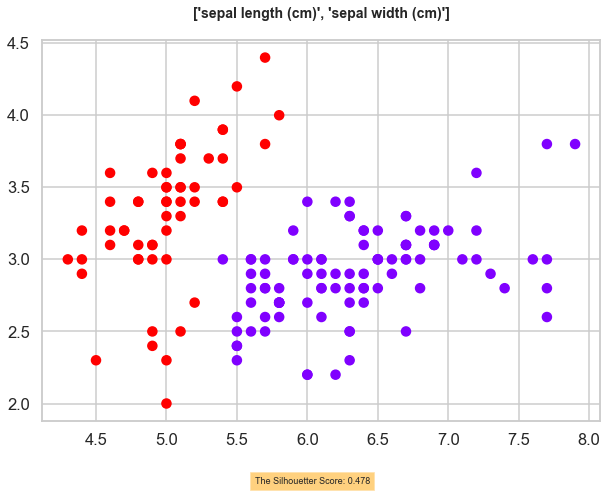

<Figure size 576x576 with 0 Axes>

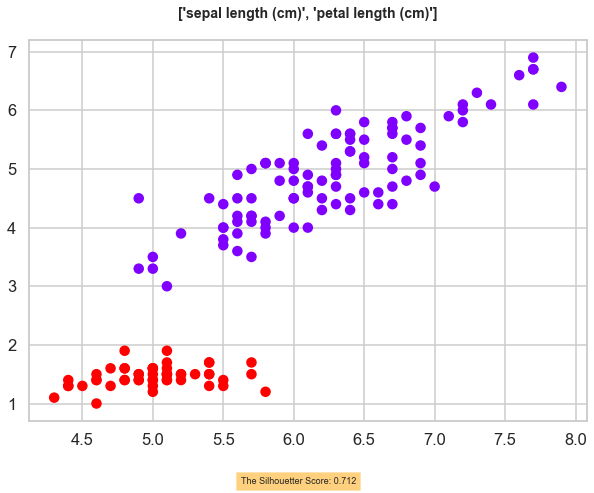

<Figure size 576x576 with 0 Axes>

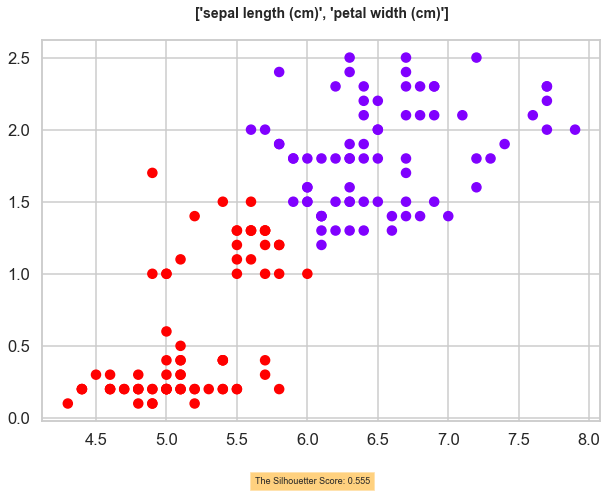

<Figure size 576x576 with 0 Axes>

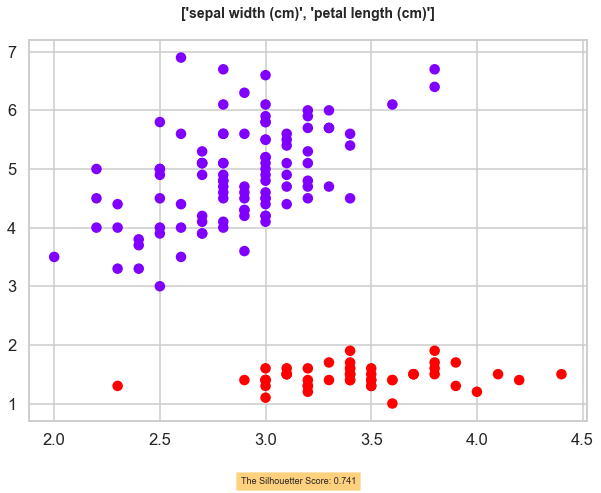

<Figure size 576x576 with 0 Axes>

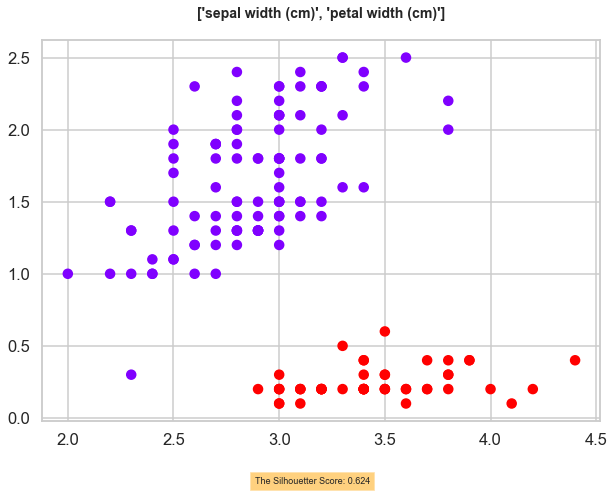

<Figure size 576x576 with 0 Axes>

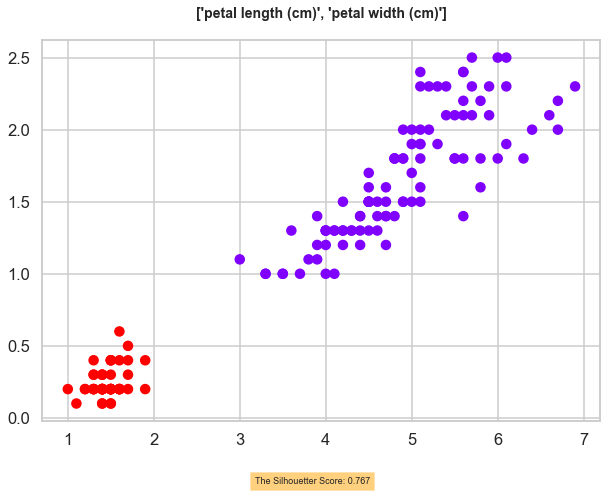

<Figure size 576x576 with 0 Axes>

In [197]:
# We have 'three' clusters as this line cuts the dendrogram at 'two' points.
# Let’s now apply hierarchical clustering for 2 clusters:
from sklearn.cluster import AgglomerativeClustering
Two_D_Hierarchical(df, 2, None, 'manhattan', 'average')

-----------------------------------------------------------------------
-----------------------------------------------------------------------
###### DBSCAN

In [83]:
Y3 = iris_data_array
#For epsilon, the K-distance graph is used. For plotting a K-distance Graph, we need the distance between a point and its nearest data point for all data points in the dataset. We obtain this using NearestNeighbors from sklearn.neighbors.
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(Y3)
distances, indices = nbrs.kneighbors(Y3)

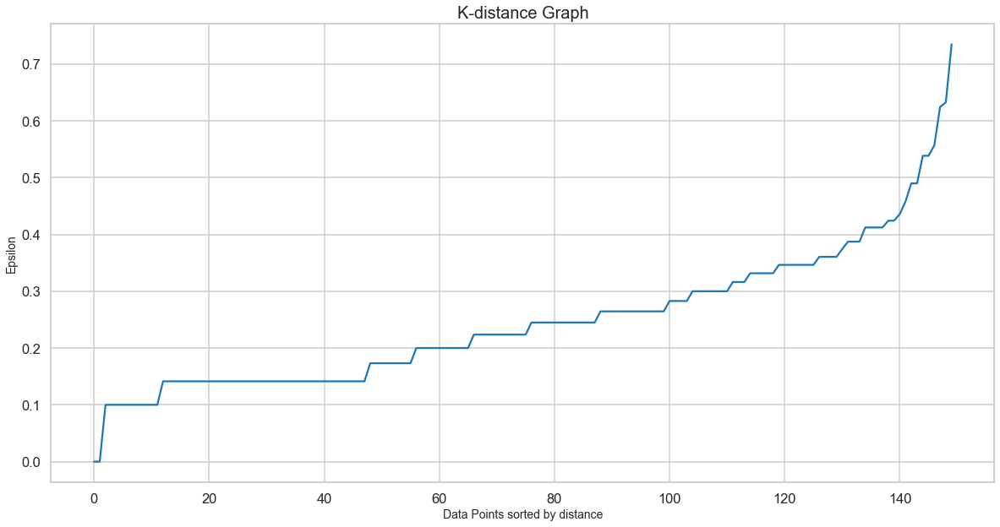

In [84]:
#Let’s plot our K-distance graph and find the value of epsilon. Use the following syntax:

# Plotting K-distance Graph
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

#The optimum value of epsilon is at the point of maximum curvature in the K-Distance Graph = 0.4
#The value of minPoints also depends on domain knowledge. This time I am taking minPoints as 6
# or loop over the range of 5 to 25 and get the first maximum silhouette-score as the optimal

In [154]:
#helper
def Two_D_DBSCAN(TheDataFrame,epsilon,minPoints):
    
    #All unique possible combinations of the dataframe
    from itertools import combinations
    cc= list(combinations(TheDataFrame.columns,2))

    #loop over each combination
    for i in range(len(list(combinations(TheDataFrame.columns,2)))):
        tmp = pd.concat([TheDataFrame[cc[i][0]],(TheDataFrame[cc[i][1]])],axis = 1)
        
        
        #convert series to dataframe for columns name regarding figures
        dataframe = pd.DataFrame(tmp)
        
        #convert series to dataframe to np array
        array = np.array(dataframe)
        
        #type of algorithm approach
        km = DBSCAN(eps=epsilon,min_samples=minPoints)
        km.fit_predict(array)
        
        
        #visualize
        plt.figure(figsize=(10, 7))
        plt.scatter(array[:,0], array[:,1], c=km.labels_, cmap='rainbow')
        plt.title(f'{(dataframe.columns).tolist()}\n',fontsize = 14, fontweight ='bold')
        
        # Calculate Silhoutte Score
        score = silhouette_score(array, km.labels_, metric='euclidean')
        # placeholder the score
        s = 'Silhouetter Score: %.3f' % score
        
         # Number of clusters in labels, ignoring noise if present.
        labels = km.labels_
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        c= n_clusters_
        
        plt.figtext(0.5, 0, (f'The Number of clusters : {c}\n The {s}'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
        plt.figure()
        
        


In [189]:
from sklearn.cluster import DBSCAN
Y3 = iris_data_array
sill_all = []
clusters_all = []
for i in range(5, 25):
    dbscan=DBSCAN(eps=0.5,min_samples=i)
    dbscan.fit_predict(Y3)


    # Number of clusters in labels, ignoring noise if present.
    labels = dbscan.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    clusters_all.append(n_clusters_)
    #print(f'{i}) Number of clusters = {n_clusters_}')

    # Calculate Silhoutte Score
    score = silhouette_score(Y3, dbscan.labels_, metric='euclidean')
    sil33 = '%.3f' % score
    sill_all.append(float(sil33))
    
    # Print the score
    print(f'{i}) Number of clusters = {n_clusters_}\n Silhoutte Score Value = {sil33}')

5) Number of clusters = 2
 Silhoutte Score Value = 0.486
6) Number of clusters = 2
 Silhoutte Score Value = 0.477
7) Number of clusters = 2
 Silhoutte Score Value = 0.464
8) Number of clusters = 2
 Silhoutte Score Value = 0.450
9) Number of clusters = 2
 Silhoutte Score Value = 0.432
10) Number of clusters = 2
 Silhoutte Score Value = 0.423
11) Number of clusters = 3
 Silhoutte Score Value = 0.365
12) Number of clusters = 3
 Silhoutte Score Value = 0.329
13) Number of clusters = 3
 Silhoutte Score Value = 0.328
14) Number of clusters = 2
 Silhoutte Score Value = 0.357
15) Number of clusters = 2
 Silhoutte Score Value = 0.278
16) Number of clusters = 2
 Silhoutte Score Value = 0.250
17) Number of clusters = 1
 Silhoutte Score Value = 0.632
18) Number of clusters = 1
 Silhoutte Score Value = 0.632
19) Number of clusters = 1
 Silhoutte Score Value = 0.632
20) Number of clusters = 1
 Silhoutte Score Value = 0.632
21) Number of clusters = 1
 Silhoutte Score Value = 0.600
22) Number of clust

Silhoutte Score Optimal Value at minPoints = 17


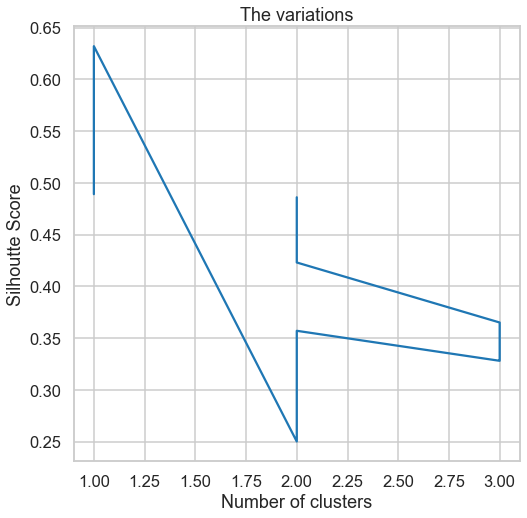

In [190]:
#Plot the silhouette_score versus the variation in the optimal EPS and the min_samples
print(f'Silhoutte Score Optimal Value at minPoints = {sill_all.index(max(sill_all))+5}')
plt.figure()
plt.title('The variations')
plt.xlabel('Number of clusters')
plt.ylabel('Silhoutte Score')
plt.plot(clusters_all,sill_all)

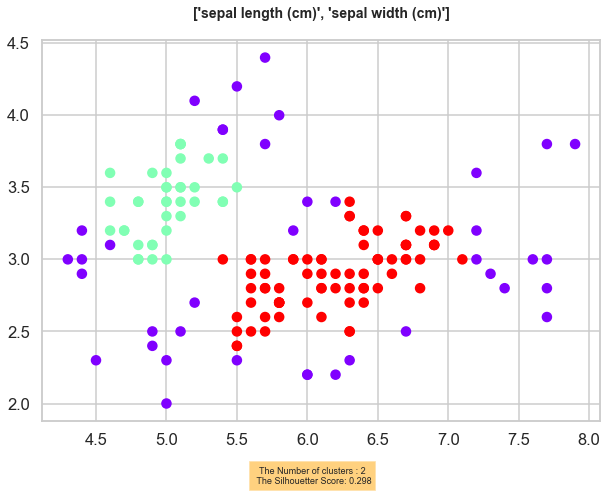

<Figure size 576x576 with 0 Axes>

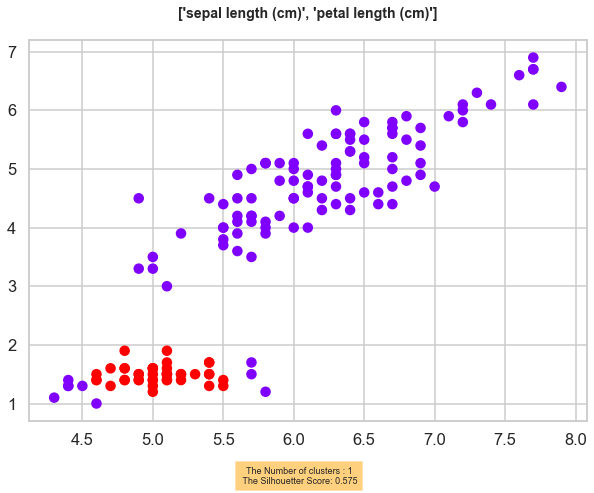

<Figure size 576x576 with 0 Axes>

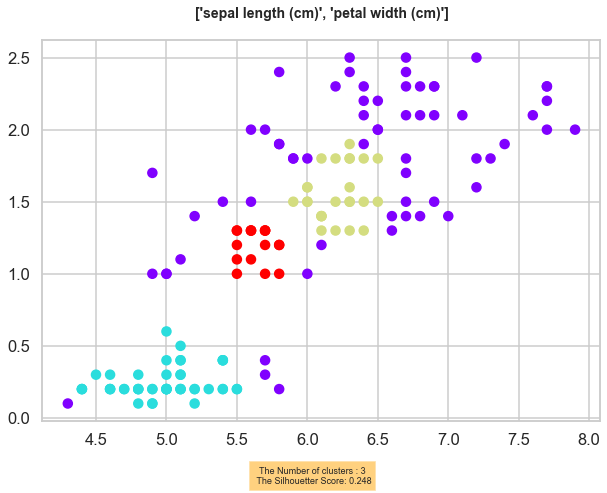

<Figure size 576x576 with 0 Axes>

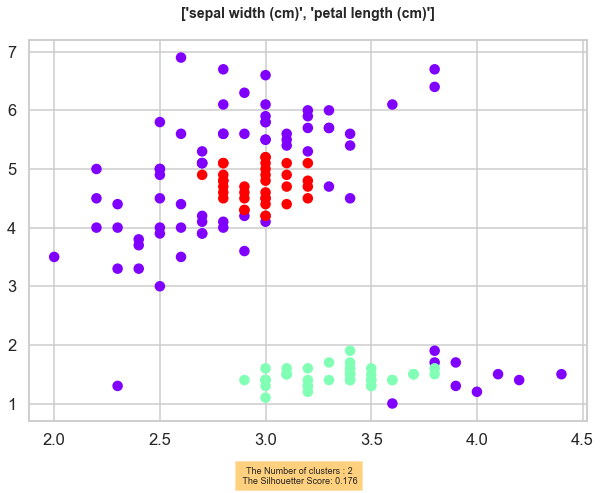

<Figure size 576x576 with 0 Axes>

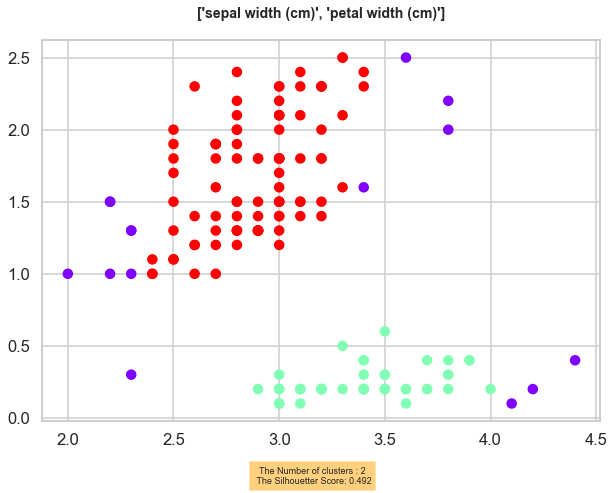

<Figure size 576x576 with 0 Axes>

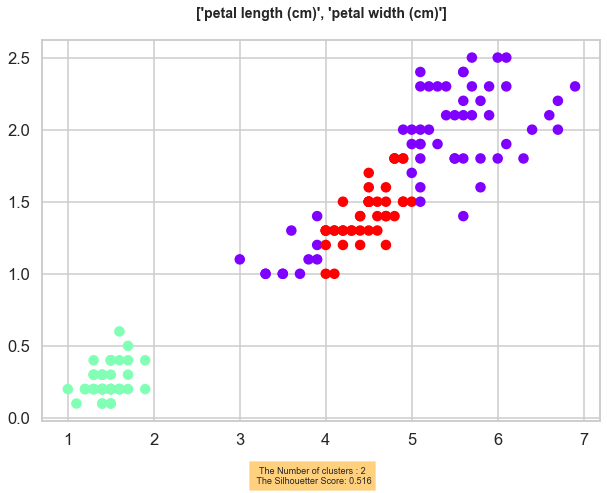

<Figure size 576x576 with 0 Axes>

In [158]:
#optimal min no of points = 17
from sklearn.cluster import DBSCAN
Two_D_DBSCAN(df,0.3,17)

-----------------------------------------------------------------------
-----------------------------------------------------------------------
##### Gaussian Mixture

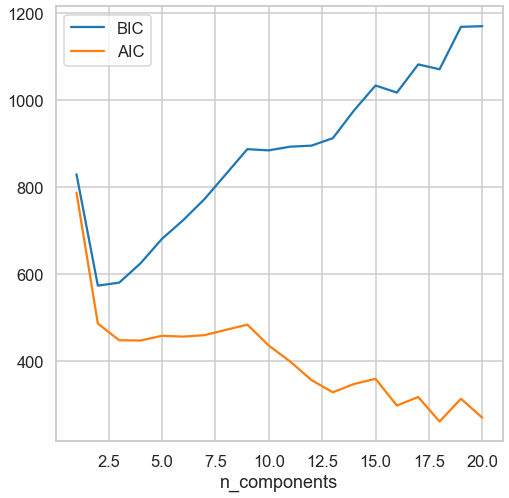

In [87]:
# the optimal number of components (that minimizes the AIC or BIC)
n_components = np.arange(1, 21)
Y4 = iris_data_array
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(Y4)
          for n in n_components]

plt.plot(n_components, [m.bic(Y4) for m in models], label='BIC')
plt.plot(n_components, [m.aic(Y4) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

In [162]:
#helper
def Two_D_GMM(TheDataFrame, NoOfComponents, CovarianceType):
    
    #All unique possible combinations of the dataframe
    from itertools import combinations
    cc= list(combinations(TheDataFrame.columns,2))

    #loop over each combination
    for i in range(len(list(combinations(TheDataFrame.columns,2)))):
        tmp = pd.concat([TheDataFrame[cc[i][0]],(TheDataFrame[cc[i][1]])],axis = 1)
        
        
        #convert series to dataframe for columns name regarding figures
        dataframe = pd.DataFrame(tmp)
        
        #convert series to dataframe to np array
        array = np.array(dataframe)
        
        #type of algorithm approach
        km = GaussianMixture(n_components=NoOfComponents, covariance_type=CovarianceType).fit(array)
        labels = km.predict(array)
        
        
        #visualize
        plt.figure(figsize=(10, 7))
        plt.scatter(array[:, 0], array[:, 1], c=labels, s=40, cmap='rainbow');
        plt.title(f'{(dataframe.columns).tolist()}\n',fontsize = 14, fontweight ='bold')
        
        # Calculate Silhoutte Score
        score = silhouette_score(array, labels, metric='euclidean')
        # placeholder the score
        s = 'Silhouetter Score: %.3f' % score
        
        # Number of clusters in labels, ignoring noise if present.
        n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
        c= n_clusters_
        
        plt.figtext(0.5, 0, (f'The Number of clusters : {c}\n The {s}'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
        plt.figure()

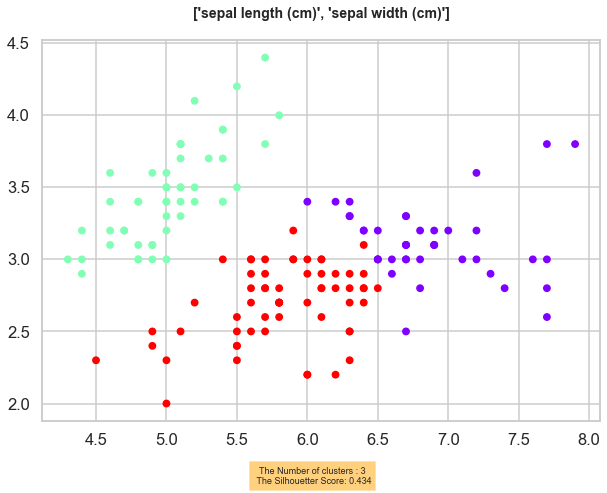

<Figure size 576x576 with 0 Axes>

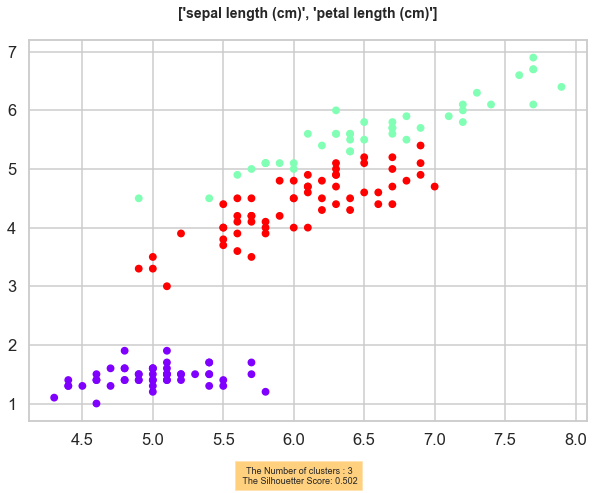

<Figure size 576x576 with 0 Axes>

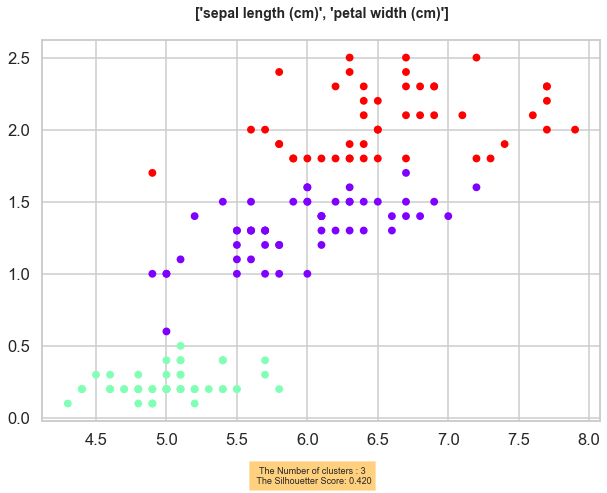

<Figure size 576x576 with 0 Axes>

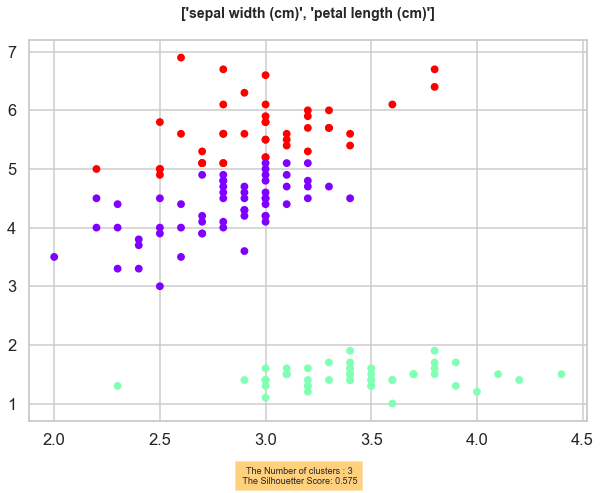

<Figure size 576x576 with 0 Axes>

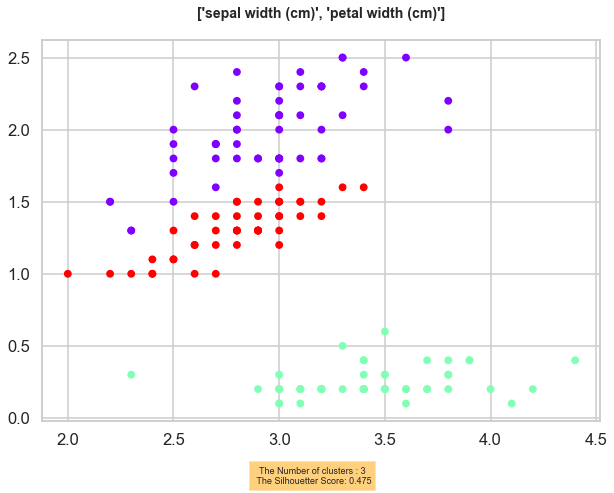

<Figure size 576x576 with 0 Axes>

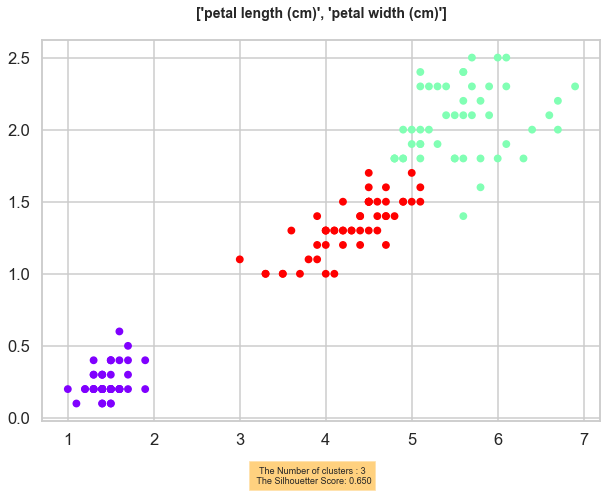

<Figure size 576x576 with 0 Axes>

In [163]:
#the optimal n_components equal 3
from sklearn.mixture import GaussianMixture
Two_D_GMM(df, 3, "full")

##### clustering mutlifeatures dataset using ggplot plotline

In [ ]:
x_iris = pd.DataFrame(iris_data.data, columns=['Sepal Length', 'Sepal Width', 'Petal Length', 'Petal Width'])
x_iris

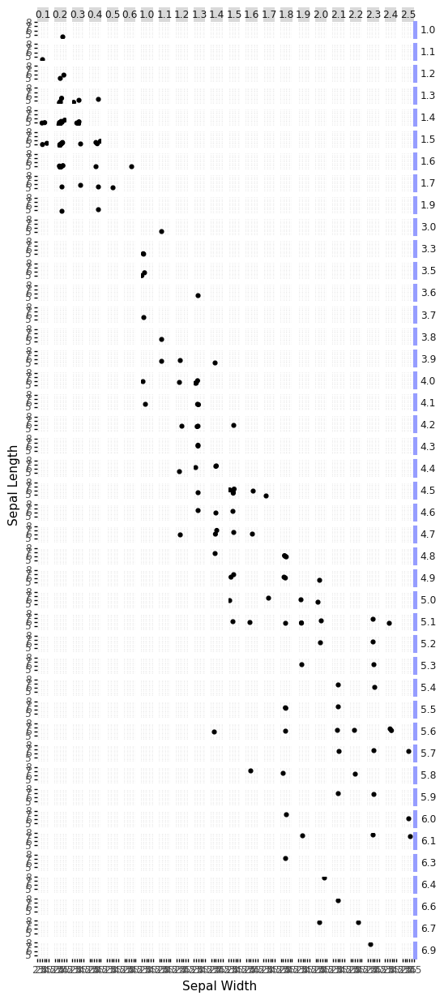

<ggplot: (101350811938)>

In [264]:
(
    ggplot(x_iris, aes(x='Sepal Width', y='Sepal Length'))
    + geom_point()
    + facet_grid('Petal Length  ~ Petal Width ') # use + to add additional faceting variables
    
    + theme(strip_text_y = element_text(angle = 0,              # change facet text angle
                                        ha = 'left'             # change text alignment
                                       ),
            strip_background_y = element_text(color = '#969dff' # change background colour of facet background
                                              , width = 0.2     # adjust width of facet background to fit facet text
                                             ), figure_size=(6, 15)                                 # adjust width & height of figure to fit y-axis
           )+ labs(x='Sepal Width', y='Sepal Length')
)

##### contour

In [91]:
#contour works only on 2 features of dataset
Y4 = iris_data_array[:, :2] #all rows besides two columns
gmm = GaussianMixture(n_components=4, covariance_type="full").fit(Y4)

In [92]:
print(gmm.means_)
print('\n')
print(gmm.covariances_)
print('\n')
probs = gmm.predict_proba(X4)
print(probs[:5].round(3))

[[5.80233376 2.64158591]
 [5.0160611  3.45216465]
 [6.46429019 3.03290812]
 [7.72166804 3.17732818]]


[[[0.27248376 0.05885453]
  [0.05885453 0.07984786]]

 [[0.11956492 0.08811585]
  [0.08811585 0.11838488]]

 [[0.22012174 0.02450769]
  [0.02450769 0.04330105]]

 [[0.00804674 0.02450959]
  [0.02450959 0.2296922 ]]]


[[0.008 0.992 0.    0.   ]
 [1.    0.    0.    0.   ]
 [1.    0.    0.    0.   ]
 [0.356 0.644 0.    0.   ]
 [1.    0.    0.    0.   ]]


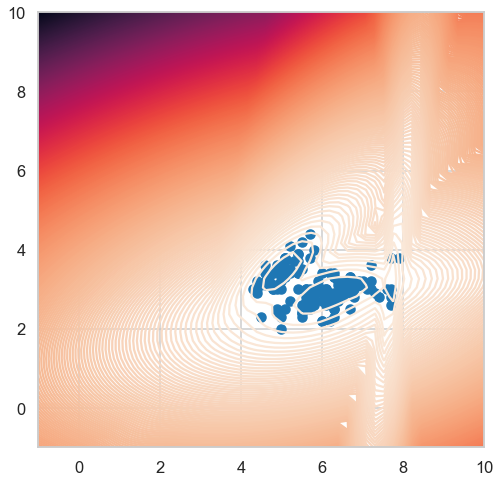

In [101]:
# https://jakevdp.github.io/PythonDataScienceHandbook/04.04-density-and-contour-plots.html
# https://matplotlib.org/3.5.1/api/_as_gen/matplotlib.pyplot.contour.html
# https://www.mghassany.com/MLcourse/pw-6.html
# https://scitools-iris.readthedocs.io/en/latest/_modules/iris/plot.html#contour

#Contour with 500 regions
X, Y = np.meshgrid(np.linspace(-1,10), np.linspace(-1,10))
XX = np.array([X.ravel(), Y.ravel()]).T
Z = gmm.score_samples(XX)   # we only take the first two features.
Z = Z.reshape((50,50))
plt.contour(X, Y, Z, 500)
plt.scatter(Y4[:, 0], Y4[:, 1])
plt.show()

##### generalizing the previous method of contour

In [119]:
def Two_D_contour_regions(TheDataFrame, n, cov_type, NoRegions):
    
    #All unique possible combinations of the dataframe
    from itertools import combinations
    cc= list(combinations(TheDataFrame.columns,2))

    #loop over each combination
    for i in range(len(list(combinations(TheDataFrame.columns,2)))):
        tmp = pd.concat([TheDataFrame[cc[i][0]],(TheDataFrame[cc[i][1]])],axis = 1)
        
        
        #convert series to dataframe for columns name regarding figures
        dataframe = pd.DataFrame(tmp)
        
        #convert series to dataframe to np array
        array = dataframe.to_numpy()
      
        #fit
        gmm = GaussianMixture(n_components=n, covariance_type=cov_type).fit(array)
        
        #visualize Contour with 500 regions
        X, Y = np.meshgrid(np.linspace(-5,10), np.linspace(-5,10))
        XX = np.array([X.ravel(), Y.ravel()]).T
        Z = gmm.score_samples(XX)   # we only take the first two features.
        Z = Z.reshape((50,50))
        plt.contour(X, Y, Z, NoRegions)
        plt.scatter(array[:, 0], array[:, 1])
        plt.show()
        
        plt.figtext(0.5, 0, (f'{cc[i]}'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
#         plt.figure() 

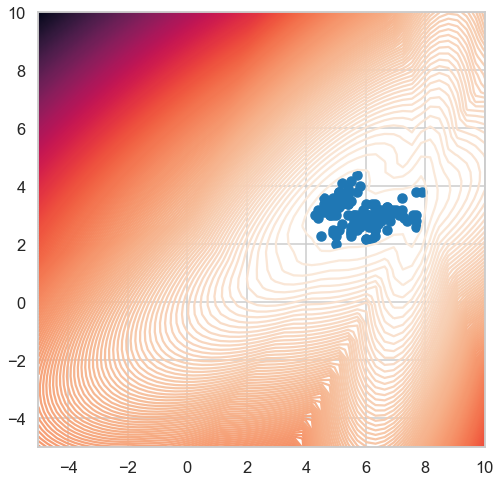

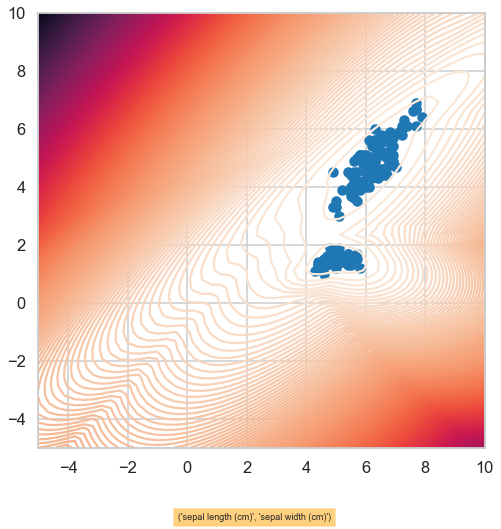

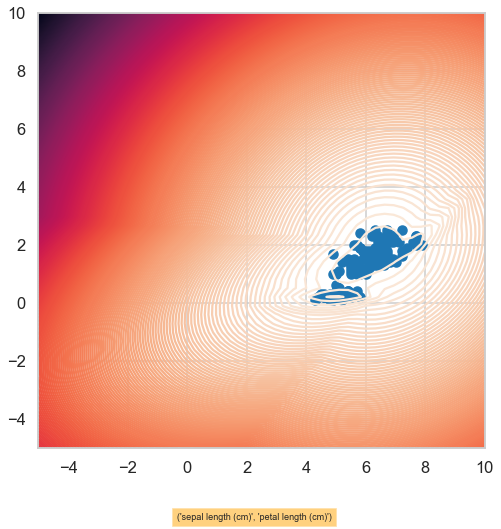

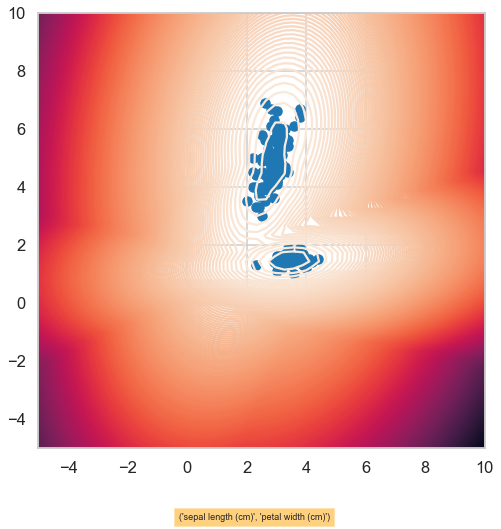

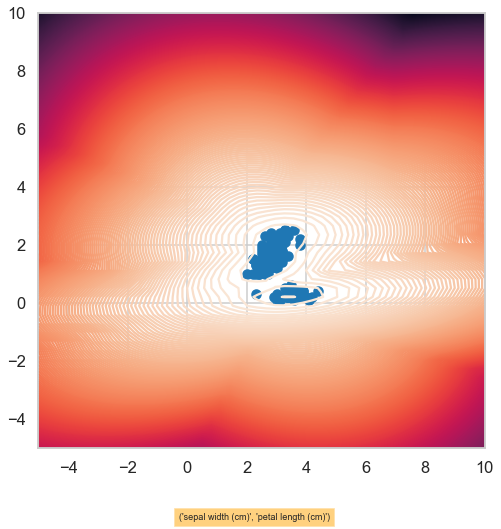

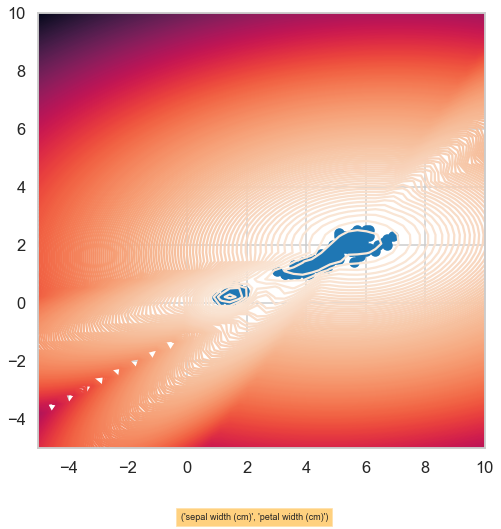

<Figure size 576x576 with 0 Axes>

In [120]:
Two_D_contour_regions(df, 4, 'full', 300)

In [41]:
# #All unique possible combinations of the dataframe
# from itertools import combinations
# cc= list(combinations(df.columns,2))

# #loop over each combination
# for i in range(len(list(combinations(df.columns,2)))):
#     tmp = pd.concat([df[cc[i][0]],(df[cc[i][1]])],axis = 1)
#     print(cc[i])

('sepal length (cm)', 'sepal width (cm)')
('sepal length (cm)', 'petal length (cm)')
('sepal length (cm)', 'petal width (cm)')
('sepal width (cm)', 'petal length (cm)')
('sepal width (cm)', 'petal width (cm)')
('petal length (cm)', 'petal width (cm)')


##### another method for contour

In [103]:
def Two_D_contour(TheDataFrame, n, cov_type):
    
    #All unique possible combinations of the dataframe
    from itertools import combinations
    cc= list(combinations(TheDataFrame.columns,2))

    #loop over each combination
    for i in range(len(list(combinations(TheDataFrame.columns,2)))):
        tmp = pd.concat([TheDataFrame[cc[i][0]],(TheDataFrame[cc[i][1]])],axis = 1)
        
        
        #convert series to dataframe for columns name regarding figures
        dataframe = pd.DataFrame(tmp)
        
        #convert series to dataframe to np array
        array = dataframe.to_numpy()
        
        #gmm fit
        gmm = GaussianMixture(n_components=n, covariance_type=cov_type).fit(array)
      
        #visualize the contour
        plot_contours(array, gmm.means_, gmm.covariances_, '2d clusters')
        
        plt.figtext(0.5, 0, (f'{cc[i]}'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
#         plt.figure() 

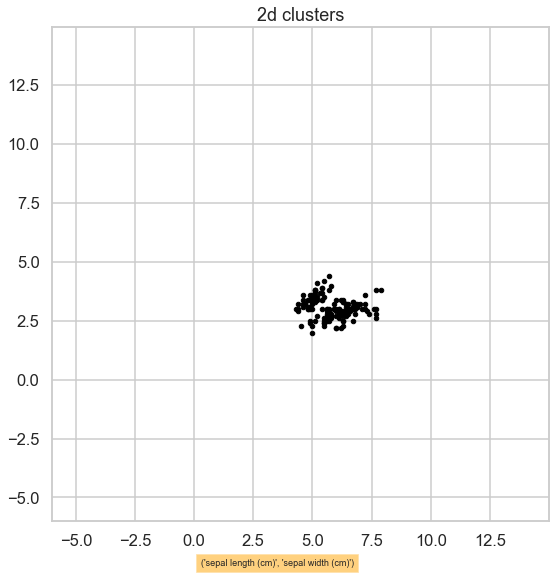

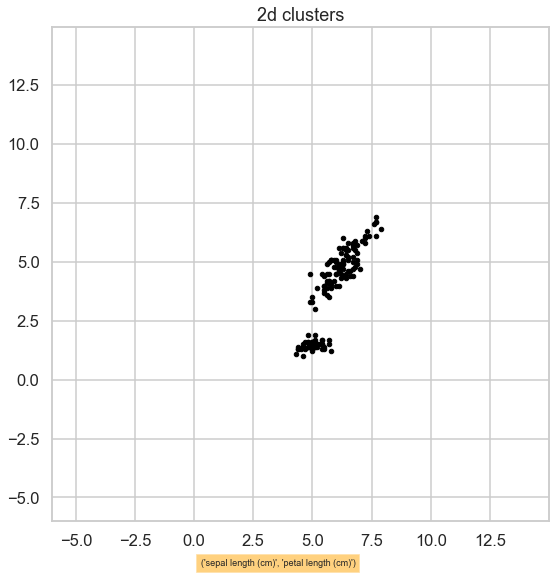

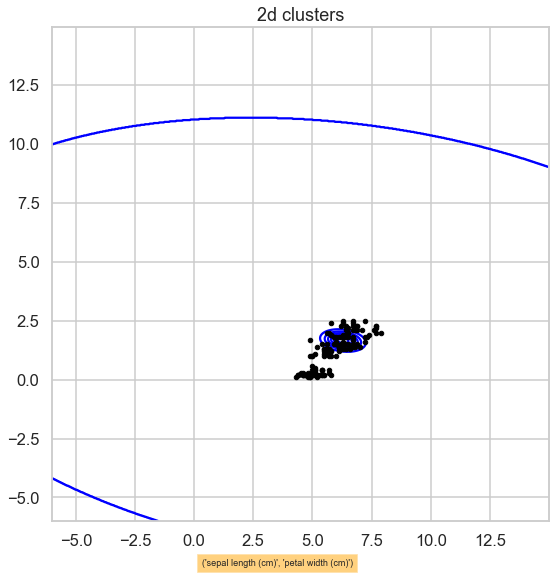

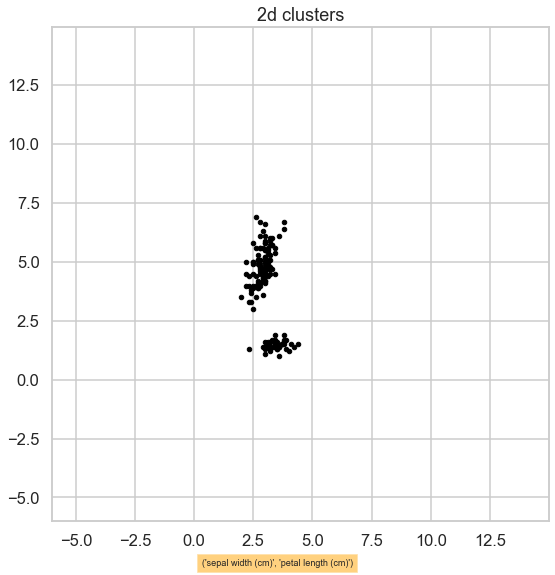

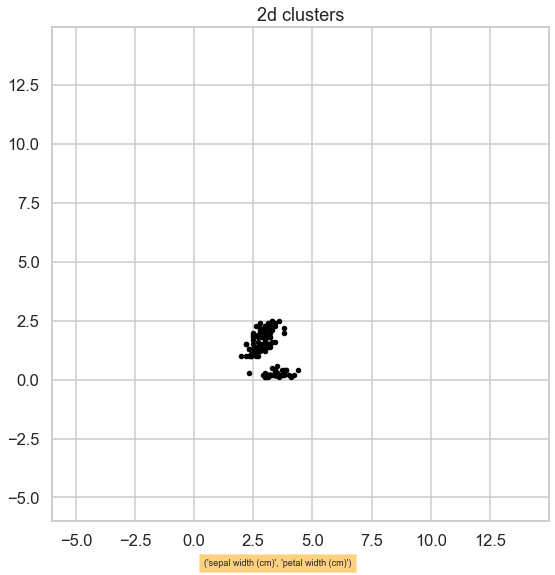

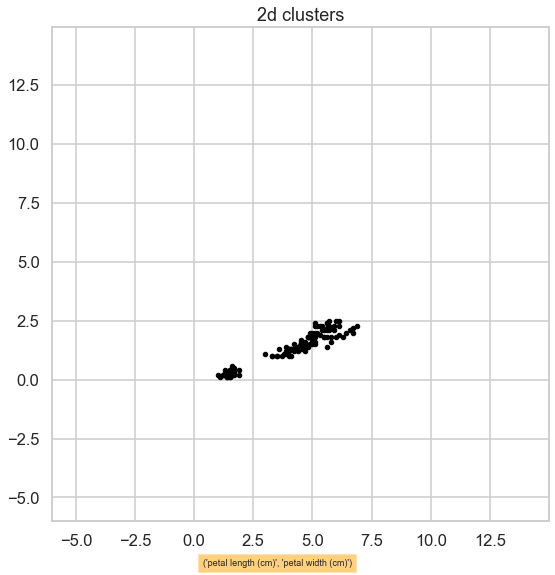

In [104]:
Two_D_contour(df, 4, 'full')

----------------------------------------------------------------

### Why Feature Scaling ?
> 1. Since the range of values of raw data varies widely, in some machine learning algorithms, objective functions will not work properly without normalization. For example, many classifiers calculate the distance between two points by the Euclidean distance. If one of the features has a broad range of values, the distance will be governed by this particular feature. Therefore, the range of all features should be normalized so that each feature contributes approximately proportionately to the final distance.
> 2. Another reason why feature scaling is applied is that gradient descent converges much faster with feature scaling than without it.
> 3. It is used to normalize the data within a particular range. It also aids in speeding up the calculations.
> 4. It's also important to apply feature scaling if regularization is used as part of the loss function (so that coefficients are penalized appropriately).
> 5.To make the scale of each variable is the same. Why is this important? Well, if the scale of the variables is not the same, the model might become biased towards the variables with a higher magnitude like Fresh or Milk (refer to the above table).

----------------------------------------------------------------

In [164]:
# the scaler - for robust scaling of Normalization
from sklearn.preprocessing import RobustScaler

# set up the scaler
scaler = RobustScaler()
# https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.RobustScaler.html
f = pd.DataFrame(df)
# fit the scaler to the train set, it will learn the parameters
scaler.fit(f)
# transform train and test sets
df_scaled = scaler.transform(f)
# let's transform the returned NumPy arrays to dataframes
df_scaled = pd.DataFrame(df_scaled, columns=f.columns)

df_scaled

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,-0.538462,1.0,-0.842857,-0.733333
1,-0.692308,0.0,-0.842857,-0.733333
2,-0.846154,0.4,-0.871429,-0.733333
3,-0.923077,0.2,-0.814286,-0.733333
4,-0.615385,1.2,-0.842857,-0.733333
...,...,...,...,...
145,0.692308,0.0,0.242857,0.666667
146,0.384615,-1.0,0.185714,0.400000
147,0.538462,0.0,0.242857,0.466667
148,0.307692,0.8,0.300000,0.666667


In [165]:
iris_data_array_scaled = df_scaled.to_numpy()
iris_data_array_scaled

array([[-0.53846154,  1.        , -0.84285714, -0.73333333],
       [-0.69230769,  0.        , -0.84285714, -0.73333333],
       [-0.84615385,  0.4       , -0.87142857, -0.73333333],
       [-0.92307692,  0.2       , -0.81428571, -0.73333333],
       [-0.61538462,  1.2       , -0.84285714, -0.73333333],
       [-0.30769231,  1.8       , -0.75714286, -0.6       ],
       [-0.92307692,  0.8       , -0.84285714, -0.66666667],
       [-0.61538462,  0.8       , -0.81428571, -0.73333333],
       [-1.07692308, -0.2       , -0.84285714, -0.73333333],
       [-0.69230769,  0.2       , -0.81428571, -0.8       ],
       [-0.30769231,  1.4       , -0.81428571, -0.73333333],
       [-0.76923077,  0.8       , -0.78571429, -0.73333333],
       [-0.76923077,  0.        , -0.84285714, -0.8       ],
       [-1.15384615,  0.        , -0.92857143, -0.8       ],
       [ 0.        ,  2.        , -0.9       , -0.73333333],
       [-0.07692308,  2.8       , -0.81428571, -0.6       ],
       [-0.30769231,  1.

-----------------------------------------------------------------------
-----------------------------------------------------------------------
###### Kmeans Scaled

Text(0.5, 0, 'All Silhoutte scores : [0.528, 0.444, 0.418, 0.386, 0.395] Optimal Silhoutte : 0.528 (Optimal k : 2)')

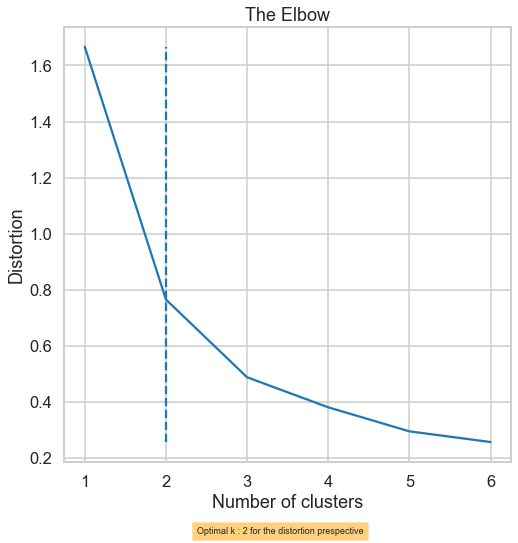

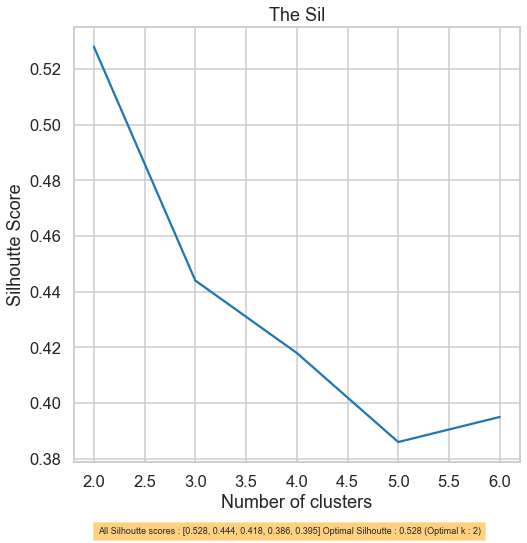

In [108]:
#wcss => distortion function for certain K
wcss=[]
sil=[]
for i in range(1,7): # i = number_clusters
    # Calculate Distortion from KMeans
    kmeans = KMeans(i)
    X1 = iris_data_array_scaled
    kmeans.fit(X1)
    wcss_iter = kmeans.inertia_ / len(X1) #to get a small number to observe easily
    wcss.append(wcss_iter)
    
    # Calculate Silhoutte Score
    #https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam
    if(i>1):
        score = silhouette_score(X1, kmeans.labels_, metric='euclidean')
        # Print the score
        sil.append(float('%.3f' % score))
####################################################################


number_clusters = range(1,7) #silhouette_score requires more than 1 cluster labels to can compare
#Plot Distortion for each no. of clusters
plt.figure()
plt.plot(number_clusters,wcss)
plt.title('The Elbow')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')

# Specify the ELbow Point
from knee_locator import KneeLocator
kn = KneeLocator(number_clusters, wcss, curve='convex', direction='decreasing')
plt.figtext(0.5, 0, (f'Optimal k : {kn.knee} for the distortion prespective'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
plt.vlines(kn.knee, min(wcss), max(wcss), linestyles='dashed')
#####################################################################

number_clusters = range(2,7) #silhouette_score requires more than 1 cluster labels to can compare
#Plot Silhoutte Score for each no. of clusters
plt.figure()
plt.plot(number_clusters,sil)
plt.title('The Sil')
plt.xlabel('Number of clusters')
plt.ylabel('Silhoutte Score')

# Specify the max(optimal) Silhoutte Score as optimal
plt.figtext(0.5, 0, (f'All Silhoutte scores : {sil} Optimal Silhoutte : {max(sil)} (Optimal k : {sil.index(max(sil))+2})'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})


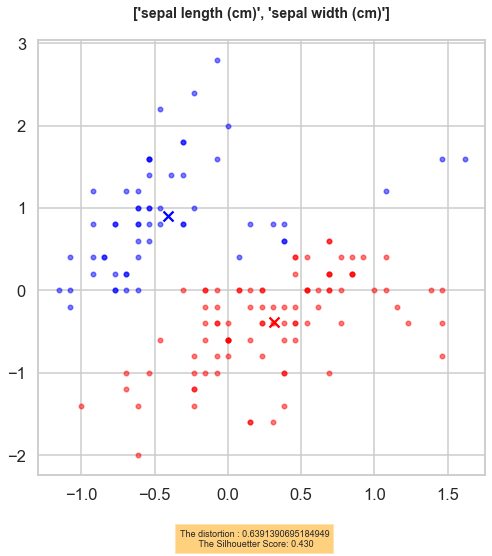

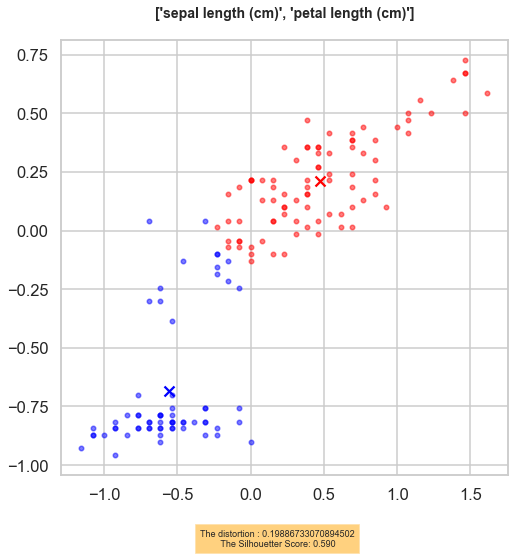

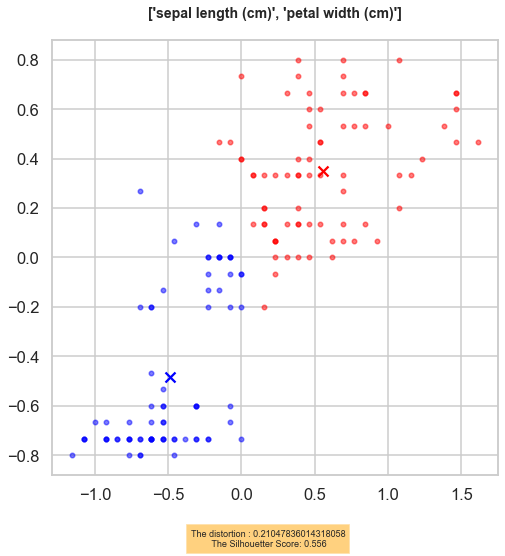

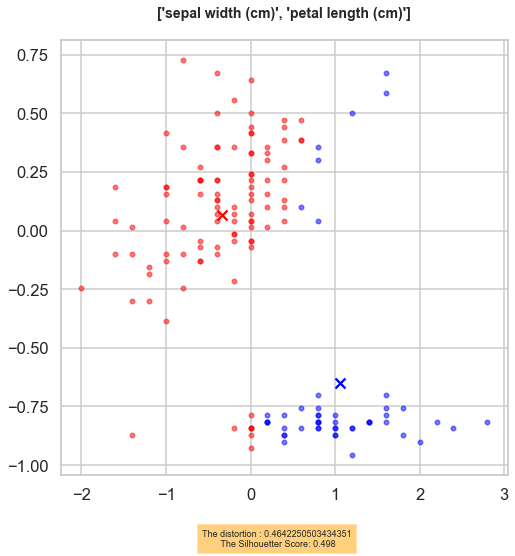

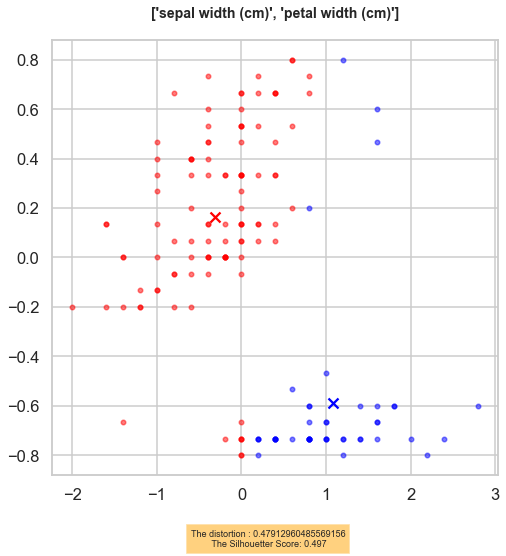

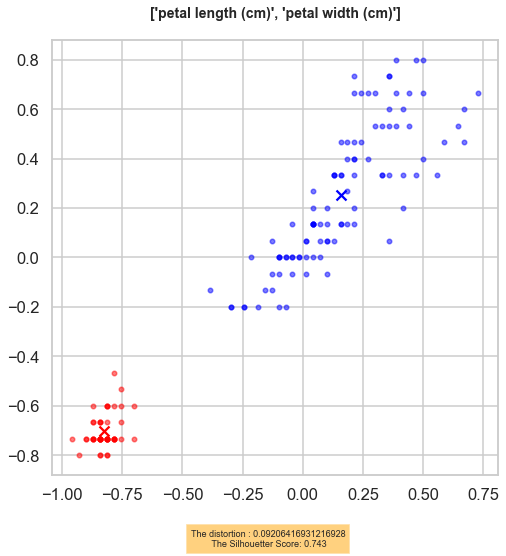

<Figure size 576x576 with 0 Axes>

In [166]:
Two_D_Kmeans(df_scaled,2)

-----------------------------------------------------------------------
-----------------------------------------------------------------------
###### Hierarchical Scaled

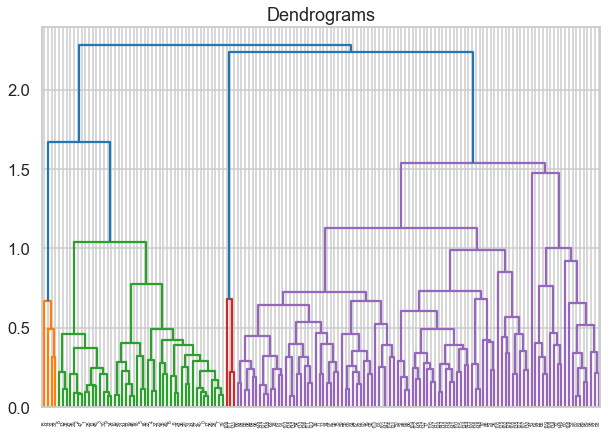

In [24]:
import scipy.cluster.hierarchy as shc
Z2 = iris_data_array_scaled
plt.figure(figsize=(10, 7))   
plt.title("Dendrograms") 
dend = shc.dendrogram(shc.linkage(Z2, method='average'))

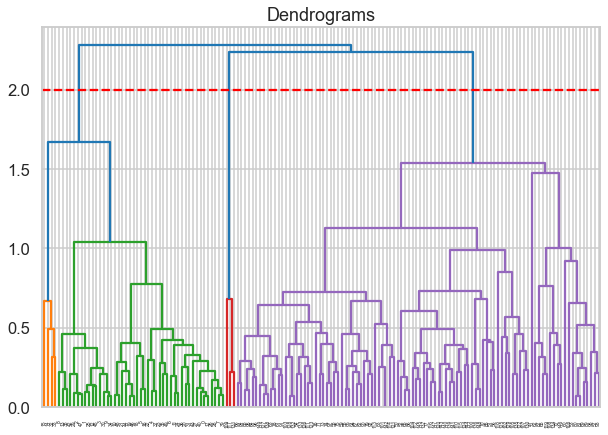

In [26]:
# The vertical line with maximum distance is the blue line and hence we can decide a threshold of '2' and cut the dendrogram
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(Z2, method='average'))
plt.axhline(y=2, color='r', linestyle='--')

manhattan is better here slightly than euclidean and cosine causing a problem

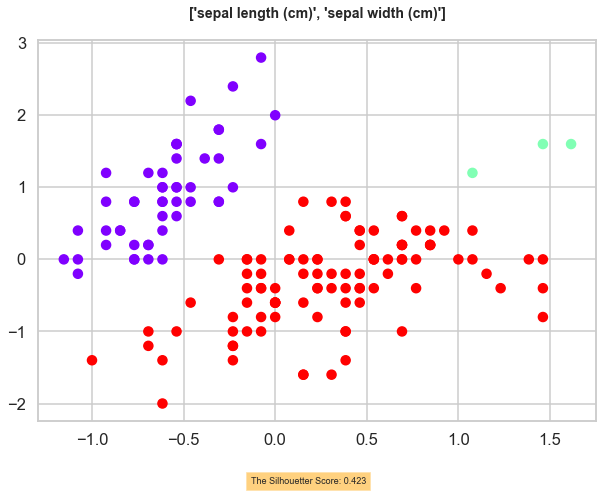

<Figure size 576x576 with 0 Axes>

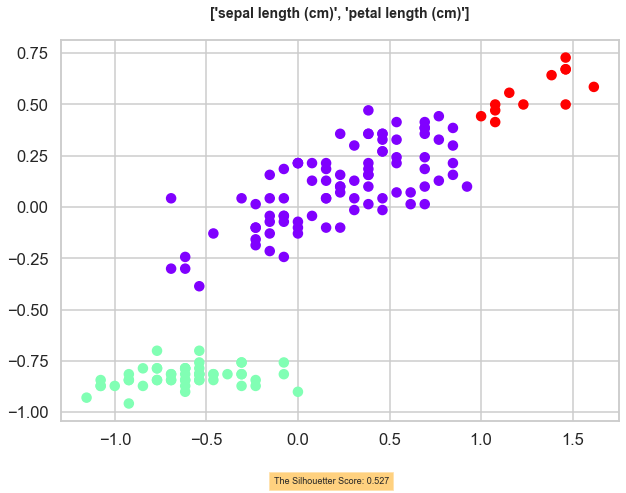

<Figure size 576x576 with 0 Axes>

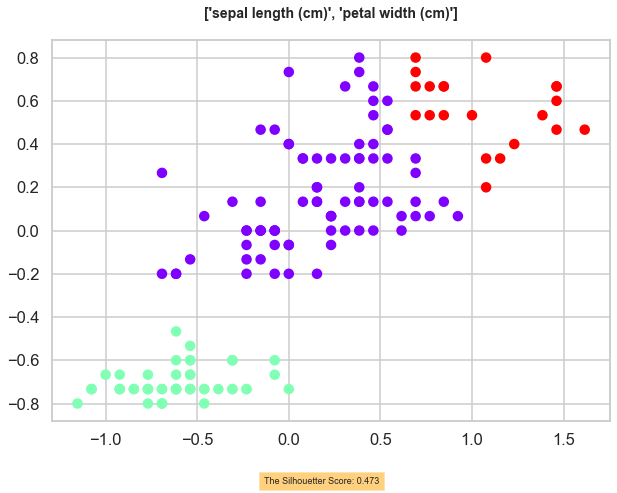

<Figure size 576x576 with 0 Axes>

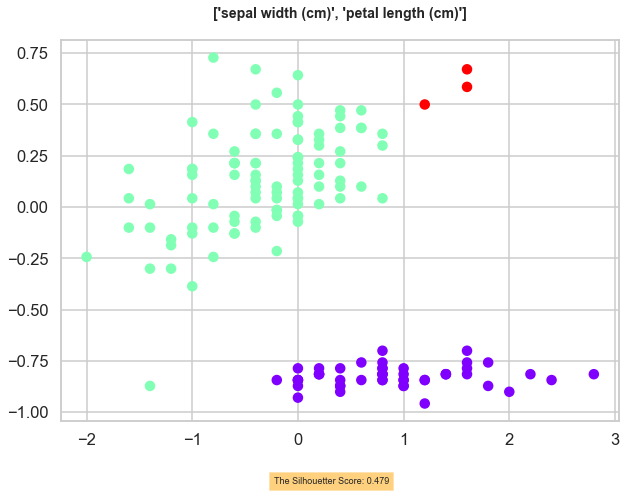

<Figure size 576x576 with 0 Axes>

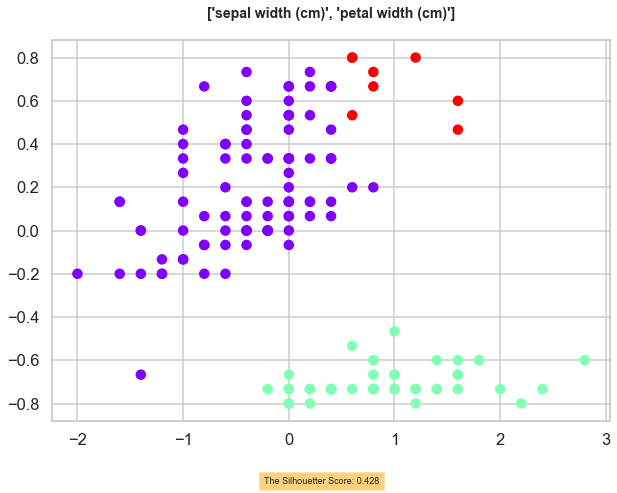

<Figure size 576x576 with 0 Axes>

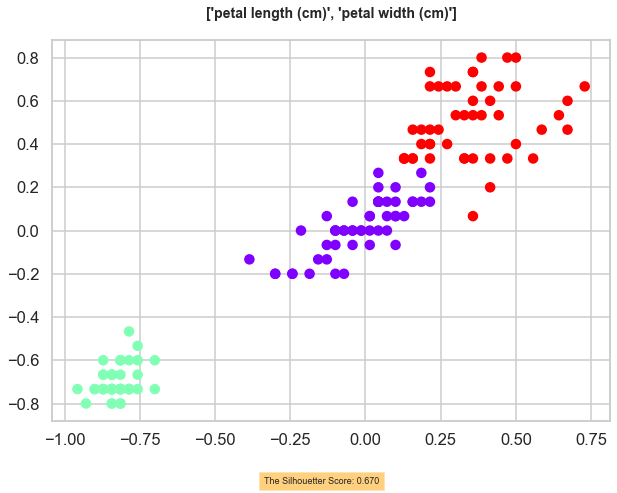

<Figure size 576x576 with 0 Axes>

In [198]:
# We have 'three' clusters as this line cuts the dendrogram at 'three' points.
# Let’s now apply hierarchical clustering for 3 clusters:
from sklearn.cluster import AgglomerativeClustering
Two_D_Hierarchical(df_scaled, 3, None, 'manhattan', 'average')

ValueError: Cosine affinity cannot be used when X contains zero vectors

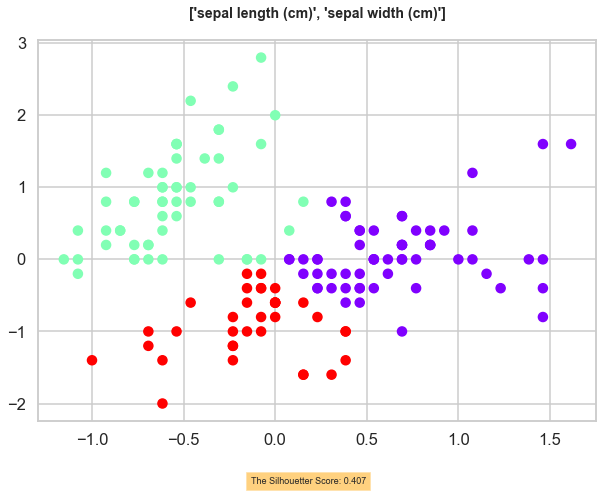

<Figure size 576x576 with 0 Axes>

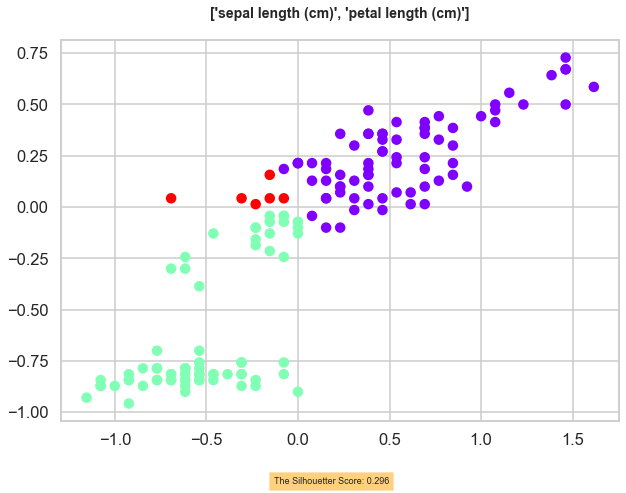

<Figure size 576x576 with 0 Axes>

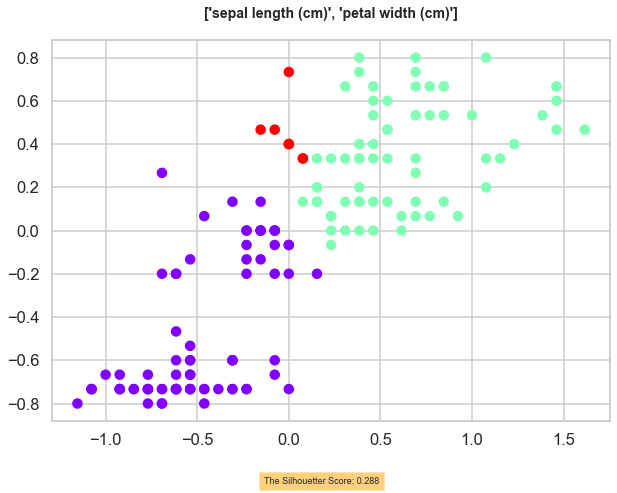

<Figure size 576x576 with 0 Axes>

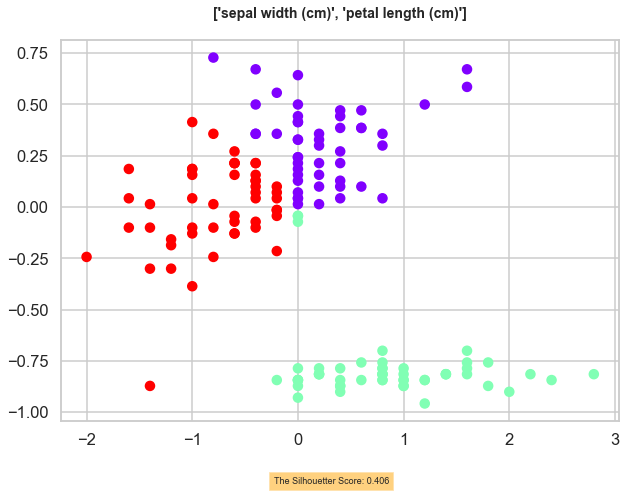

<Figure size 576x576 with 0 Axes>

In [244]:
# We have 'three' clusters as this line cuts the dendrogram at 'three' points.
# Let’s now apply hierarchical clustering for 3 clusters:
from sklearn.cluster import AgglomerativeClustering
Two_D_Hierarchical(df_scaled, 3, None, 'cosine', 'average')

-----------------------------------------------------------------------
-----------------------------------------------------------------------
###### DBSCAN Scaled

In [32]:
Z3 = iris_data_array_scaled
#For epsilon, the K-distance graph is used. For plotting a K-distance Graph, we need the distance between a point and its nearest data point for all data points in the dataset. We obtain this using NearestNeighbors from sklearn.neighbors.
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(Z3)
distances, indices = nbrs.kneighbors(Z3)

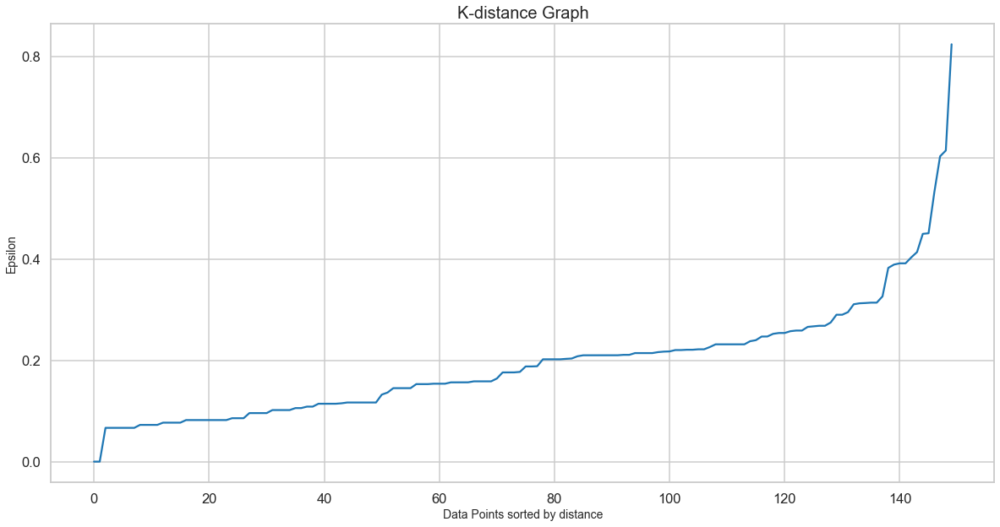

In [33]:
#Let’s plot our K-distance graph and find the value of epsilon. Use the following syntax:

# Plotting K-distance Graph
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

#The optimum value of epsilon is at the point of maximum curvature in the K-Distance Graph = 0.2
#The value of minPoints also depends on domain knowledge. This time I am taking minPoints as 6
# or loop over the range of 3 to 7 and get the first maximum silhouette-score as the optimal



> The optimum value of epsilon is at the point of maximum curvature in the K-Distance Graph (= 0.2)

> The value of minPoints also depends on domain knowledge. This time I am taking minPoints as 6
or loop over the range of 3 to 7 and get the maximum silhouette-score as the optimal 

In [168]:
from sklearn.cluster import DBSCAN
Z3 = iris_data_array_scaled
for i in range(3, 7):
    dbscan=DBSCAN(eps=0.2,min_samples=i)
    dbscan.fit_predict(Z3)


    # Number of clusters in labels, ignoring noise if present.
    labels = dbscan.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    print(f'{i}) Number of clusters = {n_clusters_}')

    # Calculate Silhoutte Score
    score = silhouette_score(Z3, dbscan.labels_, metric='euclidean')
    # Print the score
    sil33 = '%.3f' % score
    print(f'Silhoutte Score Value = {sil33}')

3) Number of clusters = 11
Silhoutte Score Value = -0.296
4) Number of clusters = 5
Silhoutte Score Value = 0.087
5) Number of clusters = 1
Silhoutte Score Value = 0.047
6) Number of clusters = 1
Silhoutte Score Value = 0.047


In [191]:
from sklearn.cluster import DBSCAN
Z3 = iris_data_array_scaled
sill_all = []
clusters_all = []
for i in range(3, 7):
    dbscan=DBSCAN(eps=0.2,min_samples=i)
    dbscan.fit_predict(Y3)


    # Number of clusters in labels, ignoring noise if present.
    labels = dbscan.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    clusters_all.append(n_clusters_)
    #print(f'{i}) Number of clusters = {n_clusters_}')

    # Calculate Silhoutte Score
    score = silhouette_score(Y3, dbscan.labels_, metric='euclidean')
    sil33 = '%.3f' % score
    sill_all.append(float(sil33))
    
    # Print the score
    print(f'{i}) Number of clusters = {n_clusters_}\n Silhoutte Score Value = {sil33}')

3) Number of clusters = 6
 Silhoutte Score Value = -0.344
4) Number of clusters = 3
 Silhoutte Score Value = -0.330
5) Number of clusters = 2
 Silhoutte Score Value = 0.183
6) Number of clusters = 2
 Silhoutte Score Value = 0.158


Silhoutte Score Optimal Value at minPoints = 5


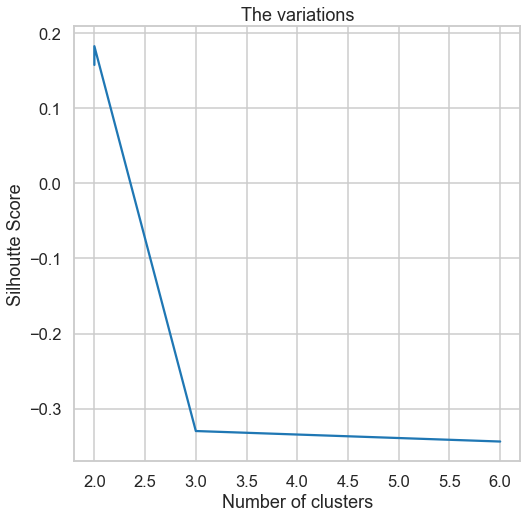

In [192]:
#Plot the silhouette_score versus the variation in the optimal EPS and the min_samples
print(f'Silhoutte Score Optimal Value at minPoints = {sill_all.index(max(sill_all))+3}')
plt.figure()
plt.title('The variations')
plt.xlabel('Number of clusters')
plt.ylabel('Silhoutte Score')
plt.plot(clusters_all,sill_all)

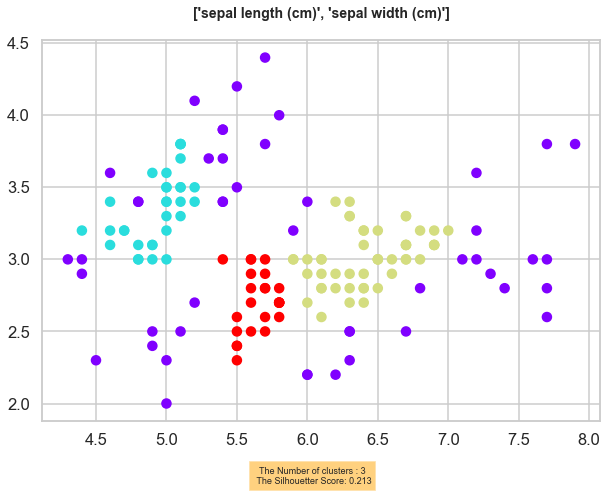

<Figure size 576x576 with 0 Axes>

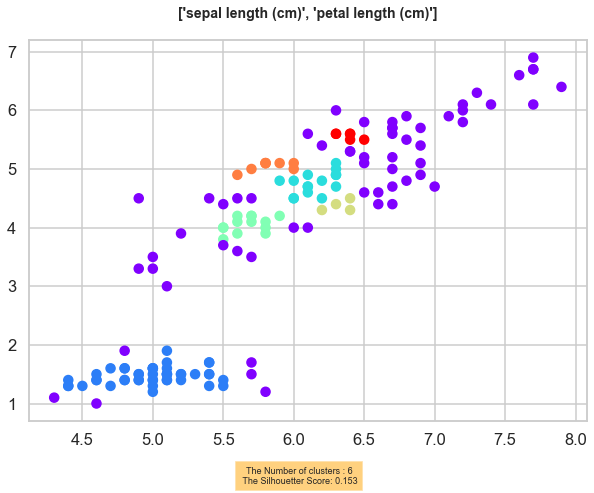

<Figure size 576x576 with 0 Axes>

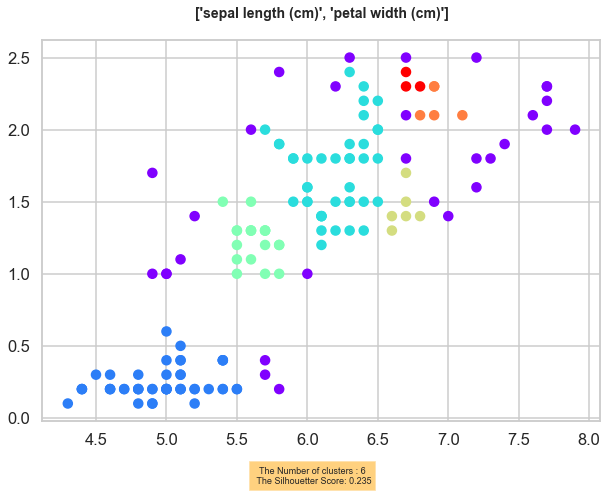

<Figure size 576x576 with 0 Axes>

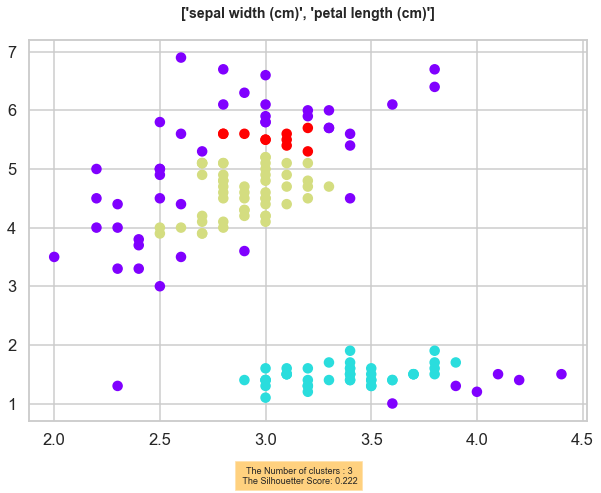

<Figure size 576x576 with 0 Axes>

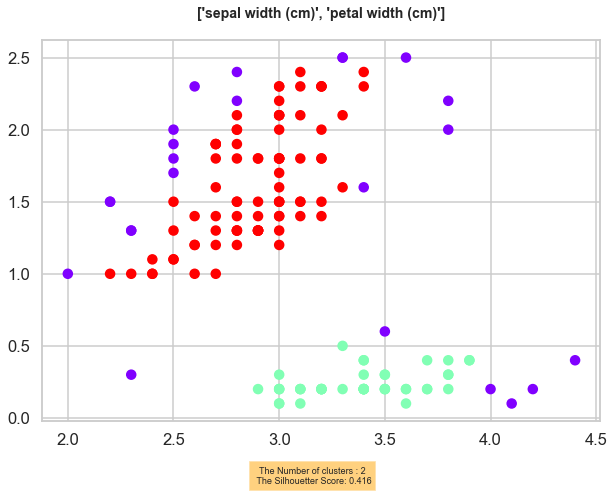

<Figure size 576x576 with 0 Axes>

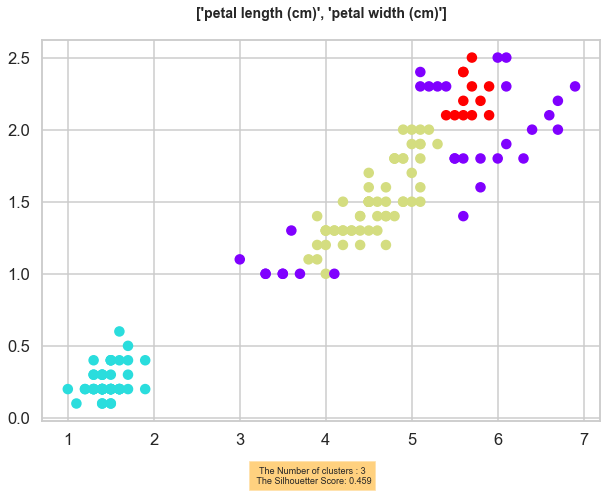

<Figure size 576x576 with 0 Axes>

In [169]:
#optimal min no of points = 5
from sklearn.cluster import DBSCAN
Two_D_DBSCAN(df_scaled,0.2,5)

-----------------------------------------------------------------------
-----------------------------------------------------------------------
##### Gaussian Mixture Scaled

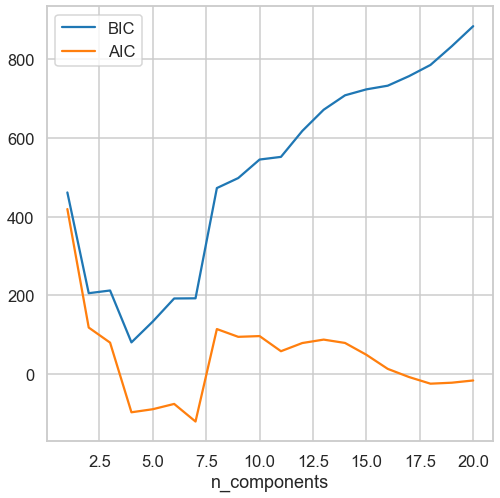

In [111]:
# the optimal number of components (that minimizes the AIC or BIC)
n_components = np.arange(1, 21)
Z4 = iris_data_array_scaled
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(Z4)
          for n in n_components]

plt.plot(n_components, [m.bic(Z4) for m in models], label='BIC')
plt.plot(n_components, [m.aic(Z4) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

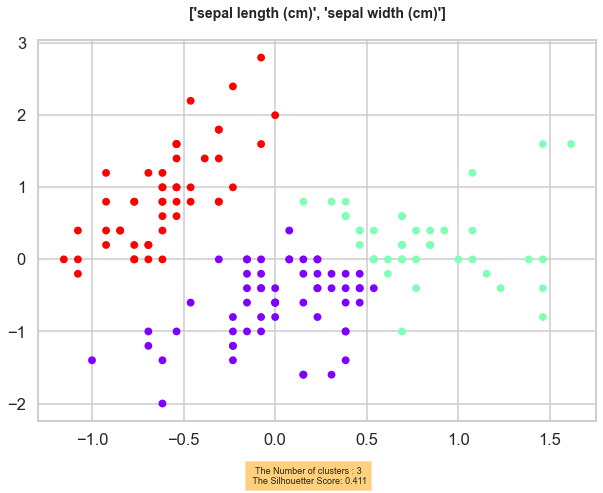

<Figure size 576x576 with 0 Axes>

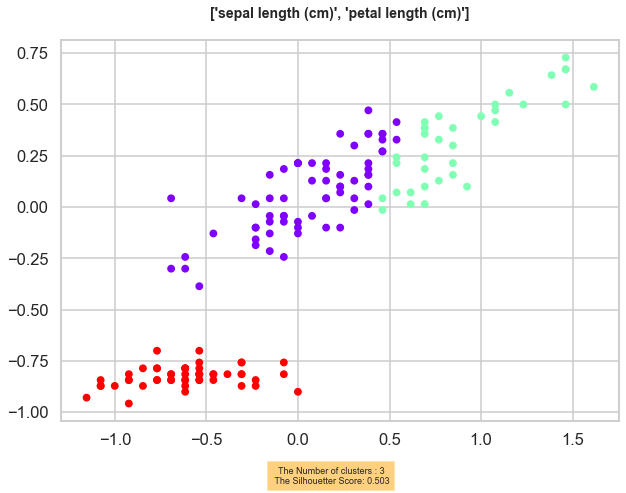

<Figure size 576x576 with 0 Axes>

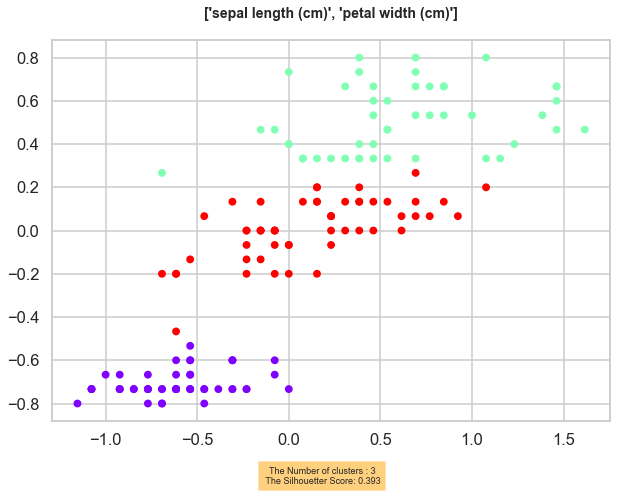

<Figure size 576x576 with 0 Axes>

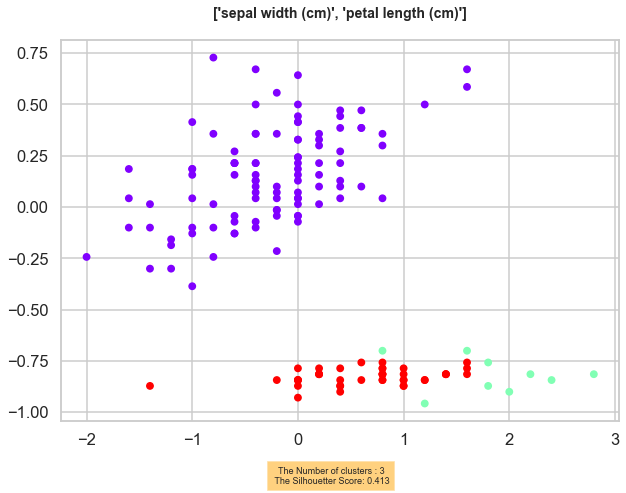

<Figure size 576x576 with 0 Axes>

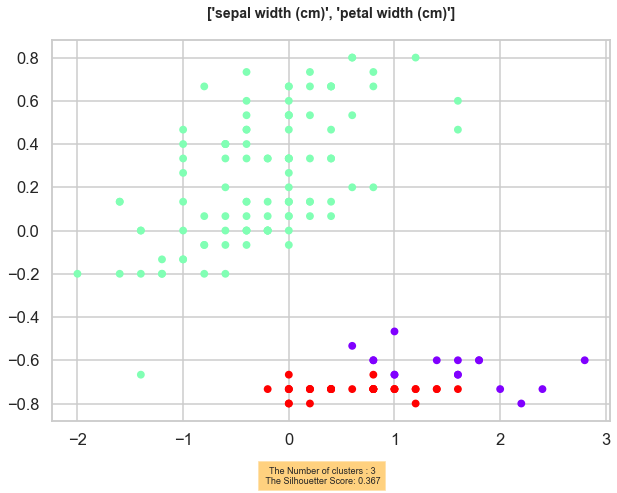

<Figure size 576x576 with 0 Axes>

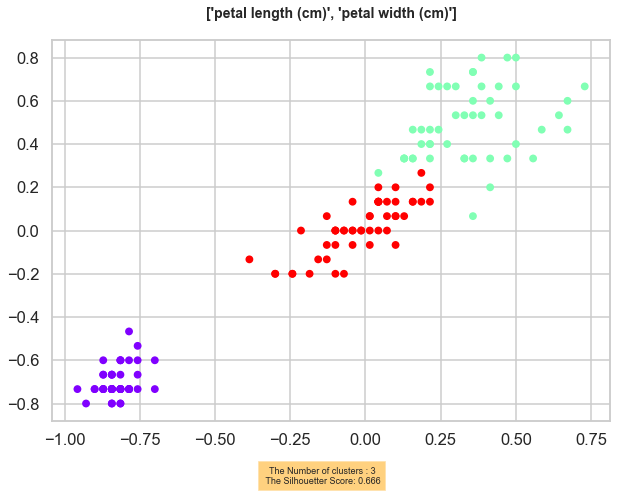

<Figure size 576x576 with 0 Axes>

In [170]:
#the optimal n_components equal 3
from sklearn.mixture import GaussianMixture
Two_D_GMM(df_scaled, 3, "full")

##### clustering mutlifeatures dataset using ggplot plotline

In [275]:
x_iris_scaled = df_scaled.rename(columns={'sepal length (cm)': 'Sepal Length', 'sepal width (cm)': 'Sepal Width', 'petal length (cm)': 'Petal Length', 'petal width (cm)': 'Petal Width'})

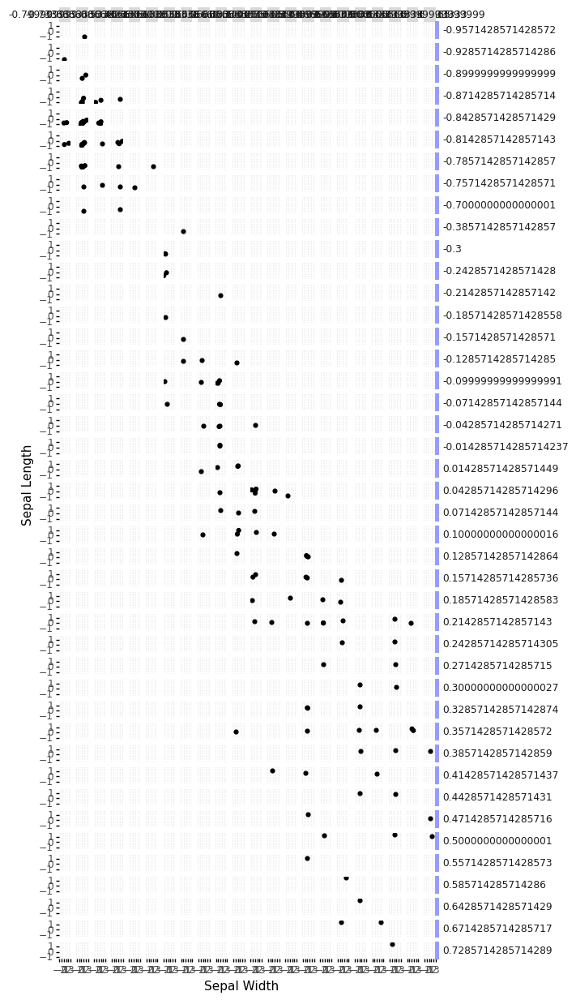

<ggplot: (101380983718)>

In [276]:
(
    ggplot(x_iris_scaled, aes(x='Sepal Width', y='Sepal Length'))
    + geom_point()
    + facet_grid('Petal Length  ~ Petal Width ') # use + to add additional faceting variables
    
    + theme(strip_text_y = element_text(angle = 0,              # change facet text angle
                                        ha = 'left'             # change text alignment
                                       ),
            strip_background_y = element_text(color = '#969dff' # change background colour of facet background
                                              , width = 0.2     # adjust width of facet background to fit facet text
                                             ), figure_size=(6, 15)                                 # adjust width & height of figure to fit y-axis
           )+ labs(x='Sepal Width', y='Sepal Length')
)

### contour

In [114]:
#contour works only on 2 features of dataset
Z4 = iris_data_array_scaled[:, :2] #all rows besides two columns
gmm = GaussianMixture(n_components=3, covariance_type="full").fit(Z4)

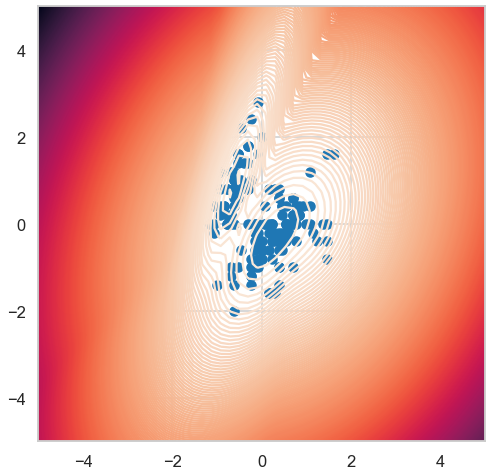

In [115]:
# https://jakevdp.github.io/PythonDataScienceHandbook/04.04-density-and-contour-plots.html
# https://matplotlib.org/3.5.1/api/_as_gen/matplotlib.pyplot.contour.htmlb
# https://www.mghassany.com/MLcourse/pw-6.html
# https://scitools-iris.readthedocs.io/en/latest/_modules/iris/plot.html#contour

#Contour with 500 regions
X, Y = np.meshgrid(np.linspace(-5,5), np.linspace(-5,5))
XX = np.array([X.ravel(), Y.ravel()]).T
Z = gmm.score_samples(XX)   # we only take the first two features.
Z = Z.reshape((50,50))
plt.contour(X, Y, Z, 300)
plt.scatter(Z4[:, 0], Z4[:, 1])
plt.show()

##### another two general method for plotting contour instead of test each time with two different features

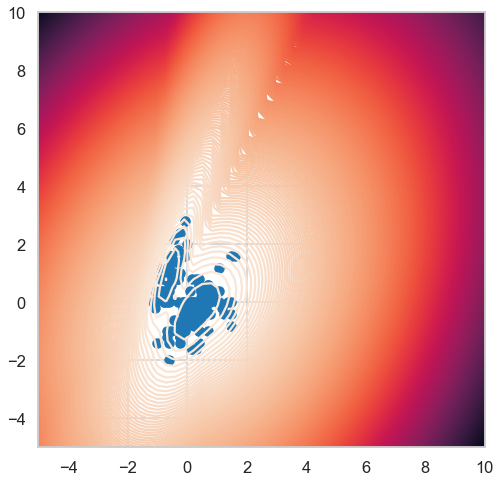

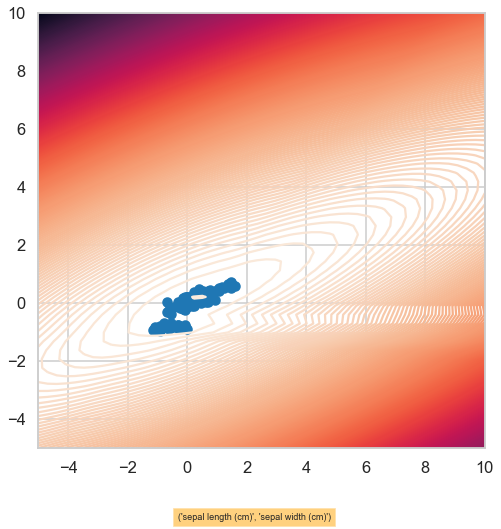

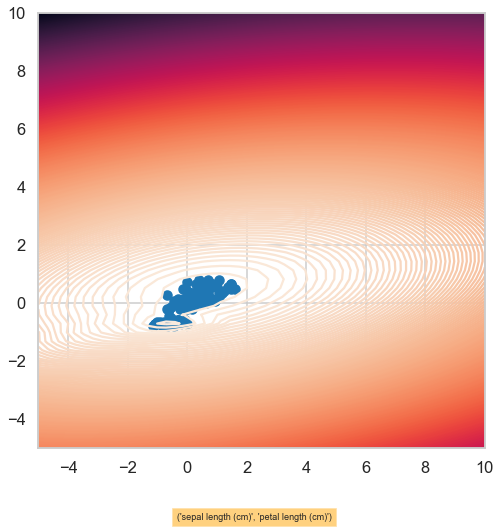

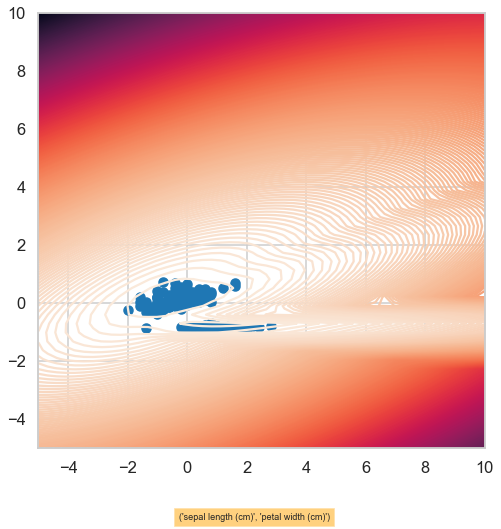

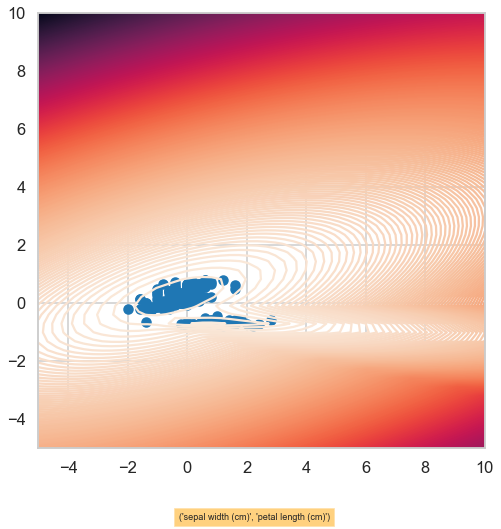

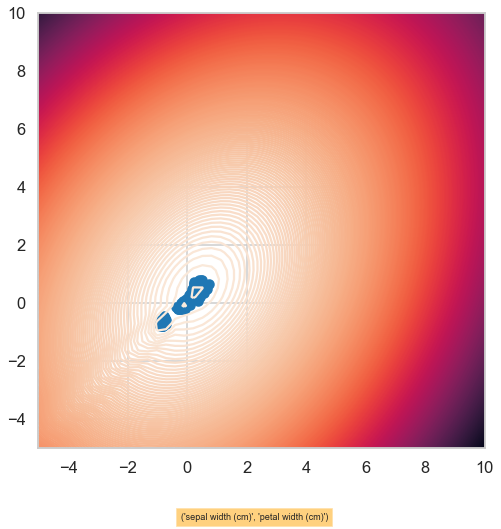

<Figure size 576x576 with 0 Axes>

In [122]:
Two_D_contour_regions(df_scaled, 3, 'full', 400)

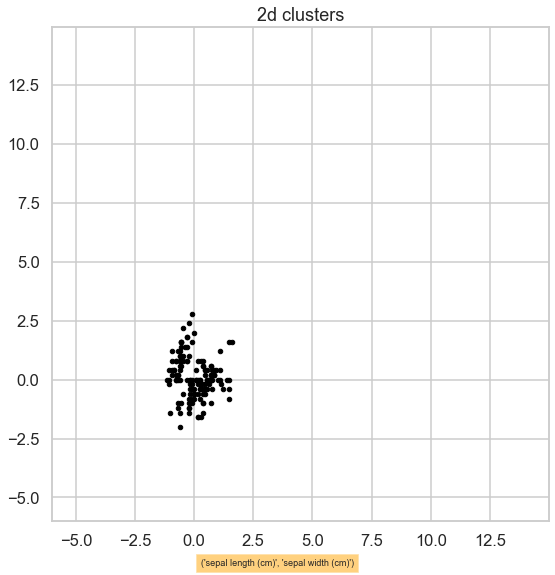

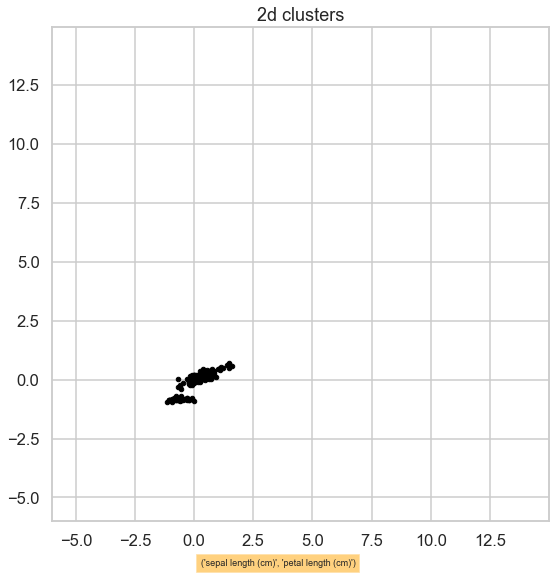

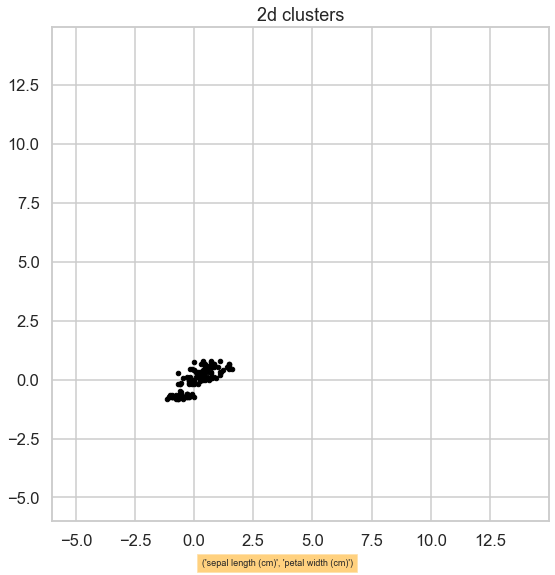

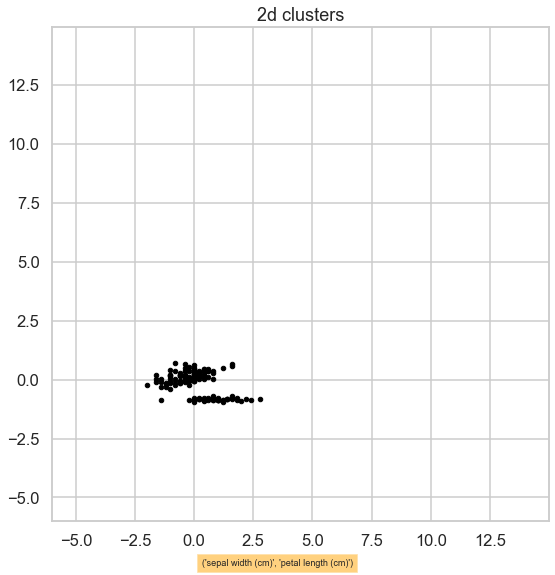

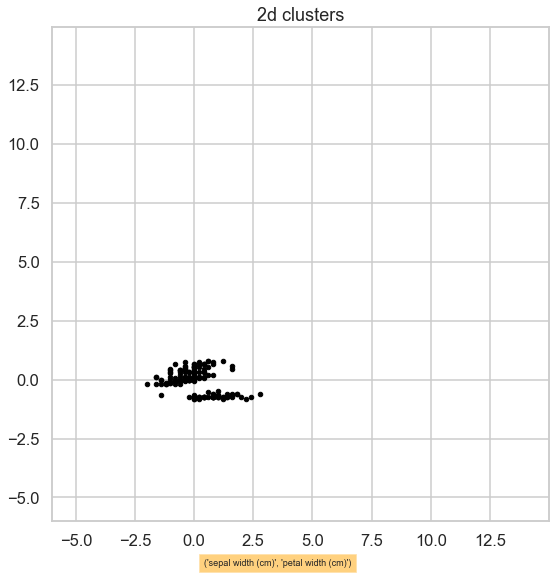

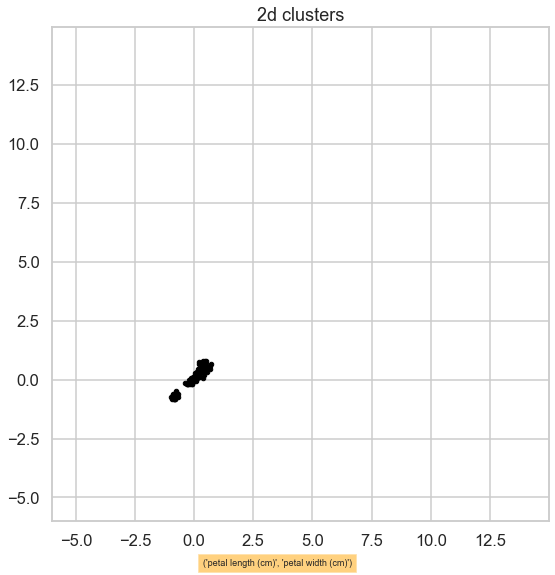

In [117]:
Two_D_contour(df_scaled, 3, 'full')

## Customer dataset
Repeat all the above on the customer data set 

In [175]:
df2 = pd.read_csv('Customer data.csv')

In [176]:
# Remove 1st column
df2.drop(['ID'], axis = 1, inplace = True)

In [177]:
# the scaler - for robust scaling of Normalization
from sklearn.preprocessing import RobustScaler

# set up the scaler
scaler = RobustScaler()
# https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.RobustScaler.html
f = pd.DataFrame(df2)
# fit the scaler to the train set, it will learn the parameters
scaler.fit(f)
# transform train and test sets
df_scaled2 = scaler.transform(f)
# let's transform the returned NumPy arrays to dataframes
df_scaled2 = pd.DataFrame(df_scaled2, columns=f.columns)

df_scaled2

,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,0.0,0.0,2.266667,1.0,0.225729,0.0,1.0
1,1.0,1.0,-0.733333,0.0,0.871699,0.0,1.0
2,0.0,0.0,1.066667,0.0,-0.651798,-1.0,-1.0
3,0.0,0.0,0.800000,0.0,1.386238,0.0,0.0
4,0.0,0.0,1.333333,0.0,0.828590,0.0,0.0
...,...,...,...,...,...,...,...
1995,1.0,0.0,0.933333,0.0,0.197394,-1.0,-1.0
1996,1.0,1.0,-0.400000,0.0,0.054332,0.0,-1.0
1997,0.0,0.0,-0.133333,-1.0,-0.721337,-1.0,-1.0
1998,1.0,1.0,-0.600000,0.0,-0.435064,-1.0,-1.0


In [178]:
customer_data_array_scaled = df_scaled2.to_numpy()
customer_data_array_scaled

array([[ 0.        ,  0.        ,  2.26666667, ...,  0.22572942,
         0.        ,  1.        ],
       [ 1.        ,  1.        , -0.73333333, ...,  0.87169937,
         0.        ,  1.        ],
       [ 0.        ,  0.        ,  1.06666667, ..., -0.65179787,
        -1.        , -1.        ],
       ...,
       [ 0.        ,  0.        , -0.13333333, ..., -0.72133683,
        -1.        , -1.        ],
       [ 1.        ,  1.        , -0.6       , ..., -0.43506397,
        -1.        , -1.        ],
       [ 0.        ,  0.        , -0.53333333, ..., -1.1663862 ,
        -1.        , -1.        ]])

-----------------------------------------------------------------------
-----------------------------------------------------------------------
###### Kmeans Scaled CSV

Text(0.5, 0, 'All Silhoutte scores : [0.281, 0.256, 0.25, 0.224, 0.23] Optimal Silhoutte : 0.281 (Optimal k : 2)')

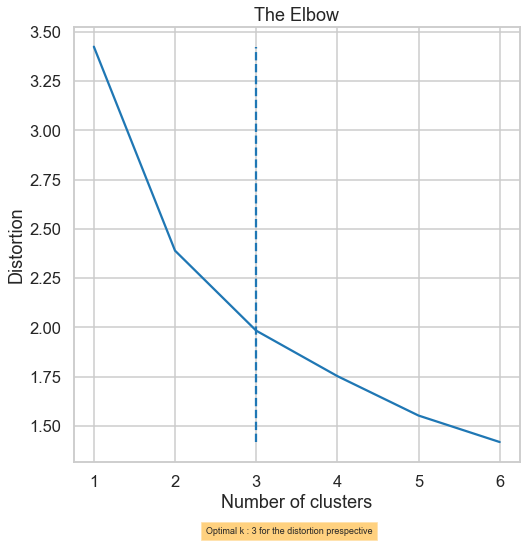

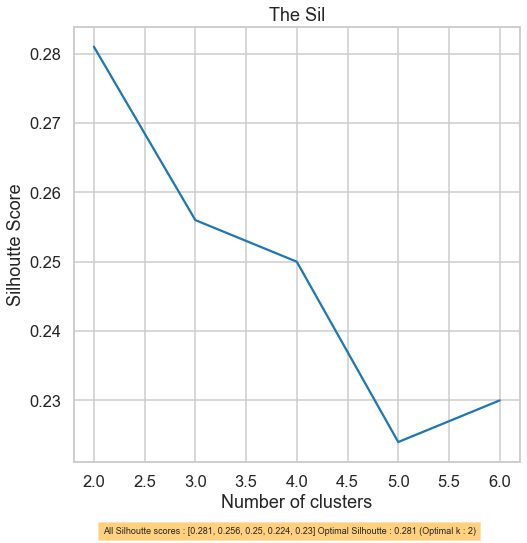

In [179]:
#wcss => distortion function for certain K
wcss=[]
sil=[]
for i in range(1,7): # i = number_clusters
    # Calculate Distortion from KMeans
    kmeans = KMeans(i)
    X1 = customer_data_array_scaled
    kmeans.fit(X1)
    wcss_iter = kmeans.inertia_ / len(X1) #to get a small number to observe easily
    wcss.append(wcss_iter)
    
    # Calculate Silhoutte Score
    #https://dzone.com/articles/kmeans-silhouette-score-explained-with-python-exam
    if(i>1):
        score = silhouette_score(X1, kmeans.labels_, metric='euclidean')
        # Print the score
        sil.append(float('%.3f' % score))
####################################################################


number_clusters = range(1,7) #silhouette_score requires more than 1 cluster labels to can compare
#Plot Distortion for each no. of clusters
plt.figure()
plt.plot(number_clusters,wcss)
plt.title('The Elbow')
plt.xlabel('Number of clusters')
plt.ylabel('Distortion')

# Specify the ELbow Point
from knee_locator import KneeLocator
kn = KneeLocator(number_clusters, wcss, curve='convex', direction='decreasing')
plt.figtext(0.5, 0, (f'Optimal k : {kn.knee} for the distortion prespective'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
plt.vlines(kn.knee, min(wcss), max(wcss), linestyles='dashed')
#####################################################################

number_clusters = range(2,7) #silhouette_score requires more than 1 cluster labels to can compare
#Plot Silhoutte Score for each no. of clusters
plt.figure()
plt.plot(number_clusters,sil)
plt.title('The Sil')
plt.xlabel('Number of clusters')
plt.ylabel('Silhoutte Score')

# Specify the max(optimal) Silhoutte Score as optimal
plt.figtext(0.5, 0, (f'All Silhoutte scores : {sil} Optimal Silhoutte : {max(sil)} (Optimal k : {sil.index(max(sil))+2})'), ha="center", fontsize=9, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
 



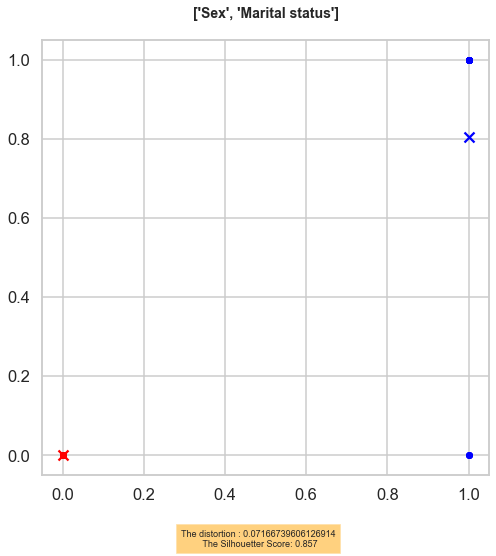

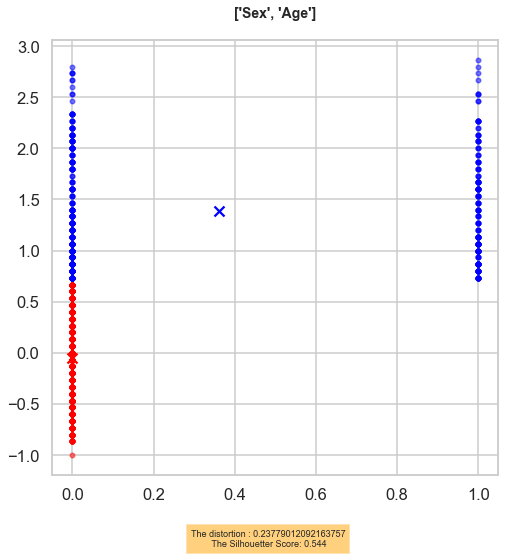

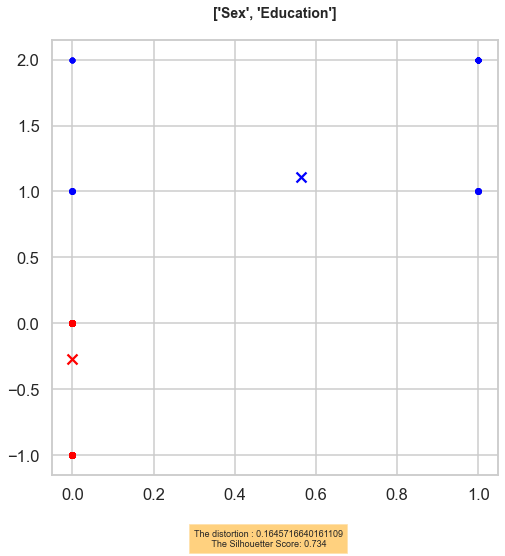

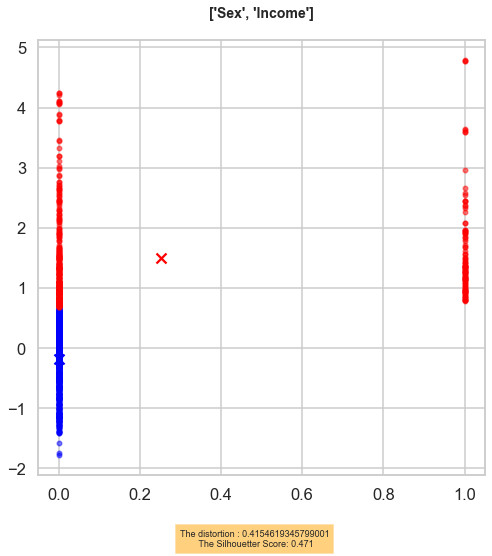

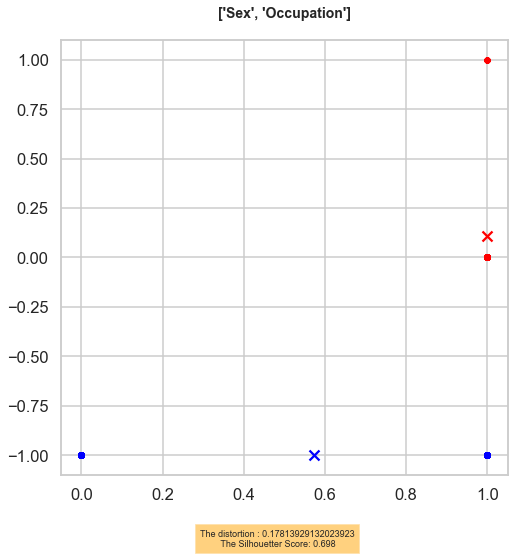

...

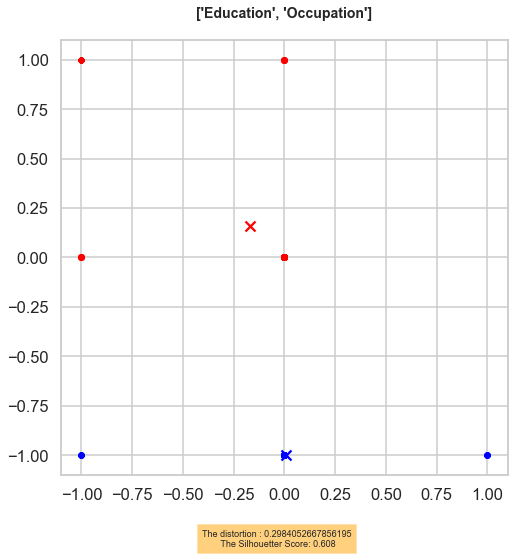

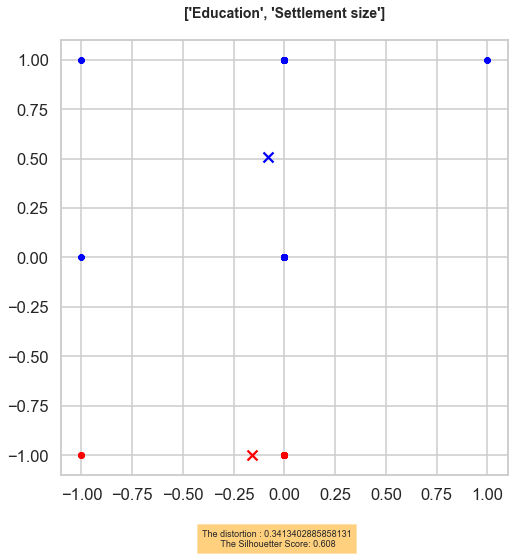

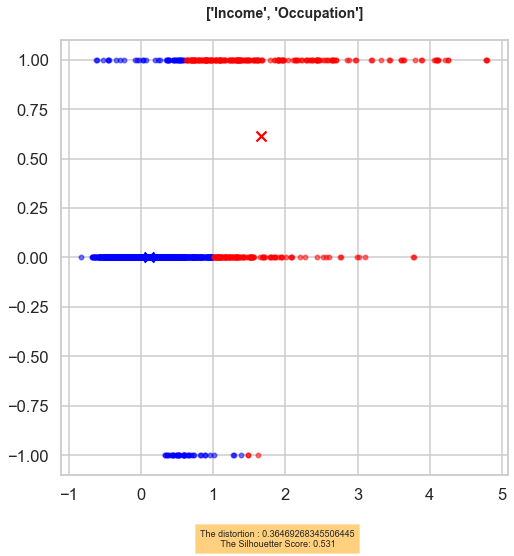

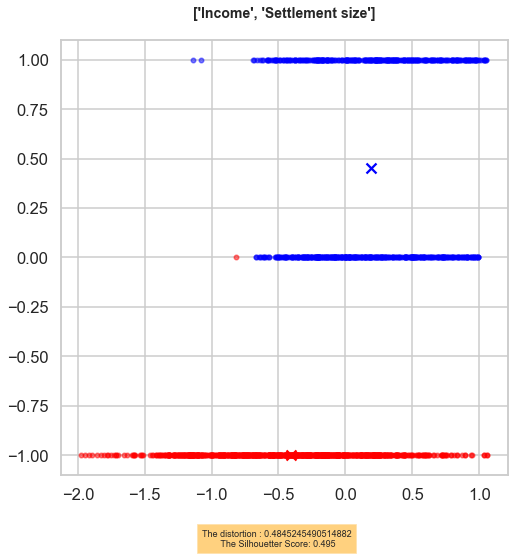

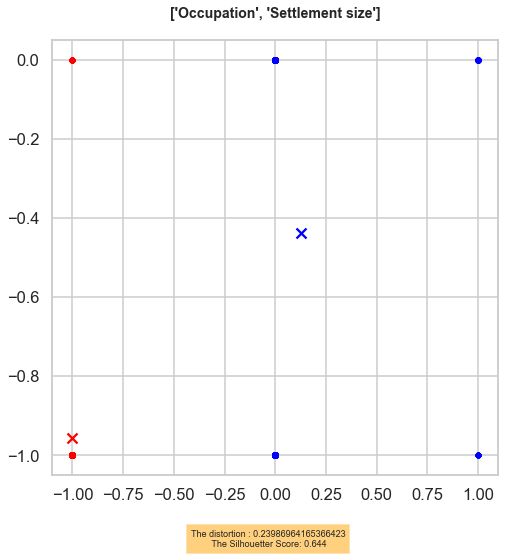

<Figure size 576x576 with 0 Axes>

In [180]:
Two_D_Kmeans(df_scaled2,3)

-----------------------------------------------------------------------
-----------------------------------------------------------------------
###### Hierarchical Scaled CSV

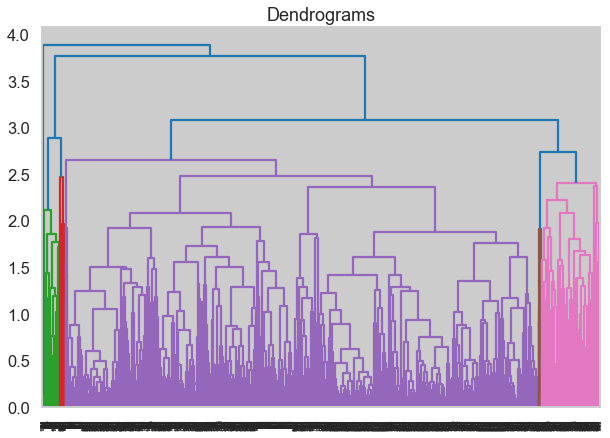

In [64]:
import scipy.cluster.hierarchy as shc
A2 = customer_data_array_scaled
plt.figure(figsize=(10, 7))   
plt.title("Dendrograms") 
dend = shc.dendrogram(shc.linkage(A2, method='average'))

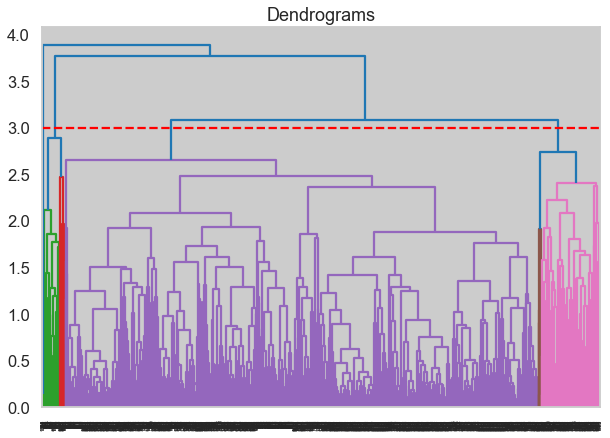

In [118]:
# The vertical line with maximum distance is the blue line and hence we can decide a threshold of '3' and cut the dendrogram
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = shc.dendrogram(shc.linkage(A2, method='average'))
plt.axhline(y=3, color='r', linestyle='--')

All of affinity types have same effect here but cosine causing a problem

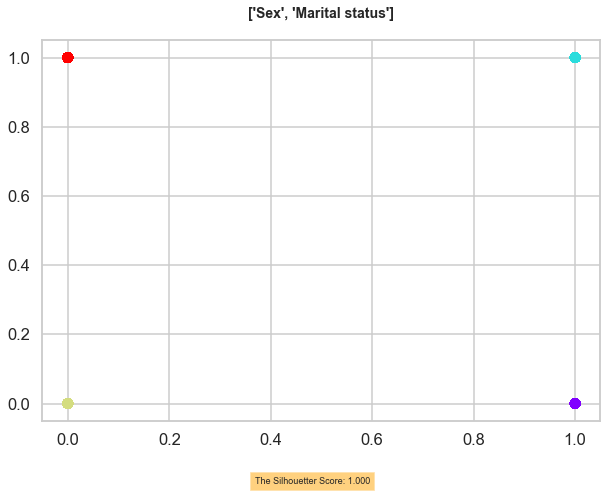

<Figure size 576x576 with 0 Axes>

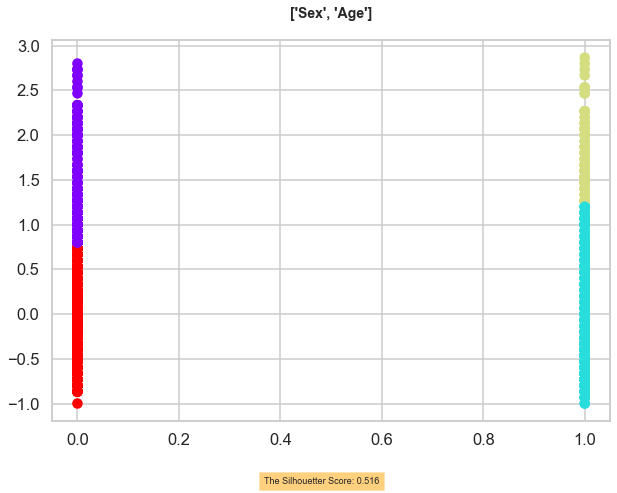

<Figure size 576x576 with 0 Axes>

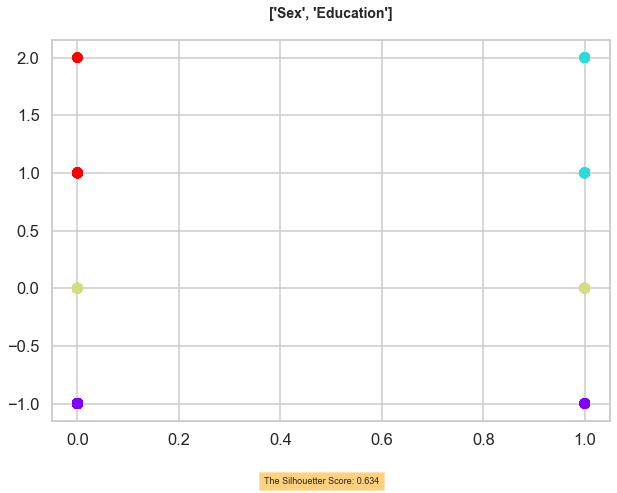

<Figure size 576x576 with 0 Axes>

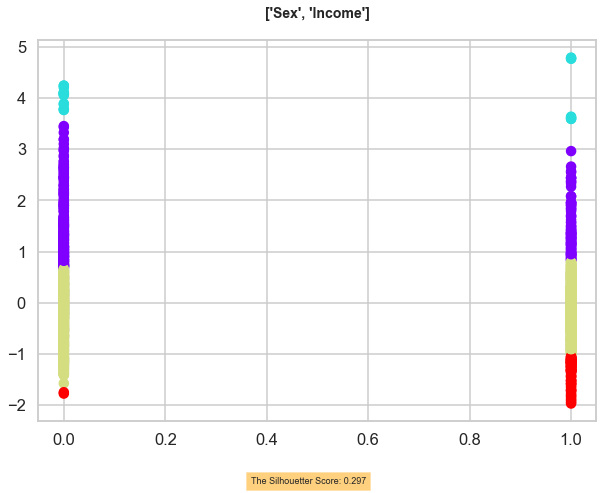

<Figure size 576x576 with 0 Axes>

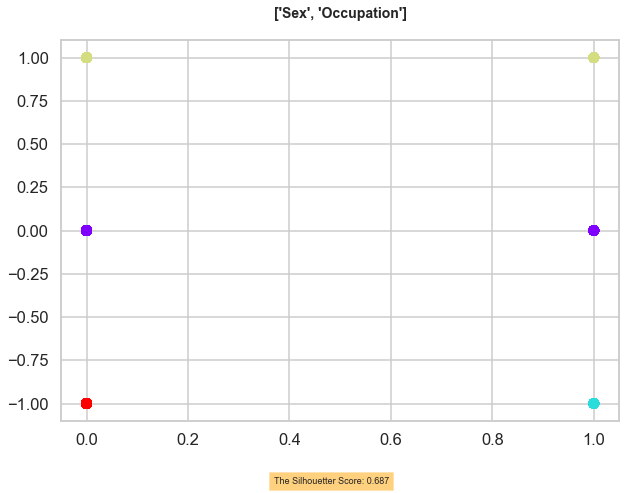

<Figure size 576x576 with 0 Axes>

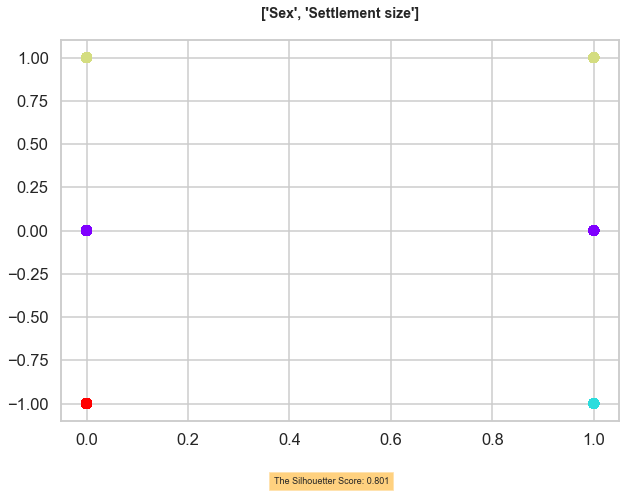

<Figure size 576x576 with 0 Axes>

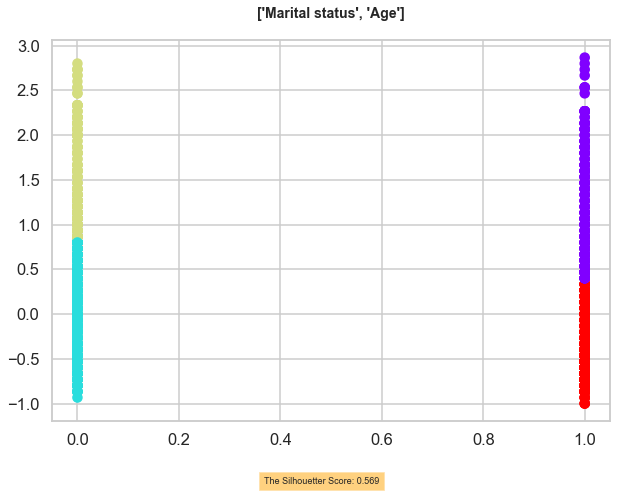

<Figure size 576x576 with 0 Axes>

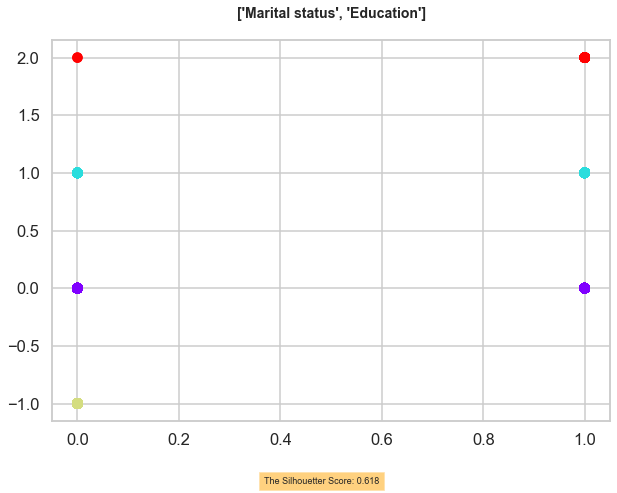

<Figure size 576x576 with 0 Axes>

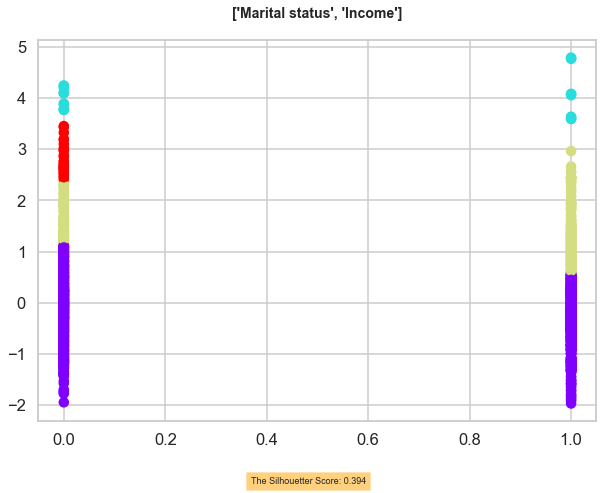

<Figure size 576x576 with 0 Axes>

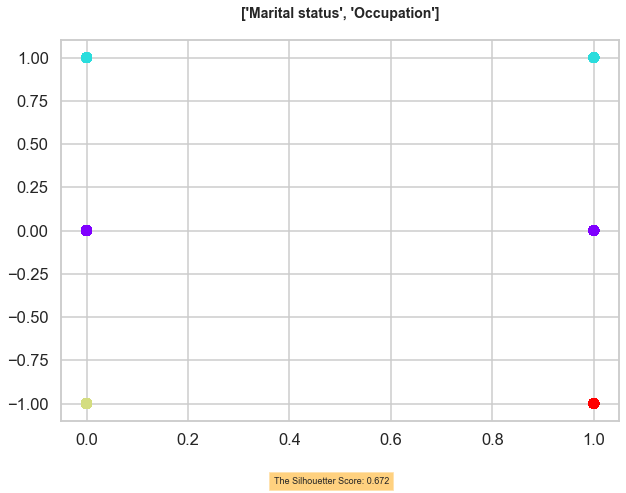

<Figure size 576x576 with 0 Axes>

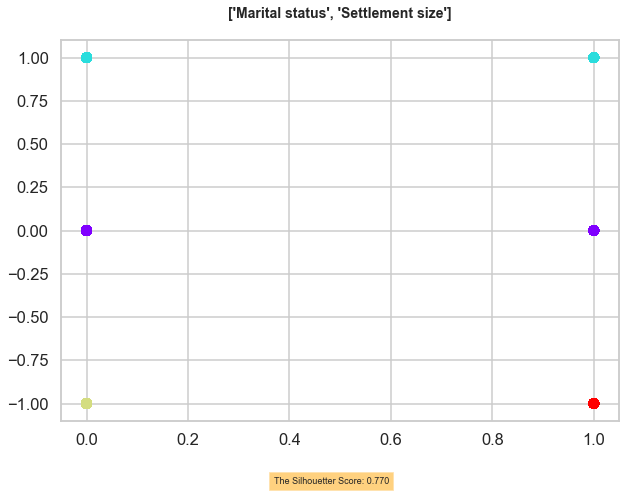

<Figure size 576x576 with 0 Axes>

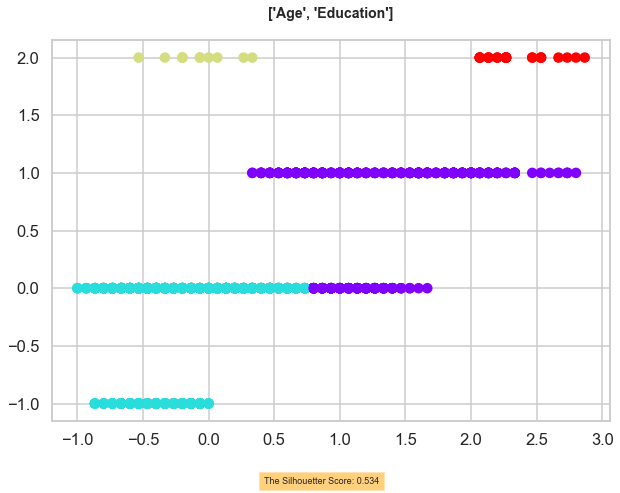

<Figure size 576x576 with 0 Axes>

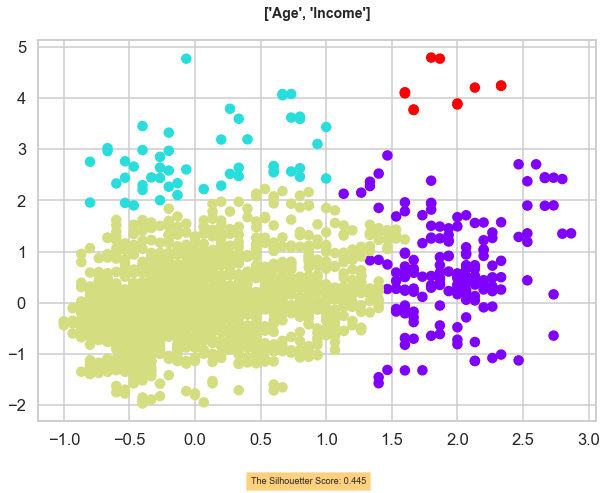

<Figure size 576x576 with 0 Axes>

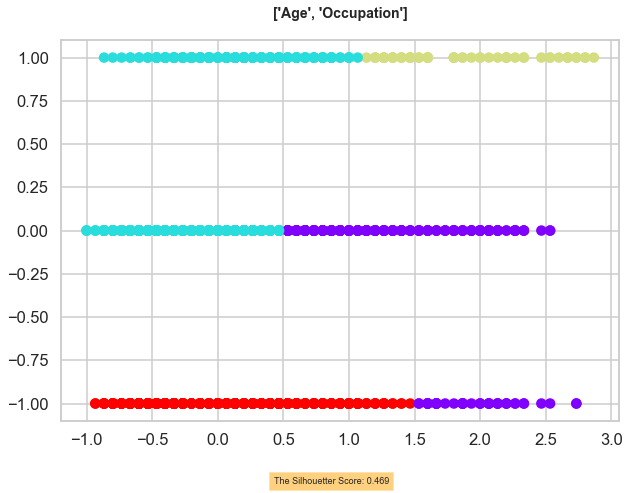

<Figure size 576x576 with 0 Axes>

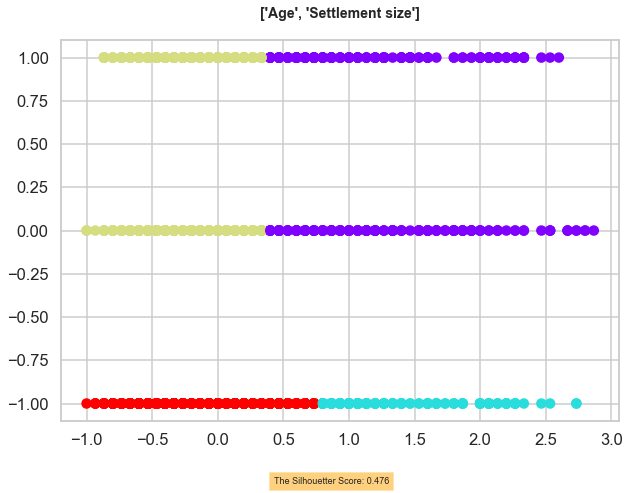

<Figure size 576x576 with 0 Axes>

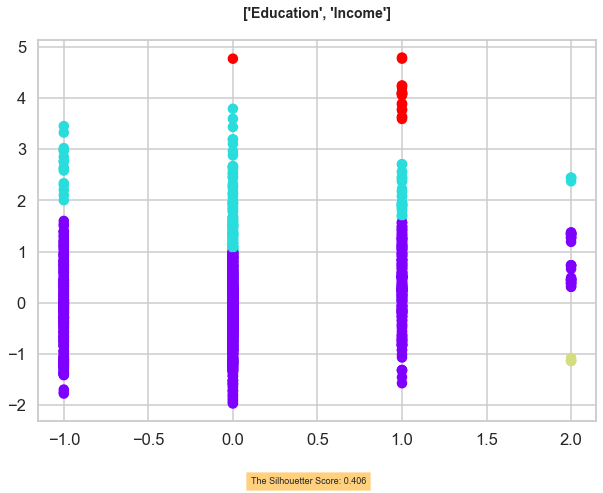

<Figure size 576x576 with 0 Axes>

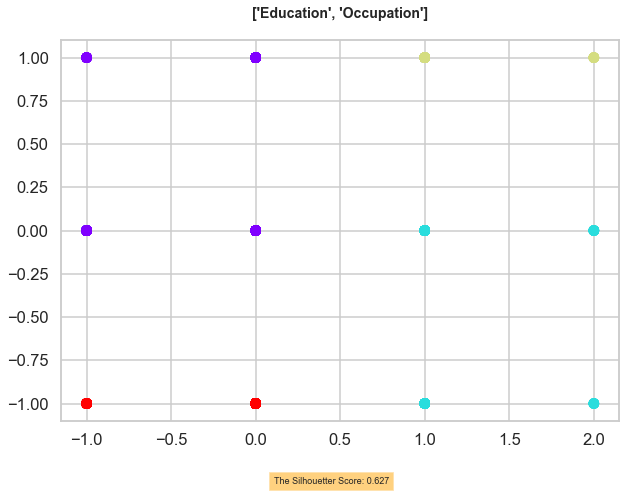

<Figure size 576x576 with 0 Axes>

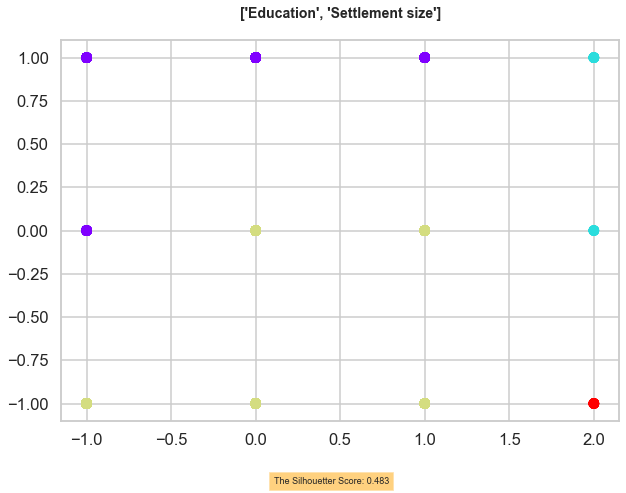

<Figure size 576x576 with 0 Axes>

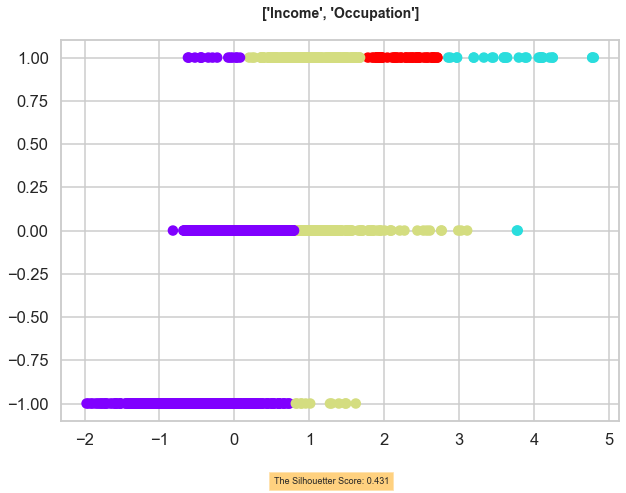

<Figure size 576x576 with 0 Axes>

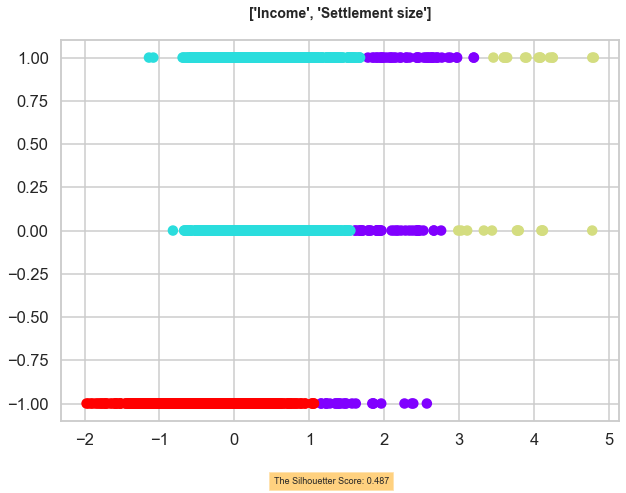

<Figure size 576x576 with 0 Axes>

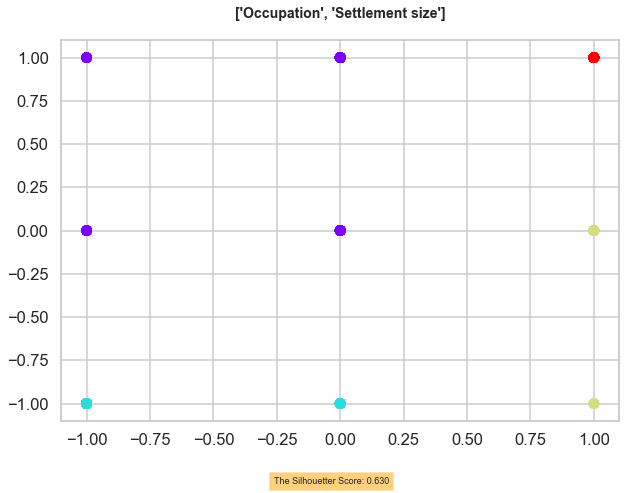

<Figure size 576x576 with 0 Axes>

In [245]:
# We have 'three' clusters as this line cuts the dendrogram at 'four' points.
# Let’s now apply hierarchical clustering for 4 clusters:
from sklearn.cluster import AgglomerativeClustering
Two_D_Hierarchical(df_scaled2, 4, None, 'euclidean', 'average')

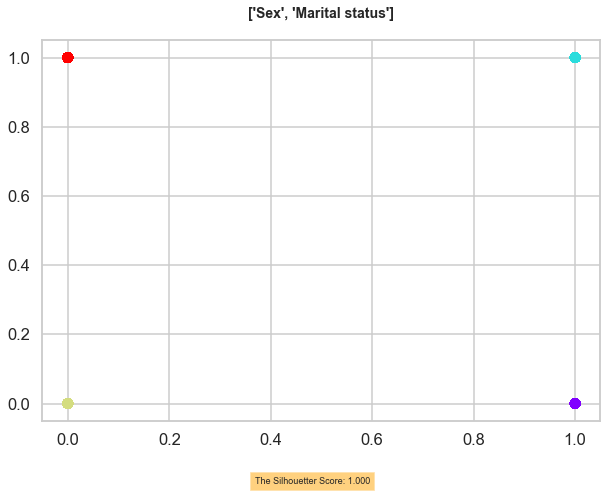

<Figure size 576x576 with 0 Axes>

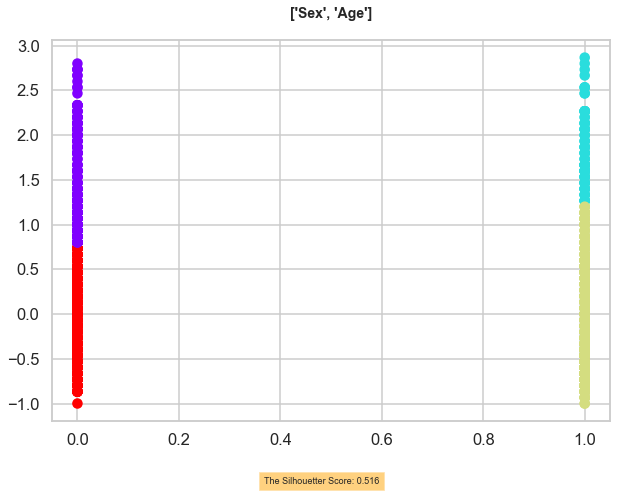

<Figure size 576x576 with 0 Axes>

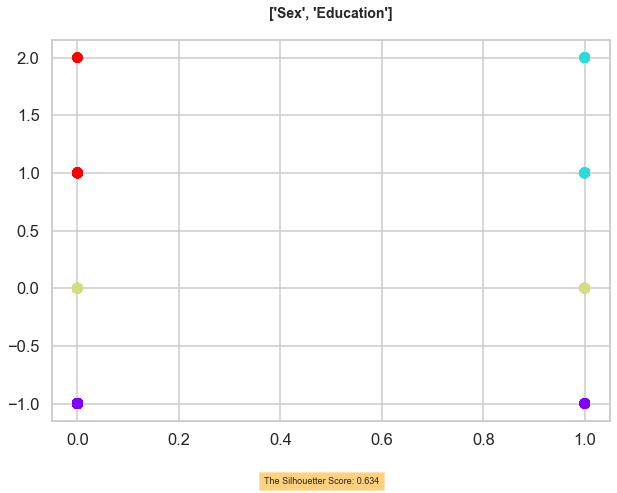

<Figure size 576x576 with 0 Axes>

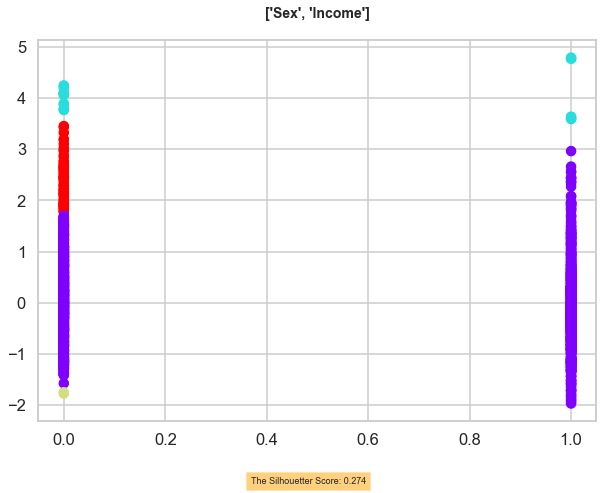

<Figure size 576x576 with 0 Axes>

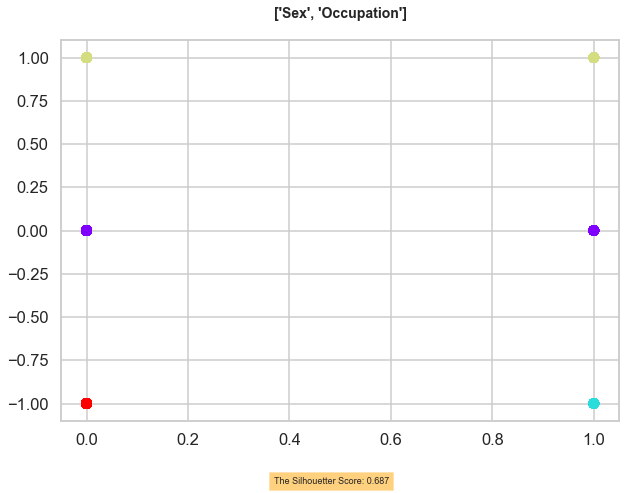

<Figure size 576x576 with 0 Axes>

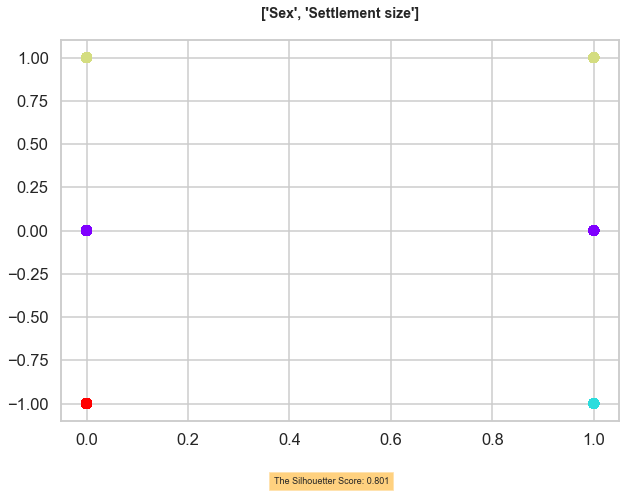

<Figure size 576x576 with 0 Axes>

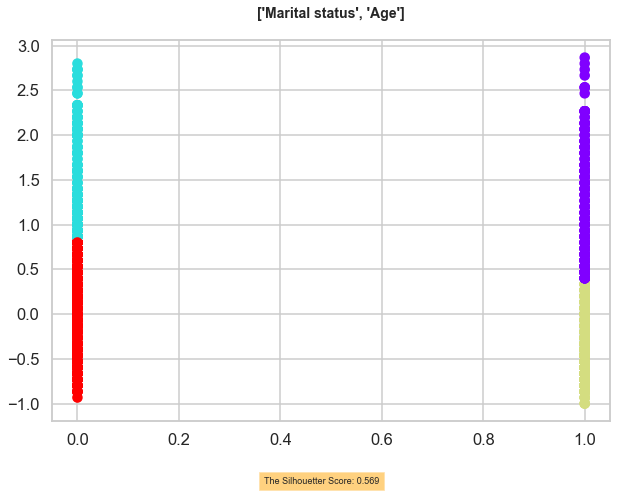

<Figure size 576x576 with 0 Axes>

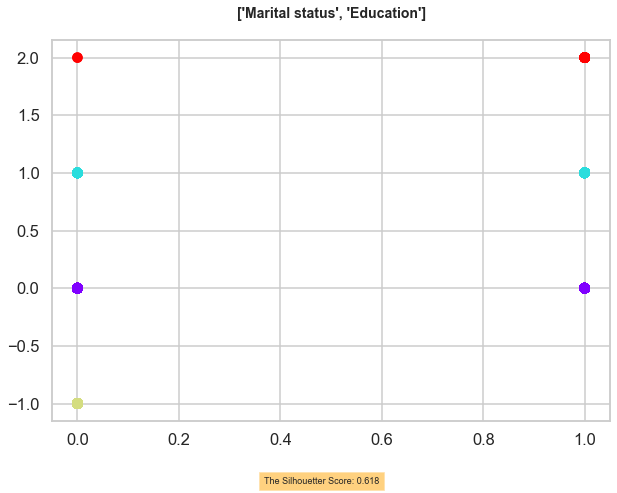

<Figure size 576x576 with 0 Axes>

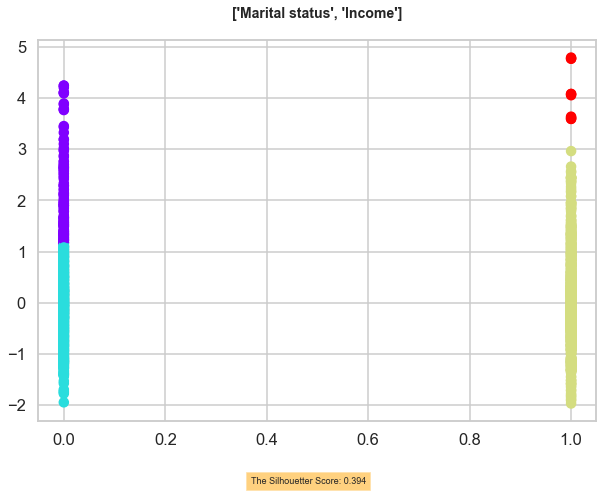

<Figure size 576x576 with 0 Axes>

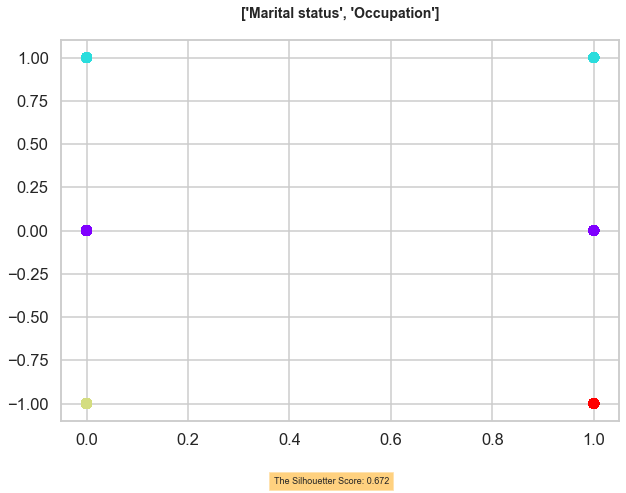

<Figure size 576x576 with 0 Axes>

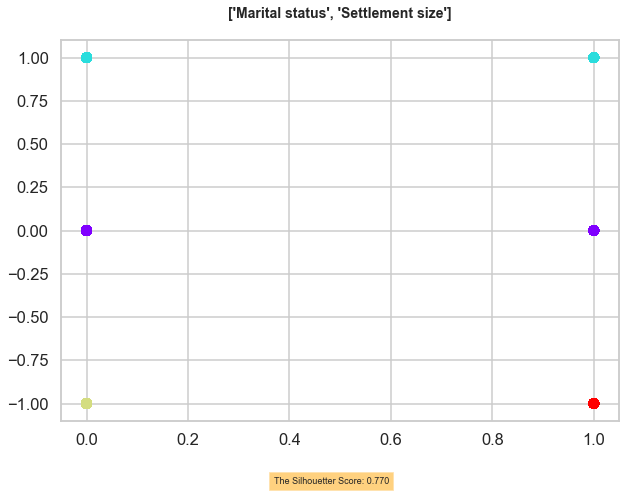

<Figure size 576x576 with 0 Axes>

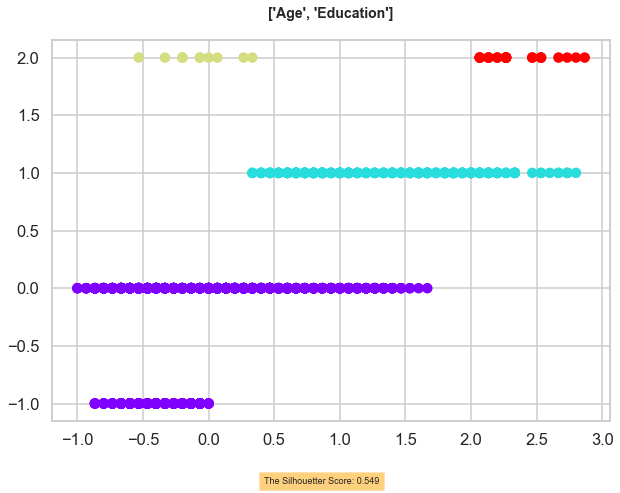

<Figure size 576x576 with 0 Axes>

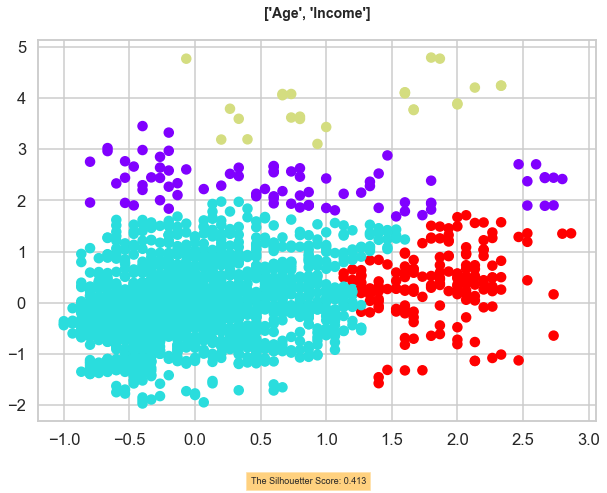

<Figure size 576x576 with 0 Axes>

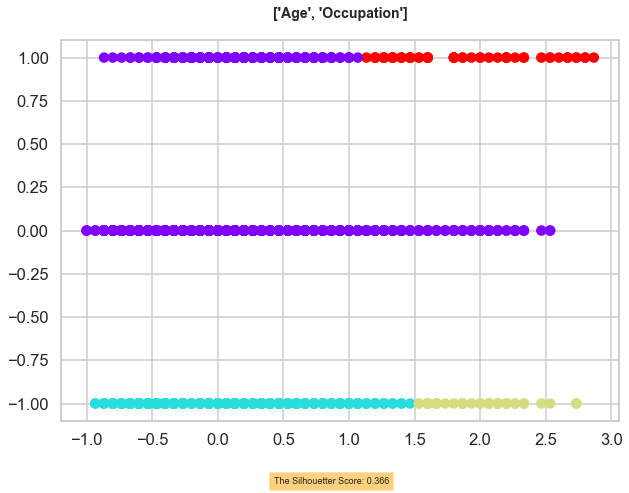

<Figure size 576x576 with 0 Axes>

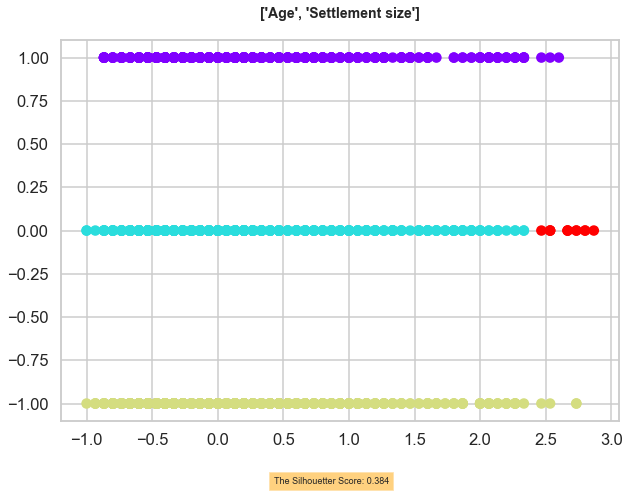

<Figure size 576x576 with 0 Axes>

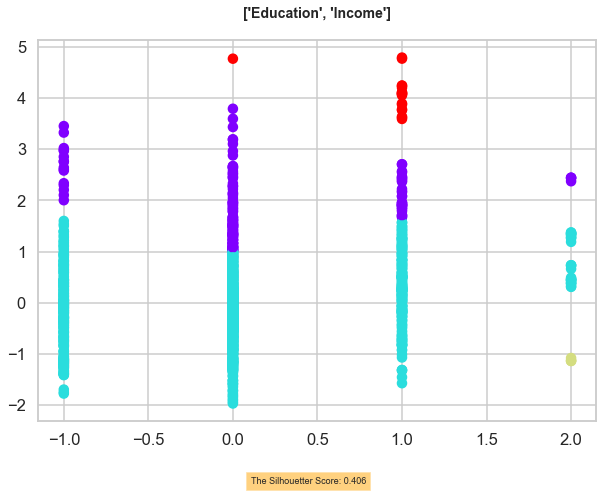

<Figure size 576x576 with 0 Axes>

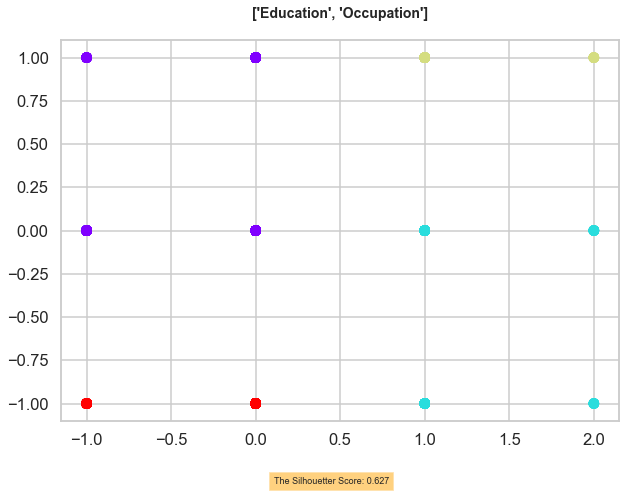

<Figure size 576x576 with 0 Axes>

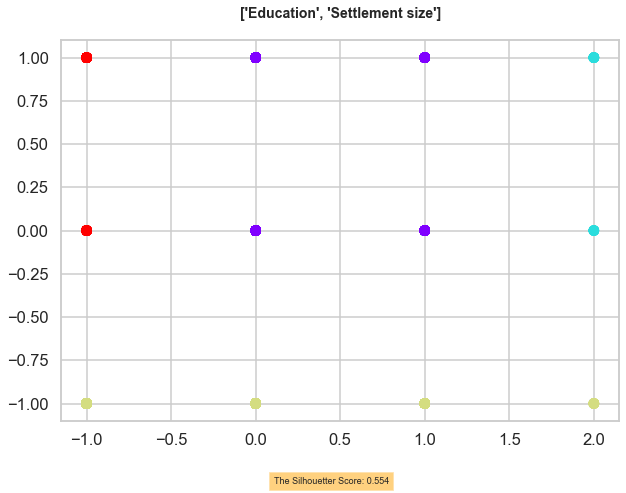

<Figure size 576x576 with 0 Axes>

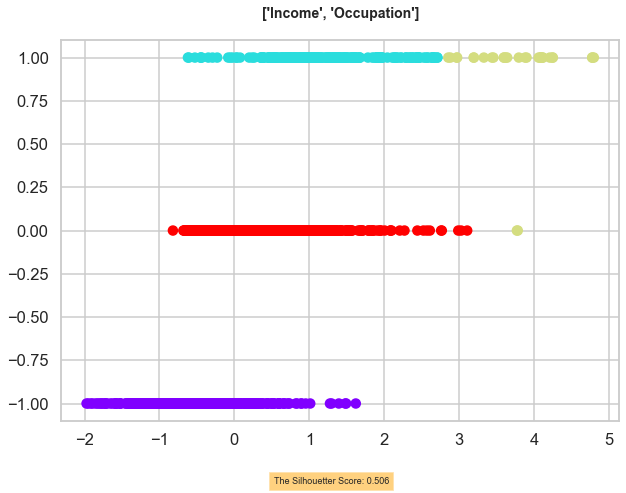

<Figure size 576x576 with 0 Axes>

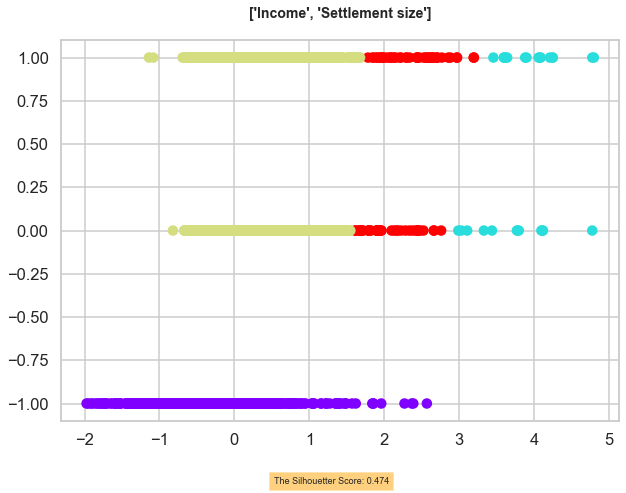

<Figure size 576x576 with 0 Axes>

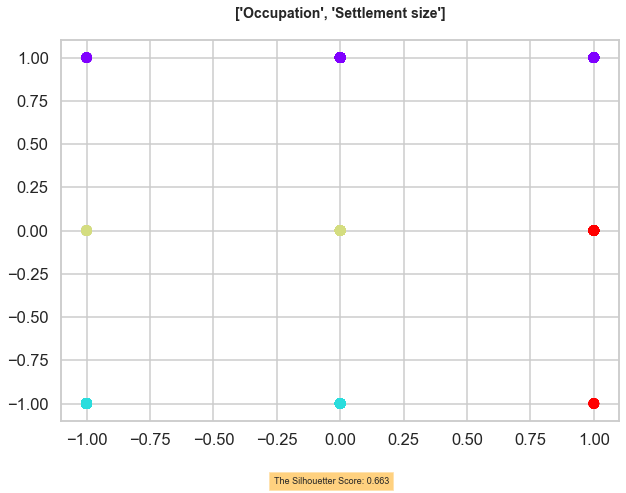

<Figure size 576x576 with 0 Axes>

In [181]:
# We have 'three' clusters as this line cuts the dendrogram at 'four' points.
# Let’s now apply hierarchical clustering for 4 clusters:
from sklearn.cluster import AgglomerativeClustering
Two_D_Hierarchical(df_scaled2, 4, None, 'manhattan', 'average')

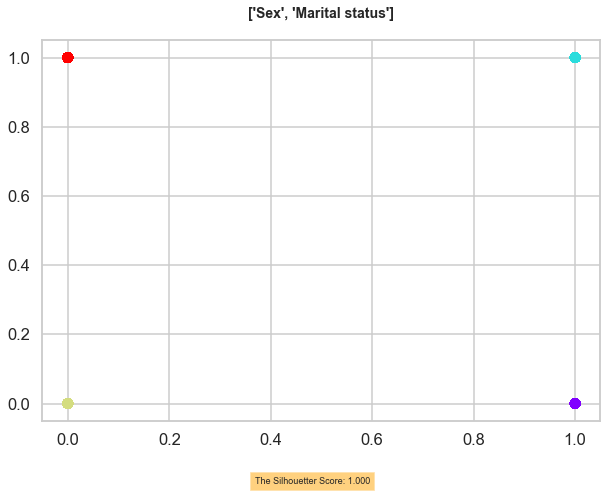

<Figure size 576x576 with 0 Axes>

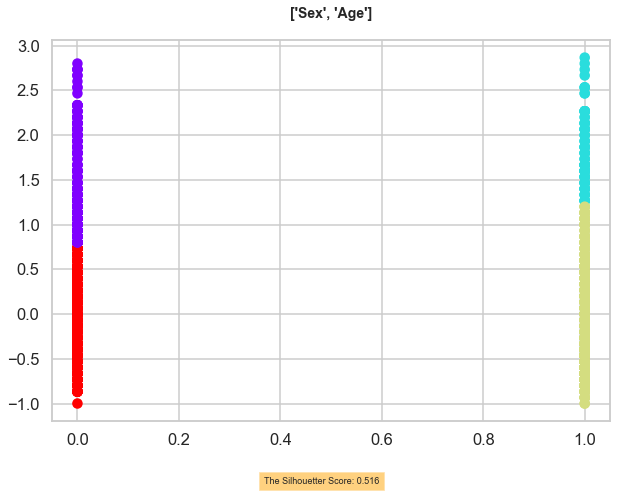

<Figure size 576x576 with 0 Axes>

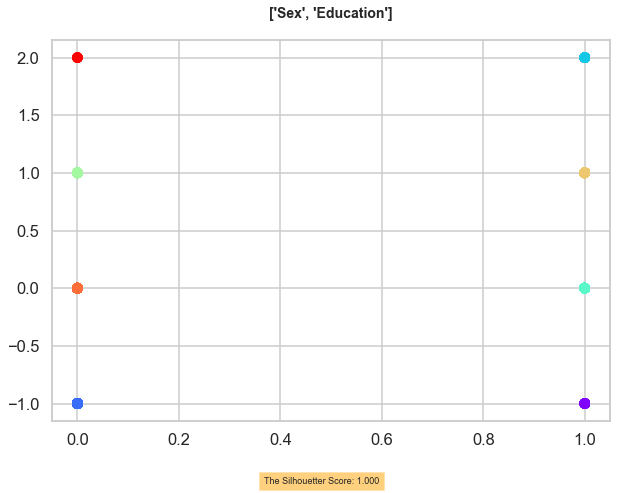

<Figure size 576x576 with 0 Axes>

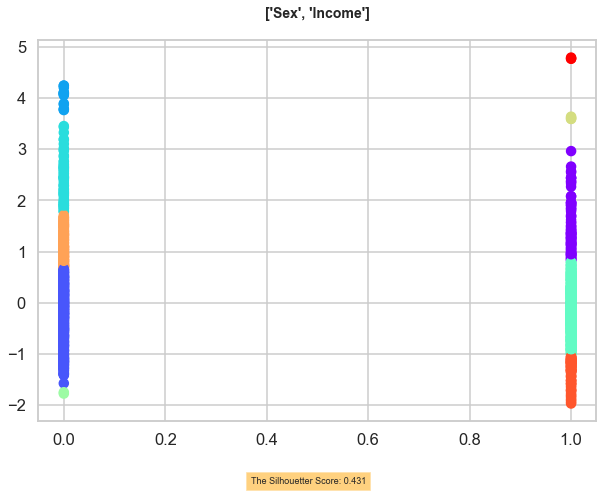

<Figure size 576x576 with 0 Axes>

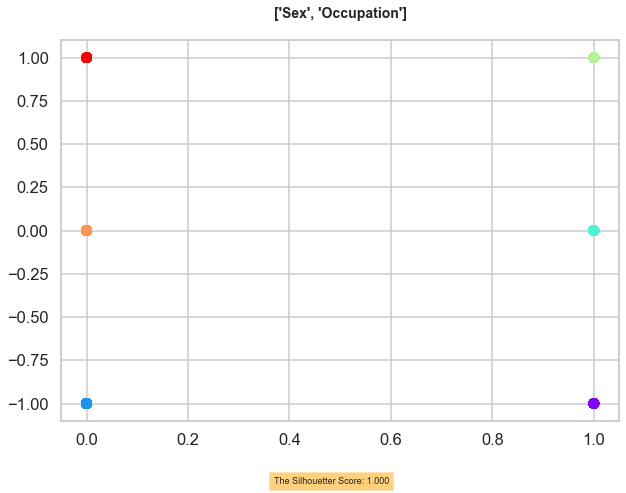

<Figure size 576x576 with 0 Axes>

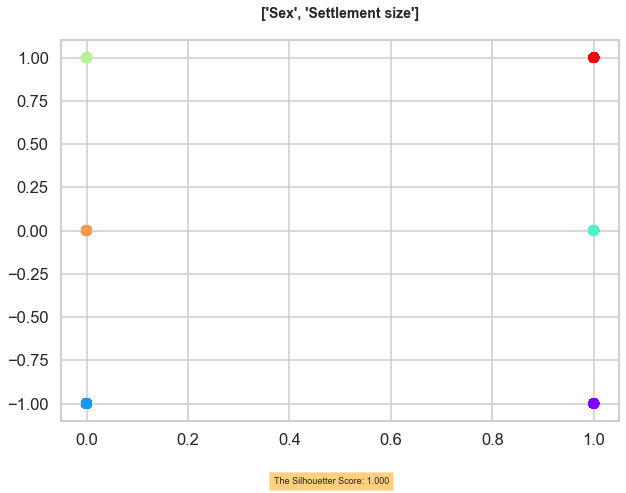

<Figure size 576x576 with 0 Axes>

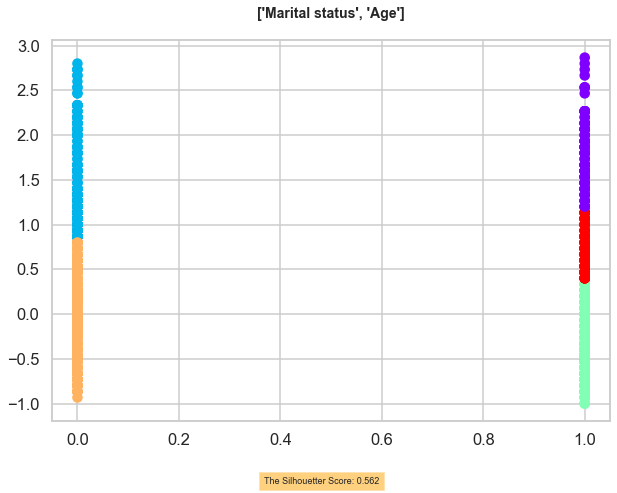

<Figure size 576x576 with 0 Axes>

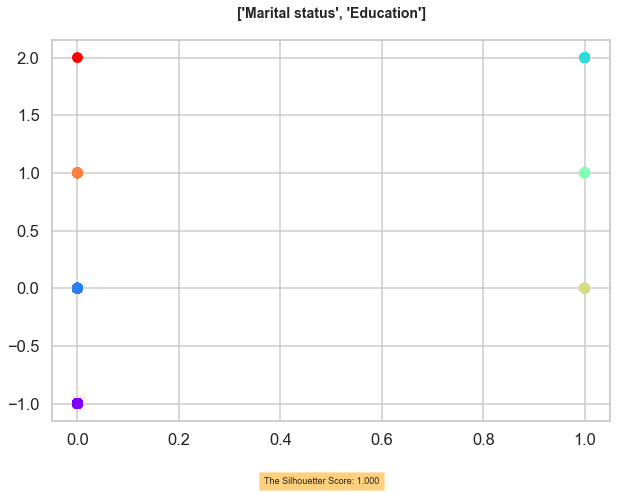

<Figure size 576x576 with 0 Axes>

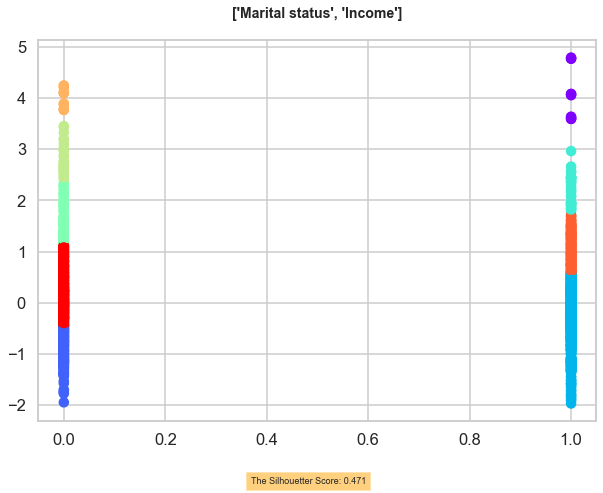

<Figure size 576x576 with 0 Axes>

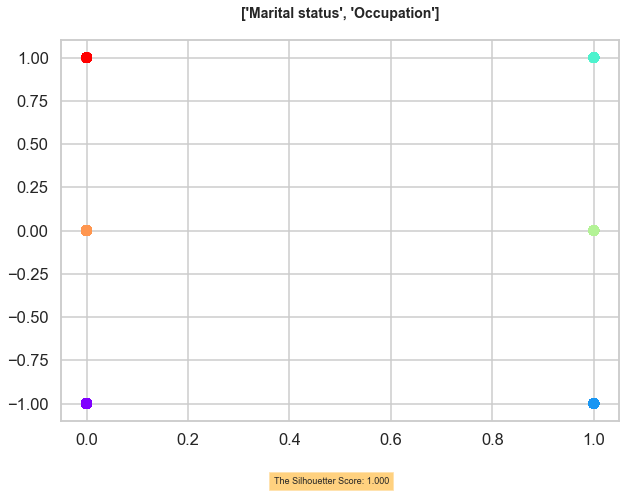

<Figure size 576x576 with 0 Axes>

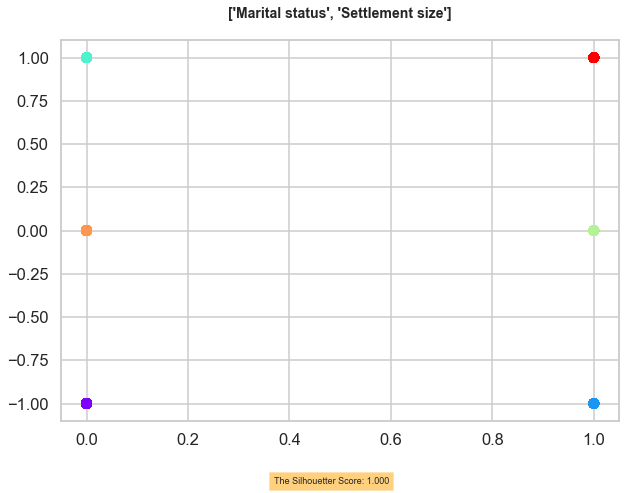

<Figure size 576x576 with 0 Axes>

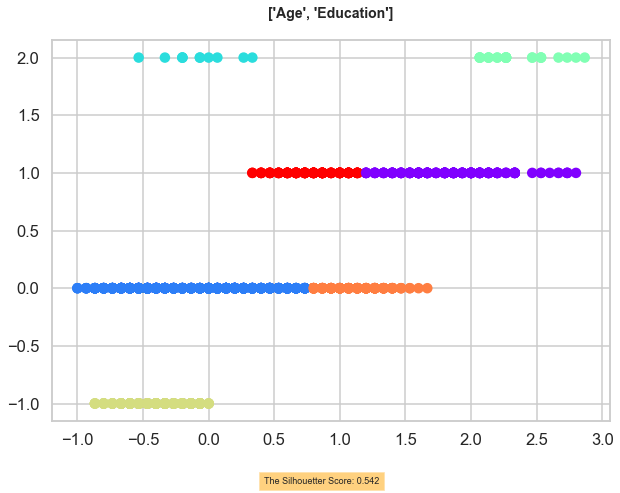

<Figure size 576x576 with 0 Axes>

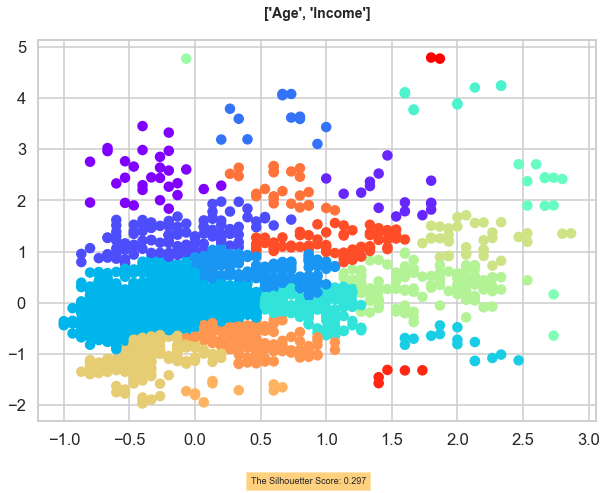

<Figure size 576x576 with 0 Axes>

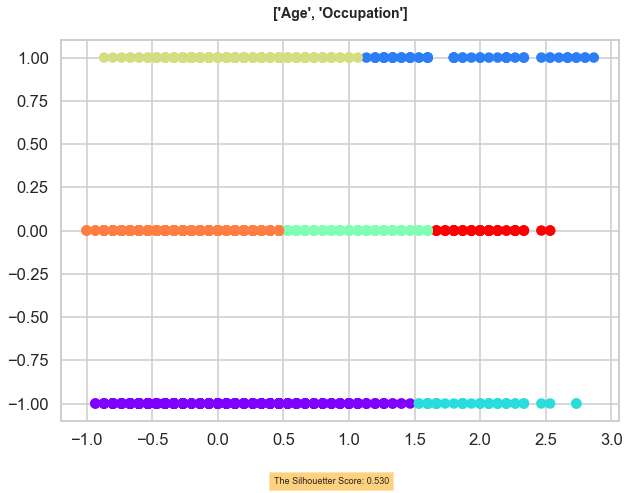

<Figure size 576x576 with 0 Axes>

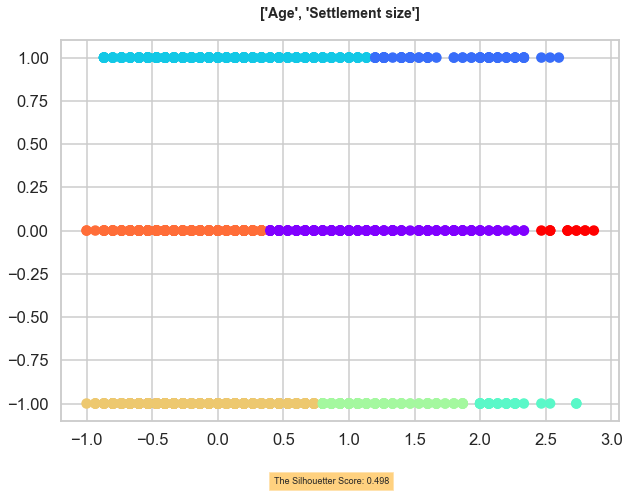

<Figure size 576x576 with 0 Axes>

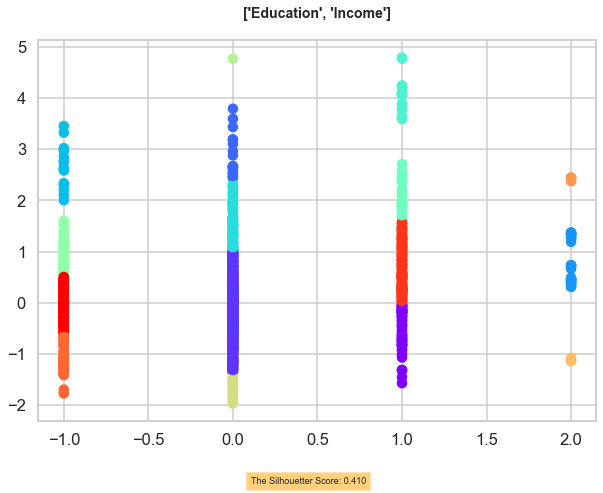

<Figure size 576x576 with 0 Axes>

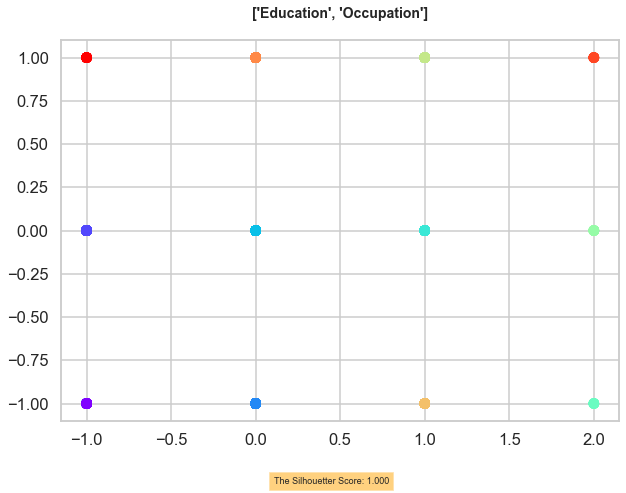

<Figure size 576x576 with 0 Axes>

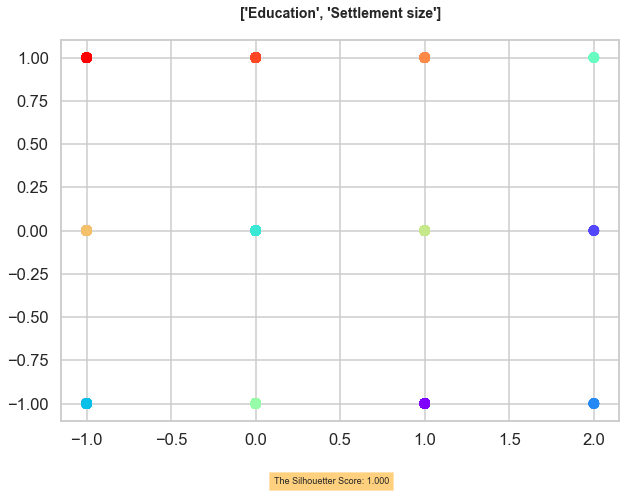

<Figure size 576x576 with 0 Axes>

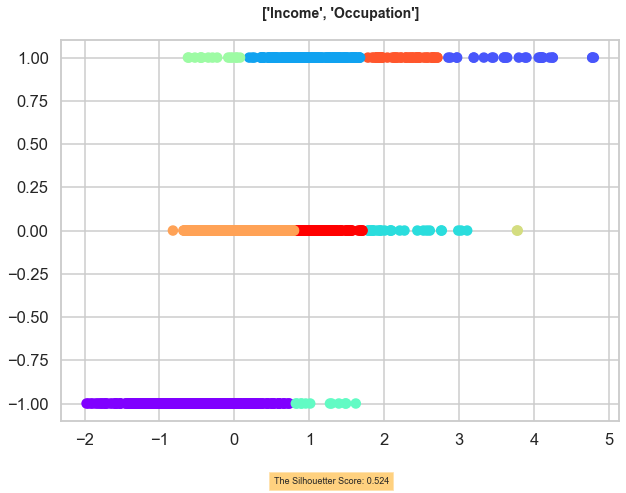

<Figure size 576x576 with 0 Axes>

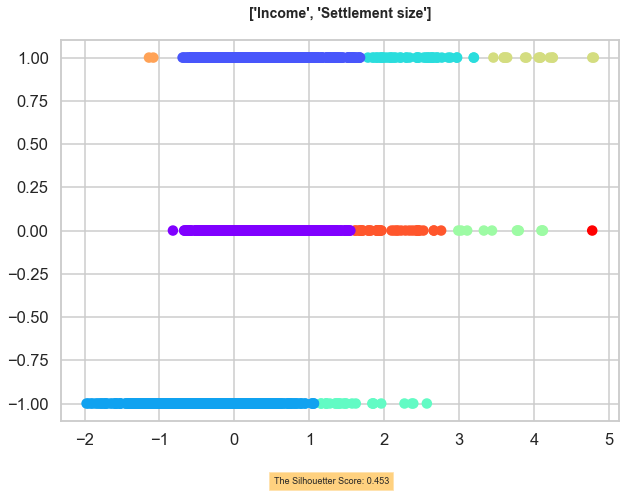

<Figure size 576x576 with 0 Axes>

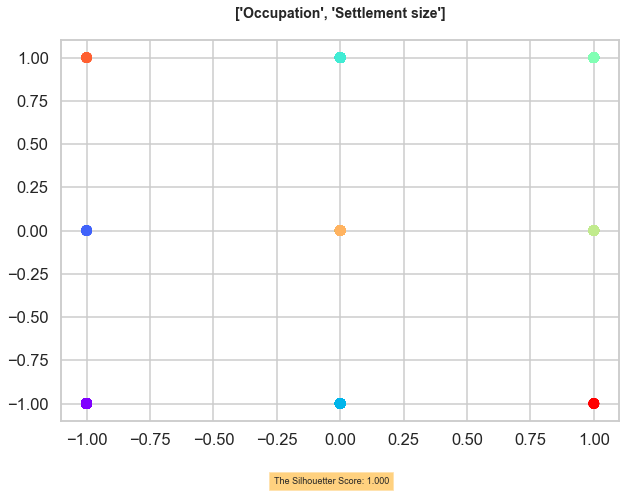

<Figure size 576x576 with 0 Axes>

In [182]:
#distance threshold of one instead of number of clusters
from sklearn.cluster import AgglomerativeClustering
Two_D_Hierarchical(df_scaled2, None, 1, 'manhattan', 'average')

-----------------------------------------------------------------------
-----------------------------------------------------------------------
###### DBSCAN Scaled CSV

In [31]:
A3_array = customer_data_array_scaled
#For epsilon, the K-distance graph is used. For plotting a K-distance Graph, we need the distance between a point and its nearest data point for all data points in the dataset. We obtain this using NearestNeighbors from sklearn.neighbors.
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(A3_array)
distances, indices = nbrs.kneighbors(A3_array)

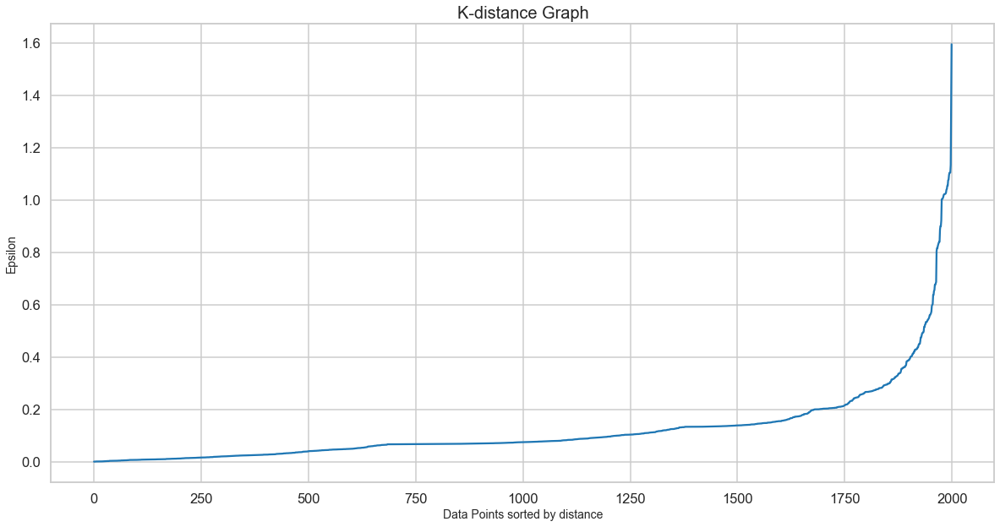

In [32]:
#Let’s plot our K-distance graph and find the value of epsilon. Use the following syntax:

# Plotting K-distance Graph
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

#The optimum value of epsilon is at the point of maximum curvature in the K-Distance Graph = 0.2
#The value of minPoints also depends on domain knowledge. This time I am taking minPoints as 6
# or loop over the range of 3 to 7 and get the first maximum silhouette-score as the optimal

In [185]:
from sklearn.cluster import DBSCAN
Y3 = customer_data_array_scaled
sill_all = []
clusters_all = []
for i in range(5, 25):
    dbscan=DBSCAN(eps=0.2,min_samples=i)
    dbscan.fit_predict(Y3)


    # Number of clusters in labels, ignoring noise if present.
    labels = dbscan.labels_
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    clusters_all.append(n_clusters_)
    #print(f'{i}) Number of clusters = {n_clusters_}')

    # Calculate Silhoutte Score
    score = silhouette_score(Y3, dbscan.labels_, metric='euclidean')
    sil33 = '%.3f' % score
    sill_all.append(float(sil33))
    
    # Print the score
    print(f'{i}) Number of clusters = {n_clusters_}\n Silhoutte Score Value = {sil33}')

5) Number of clusters = 56
 Silhoutte Score Value = 0.044
6) Number of clusters = 47
 Silhoutte Score Value = -0.000
7) Number of clusters = 39
 Silhoutte Score Value = -0.057
8) Number of clusters = 29
 Silhoutte Score Value = -0.096
9) Number of clusters = 23
 Silhoutte Score Value = -0.105
10) Number of clusters = 20
 Silhoutte Score Value = -0.136
11) Number of clusters = 15
 Silhoutte Score Value = -0.166
12) Number of clusters = 12
 Silhoutte Score Value = -0.177
13) Number of clusters = 11
 Silhoutte Score Value = -0.183
14) Number of clusters = 9
 Silhoutte Score Value = -0.177
15) Number of clusters = 8
 Silhoutte Score Value = -0.179
16) Number of clusters = 8
 Silhoutte Score Value = -0.190
17) Number of clusters = 8
 Silhoutte Score Value = -0.217
18) Number of clusters = 6
 Silhoutte Score Value = -0.139
19) Number of clusters = 6
 Silhoutte Score Value = -0.143
20) Number of clusters = 6
 Silhoutte Score Value = -0.157
21) Number of clusters = 6
 Silhoutte Score Value = -

Silhoutte Score Optimal Value at minPoints = 5


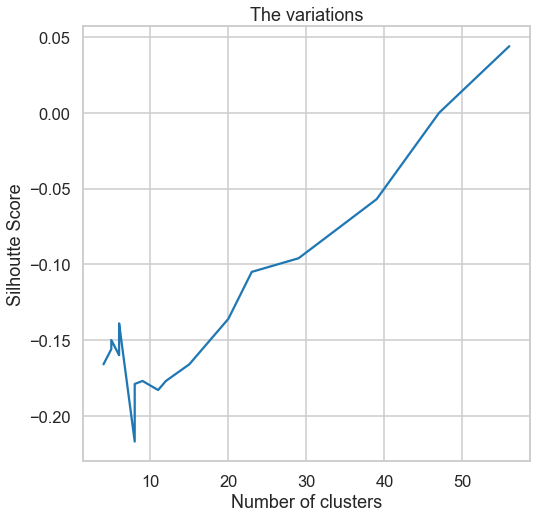

In [187]:
#Plot the silhouette_score versus the variation in the optimal EPS and the min_samples
print(f'Silhoutte Score Optimal Value at minPoints = {sill_all.index(max(sill_all))+5}')
plt.figure()
plt.title('The variations')
plt.xlabel('Number of clusters')
plt.ylabel('Silhoutte Score')
plt.plot(clusters_all,sill_all)

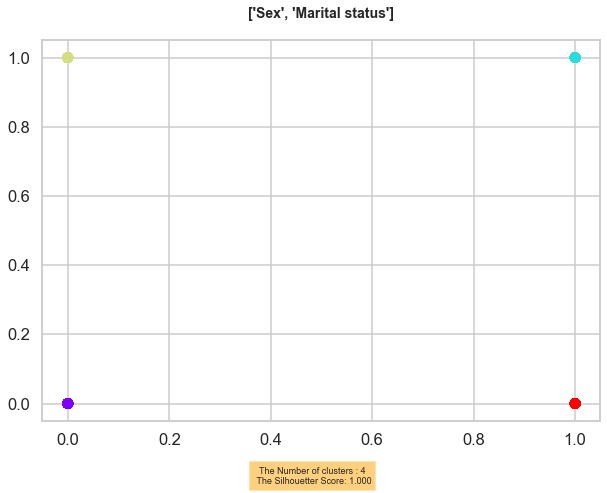

<Figure size 576x576 with 0 Axes>

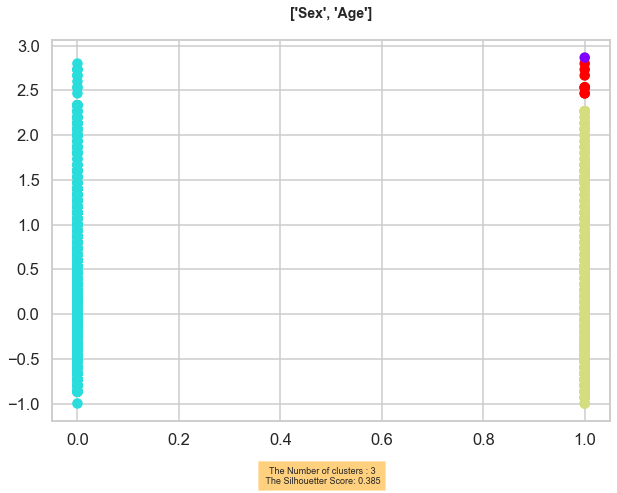

<Figure size 576x576 with 0 Axes>

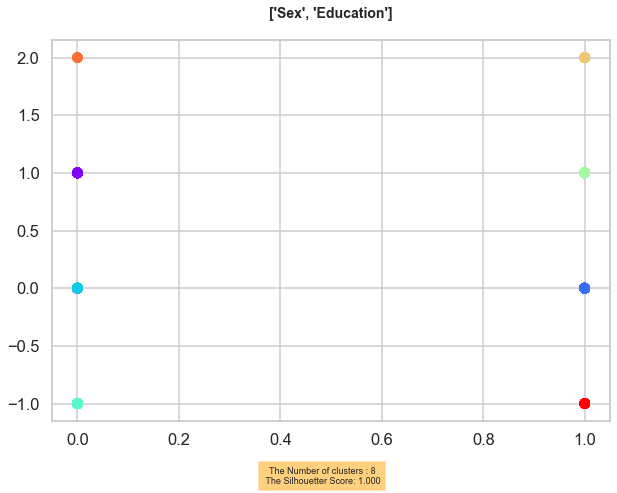

<Figure size 576x576 with 0 Axes>

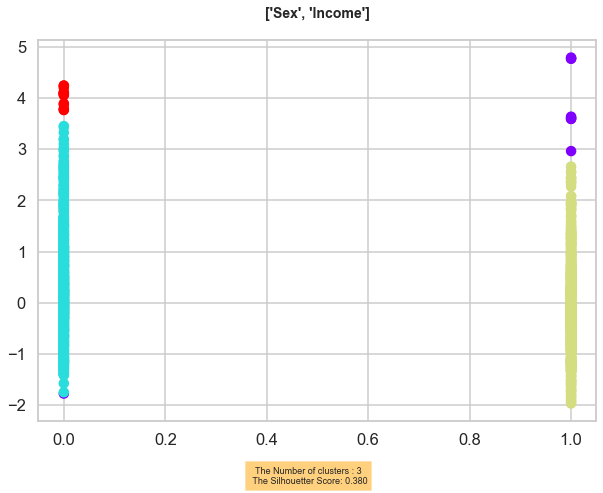

<Figure size 576x576 with 0 Axes>

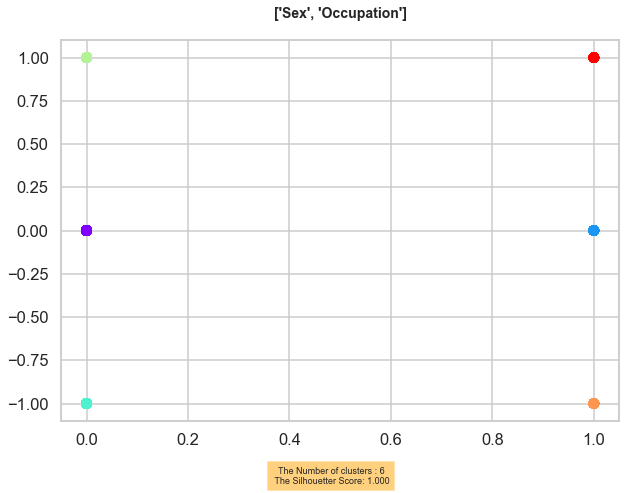

<Figure size 576x576 with 0 Axes>

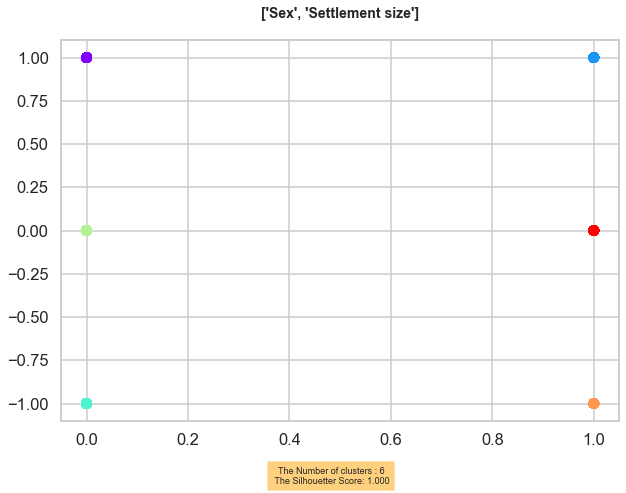

<Figure size 576x576 with 0 Axes>

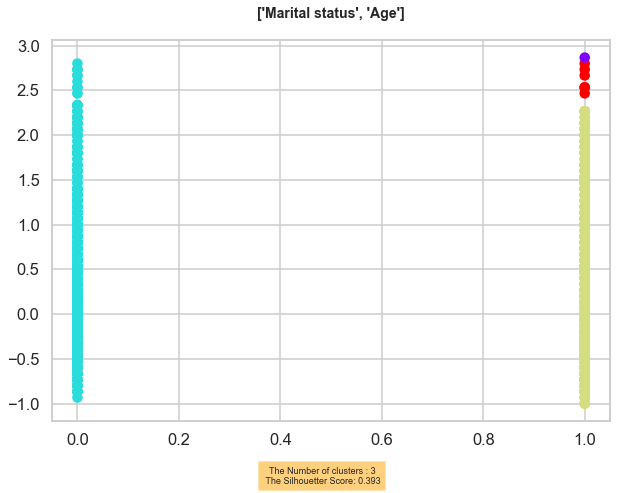

<Figure size 576x576 with 0 Axes>

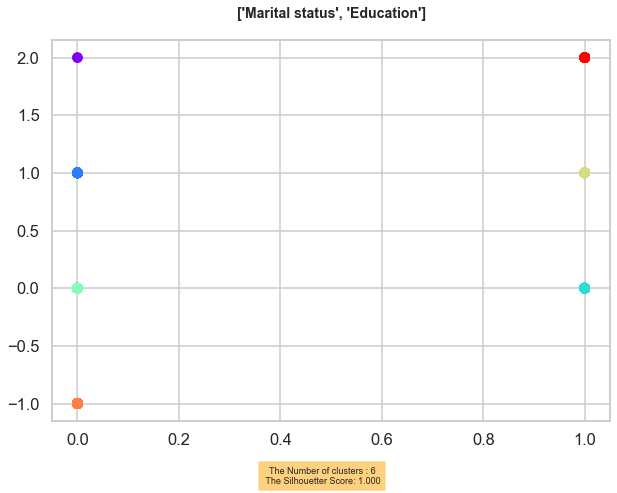

<Figure size 576x576 with 0 Axes>

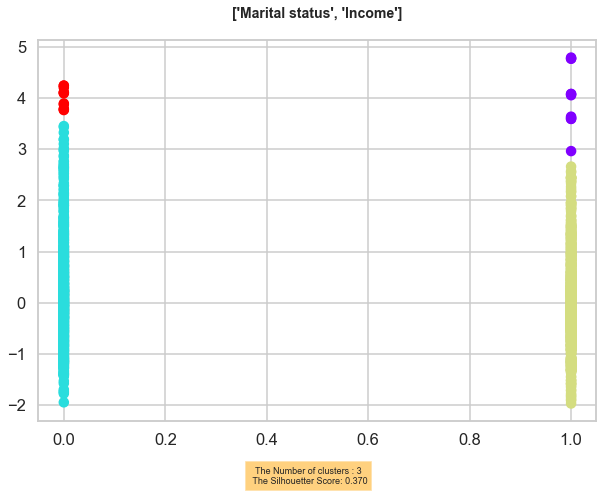

<Figure size 576x576 with 0 Axes>

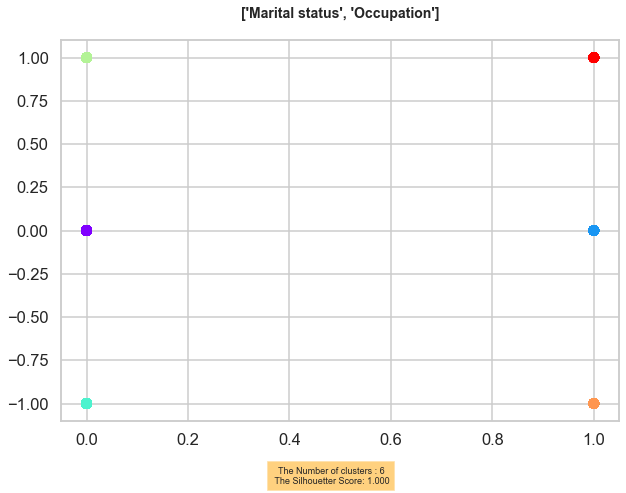

<Figure size 576x576 with 0 Axes>

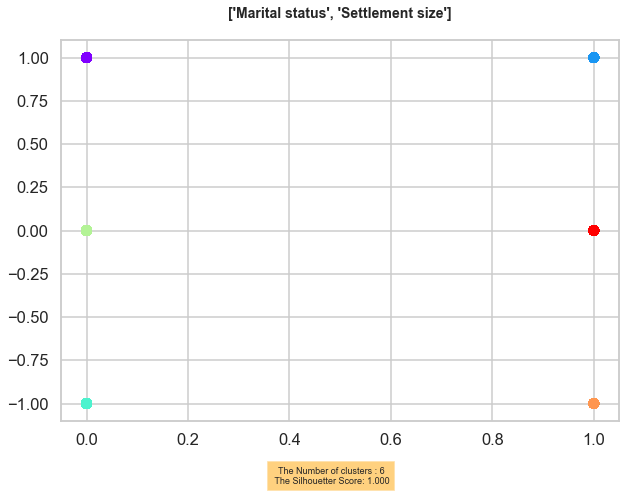

<Figure size 576x576 with 0 Axes>

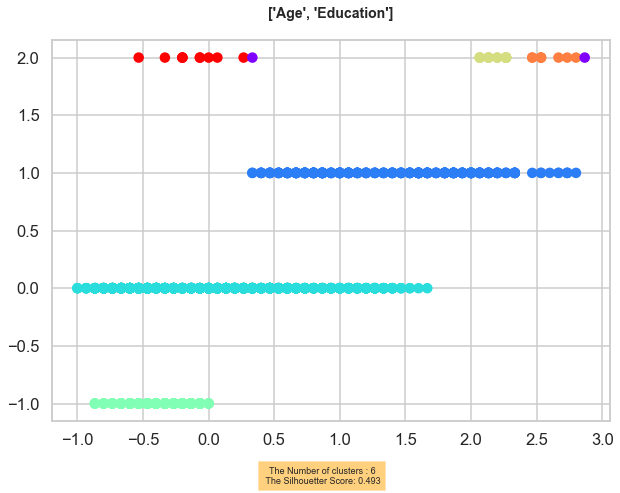

<Figure size 576x576 with 0 Axes>

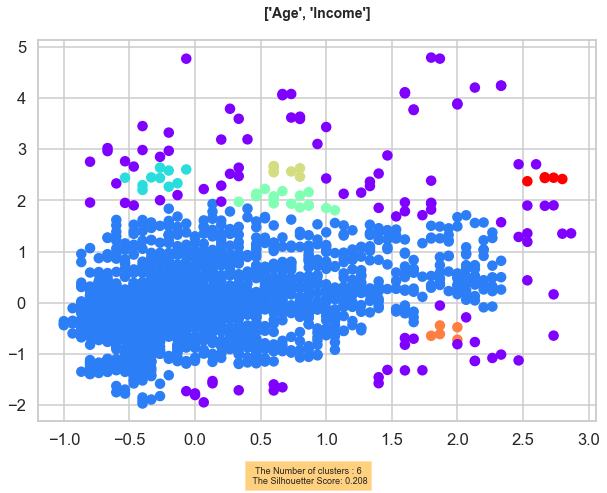

<Figure size 576x576 with 0 Axes>

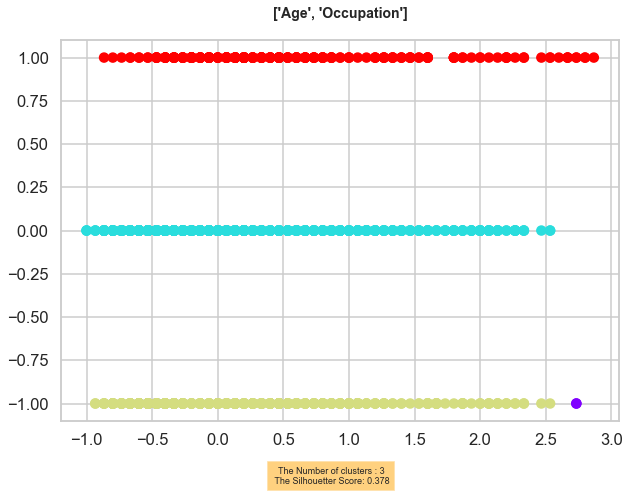

<Figure size 576x576 with 0 Axes>

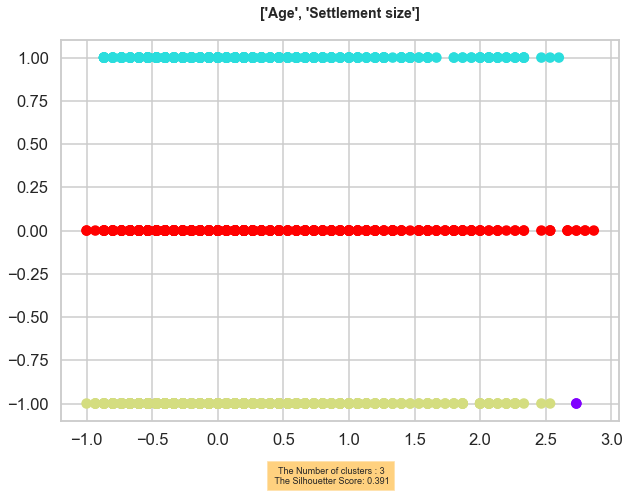

<Figure size 576x576 with 0 Axes>

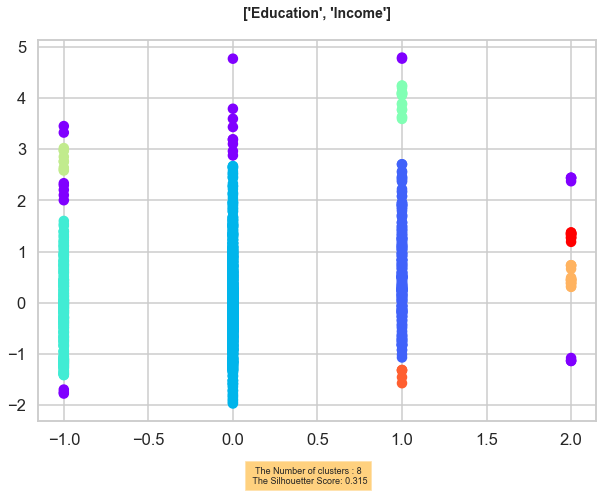

<Figure size 576x576 with 0 Axes>

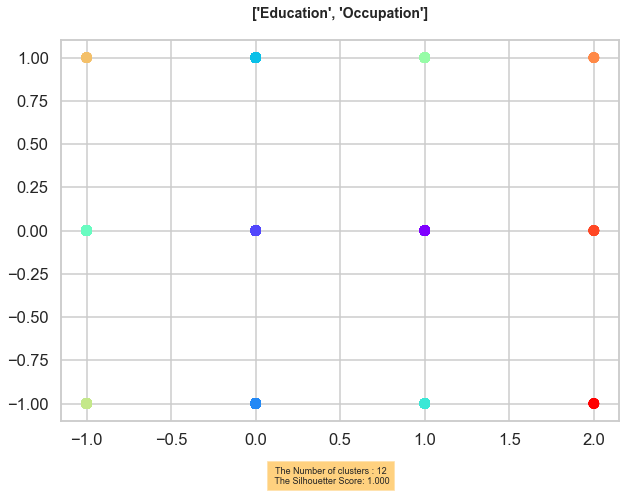

<Figure size 576x576 with 0 Axes>

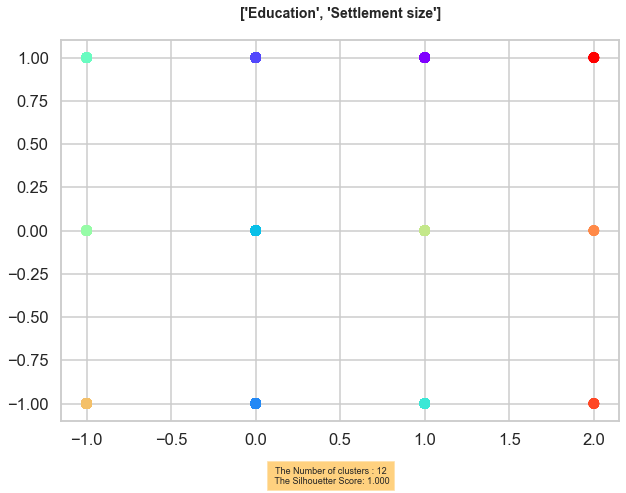

<Figure size 576x576 with 0 Axes>

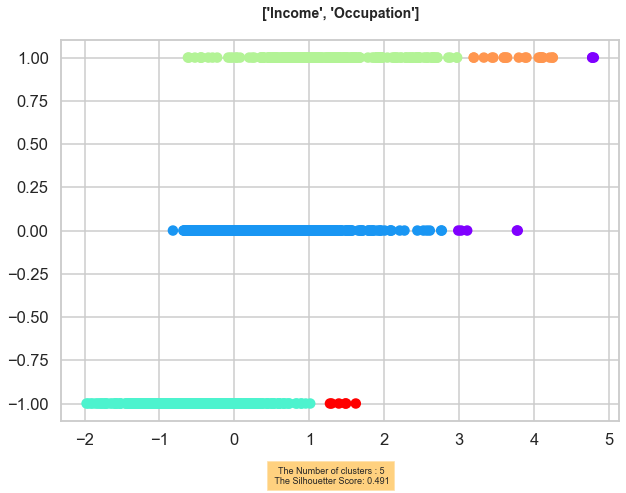

<Figure size 576x576 with 0 Axes>

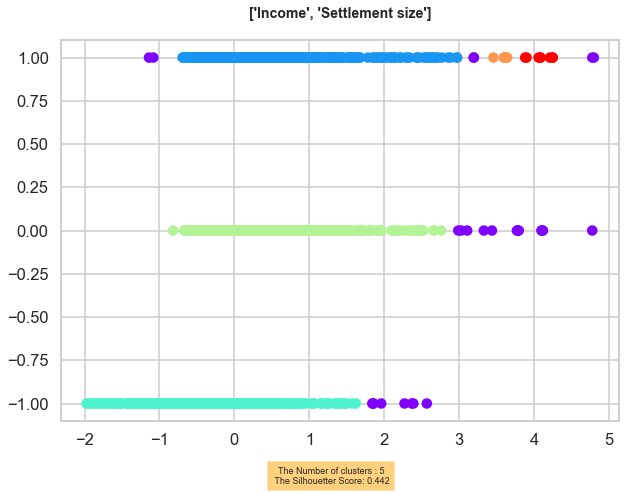

<Figure size 576x576 with 0 Axes>

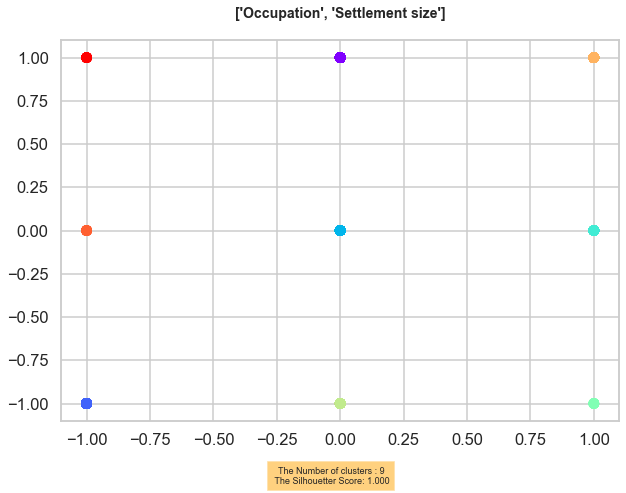

<Figure size 576x576 with 0 Axes>

In [188]:
#by trial and error minPoint is equal 5
from sklearn.cluster import DBSCAN
Two_D_DBSCAN(df_scaled2,0.2,5)

-----------------------------------------------------------------------
-----------------------------------------------------------------------
##### Gaussian Mixture

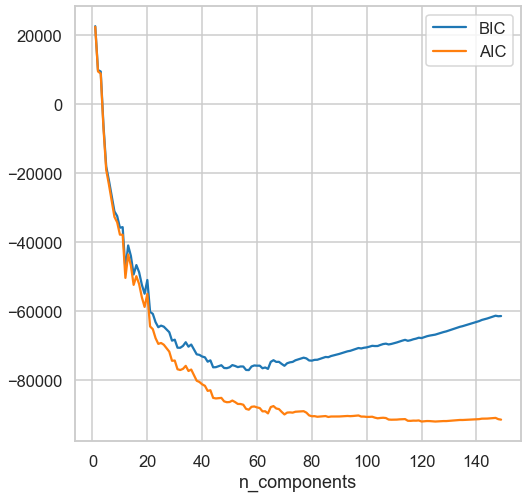

In [65]:
# the optimal number of components (that minimizes the AIC or BIC)
n_components = np.arange(1, 150)
A4 = customer_data_array_scaled
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(A4)
          for n in n_components]

plt.plot(n_components, [m.bic(A4) for m in models], label='BIC')
plt.plot(n_components, [m.aic(A4) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

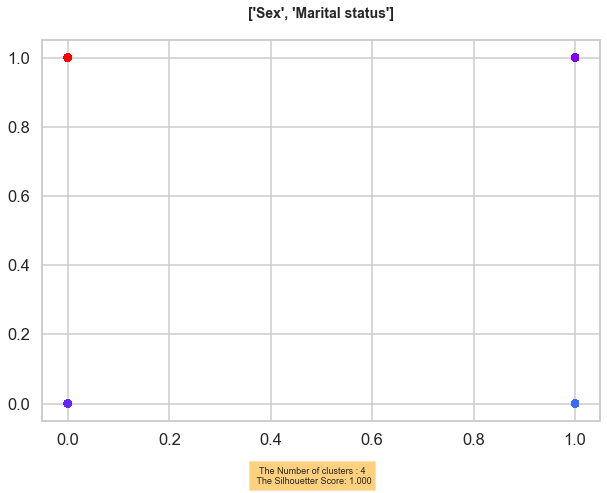

<Figure size 576x576 with 0 Axes>

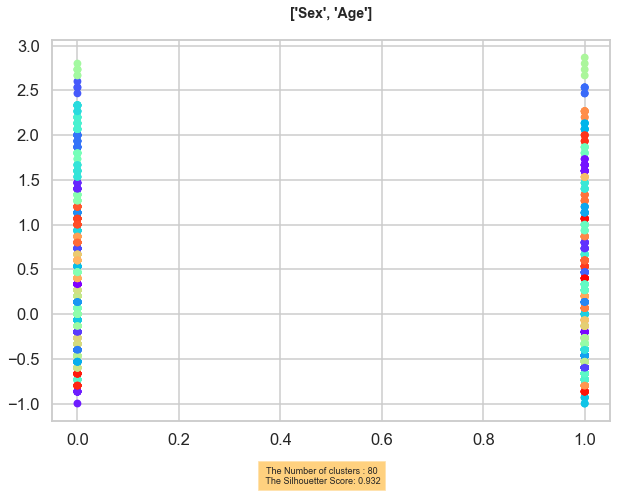

<Figure size 576x576 with 0 Axes>

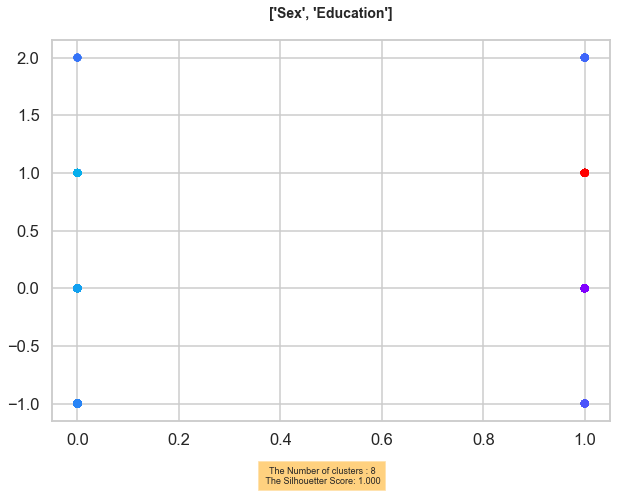

<Figure size 576x576 with 0 Axes>

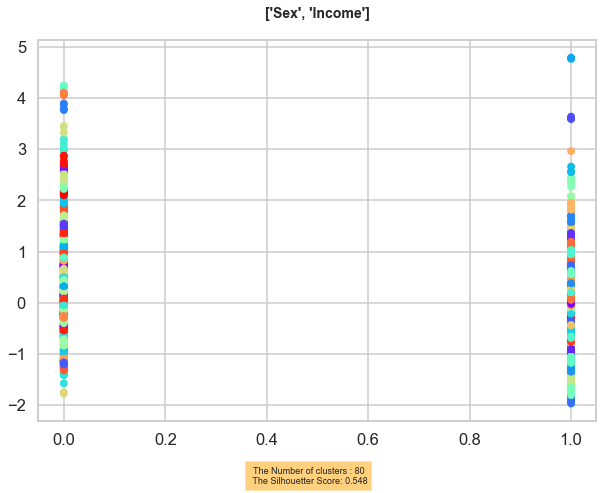

<Figure size 576x576 with 0 Axes>

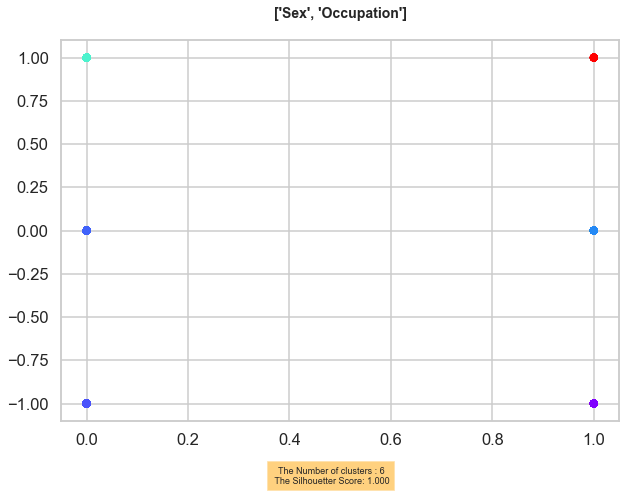

<Figure size 576x576 with 0 Axes>

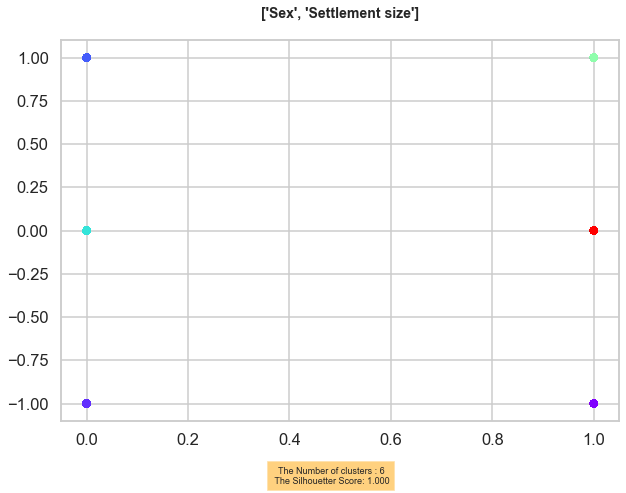

<Figure size 576x576 with 0 Axes>

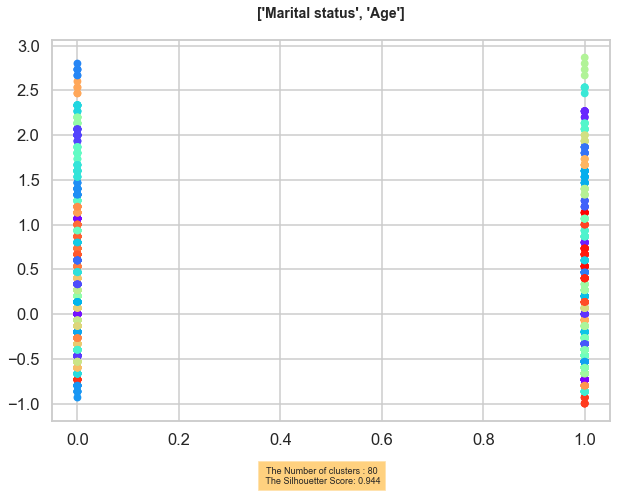

<Figure size 576x576 with 0 Axes>

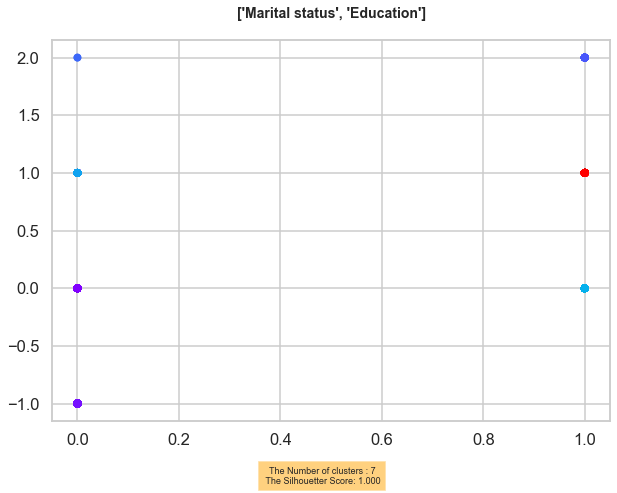

<Figure size 576x576 with 0 Axes>

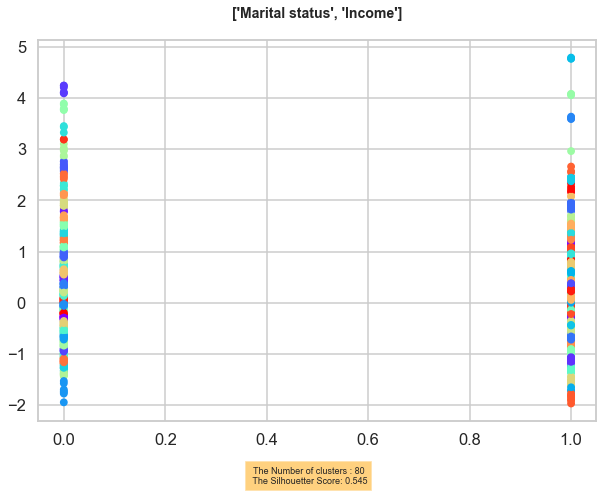

<Figure size 576x576 with 0 Axes>

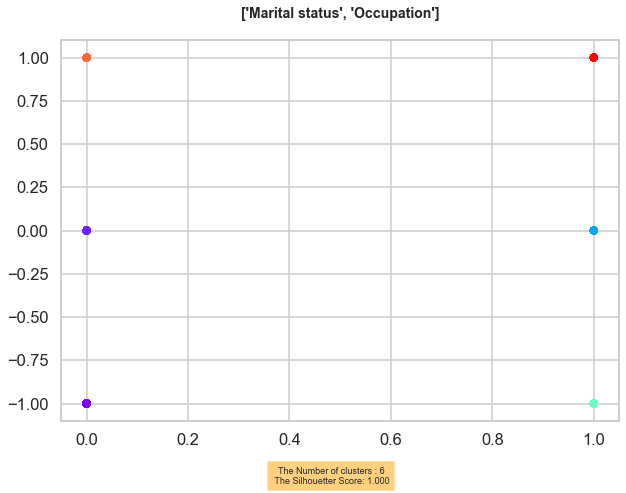

<Figure size 576x576 with 0 Axes>

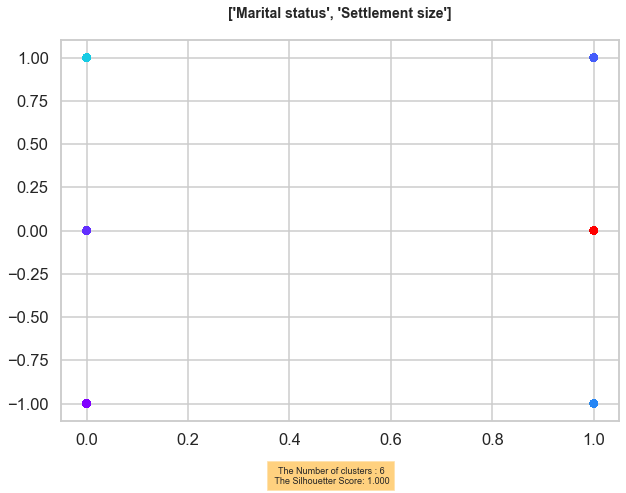

<Figure size 576x576 with 0 Axes>

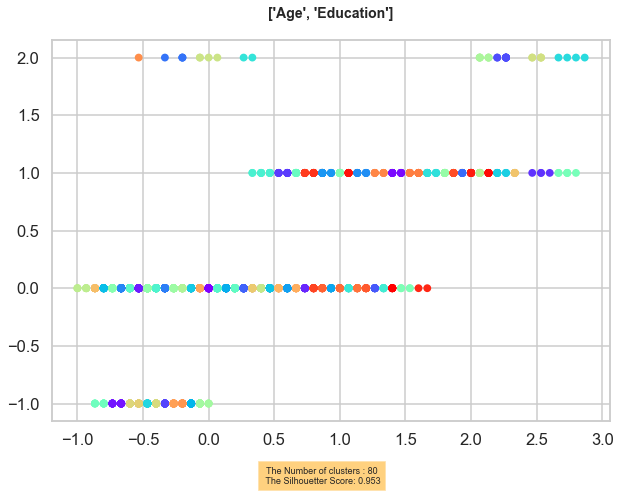

<Figure size 576x576 with 0 Axes>

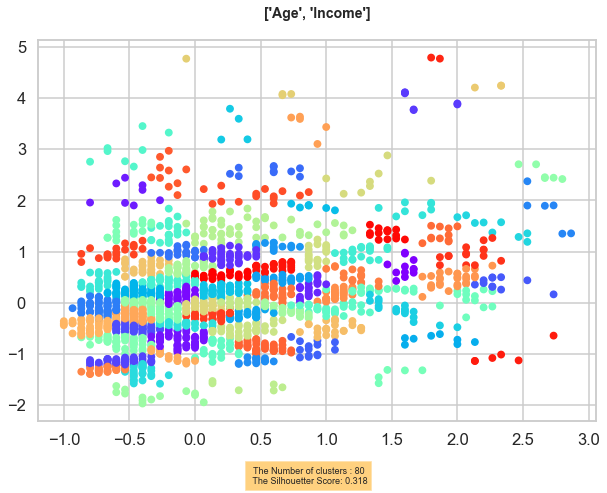

<Figure size 576x576 with 0 Axes>

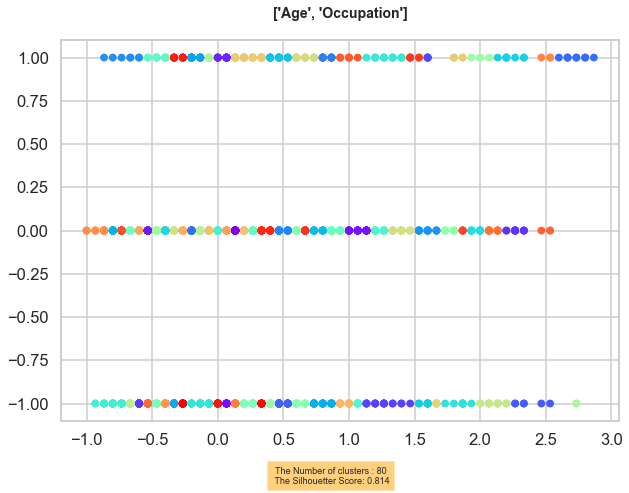

<Figure size 576x576 with 0 Axes>

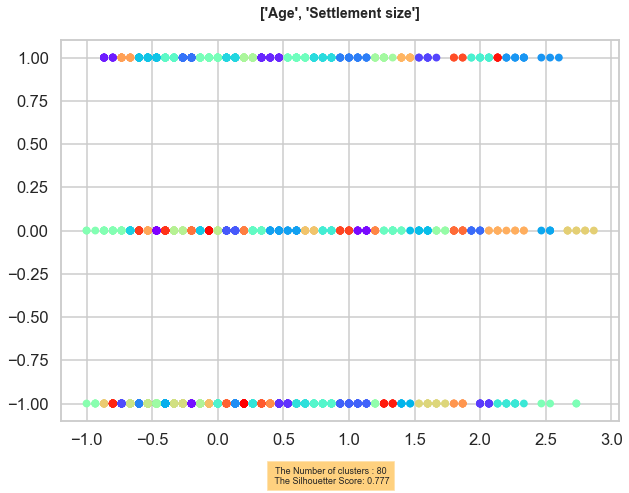

<Figure size 576x576 with 0 Axes>

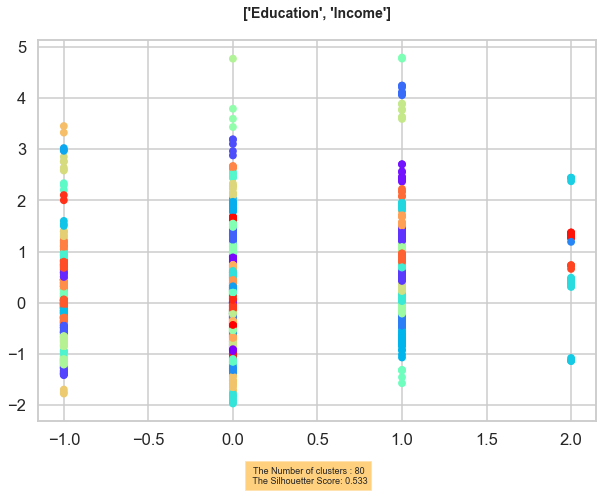

<Figure size 576x576 with 0 Axes>

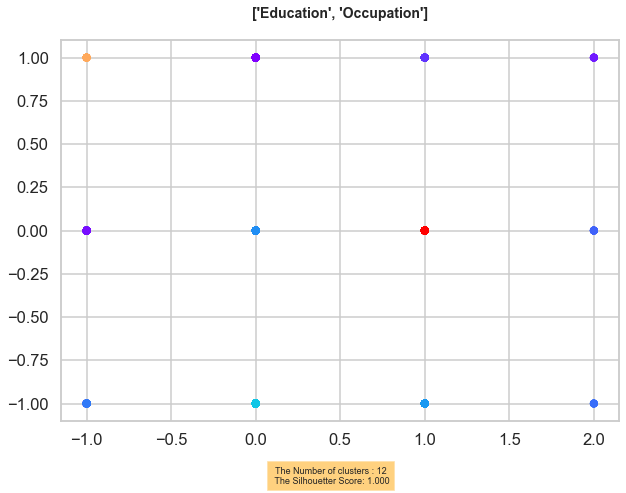

<Figure size 576x576 with 0 Axes>

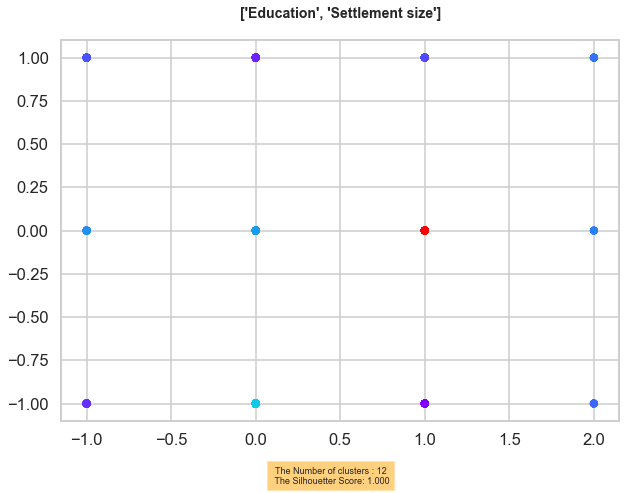

<Figure size 576x576 with 0 Axes>

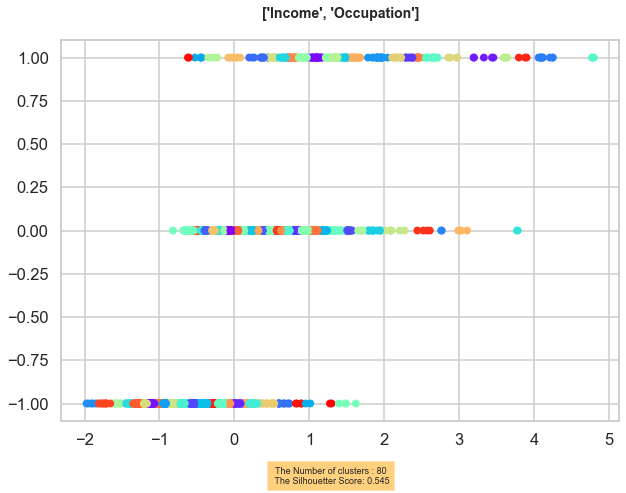

<Figure size 576x576 with 0 Axes>

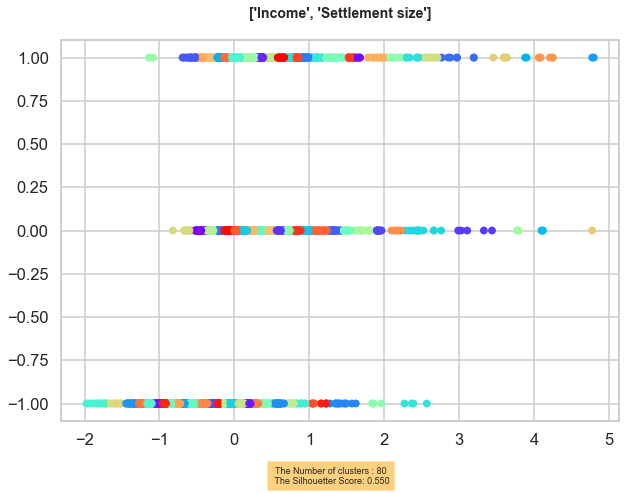

<Figure size 576x576 with 0 Axes>

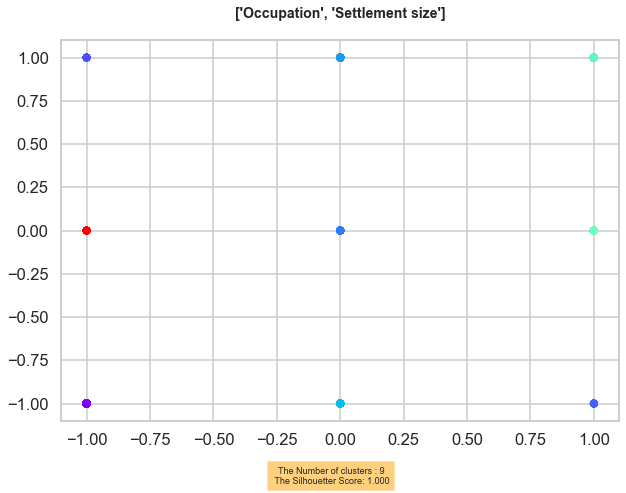

<Figure size 576x576 with 0 Axes>

In [184]:
#the optimal n_components equal 80
from sklearn.mixture import GaussianMixture
Two_D_GMM(df_scaled2, 80, "full")

##### clustering mutlifeatures dataset using ggplot plotline

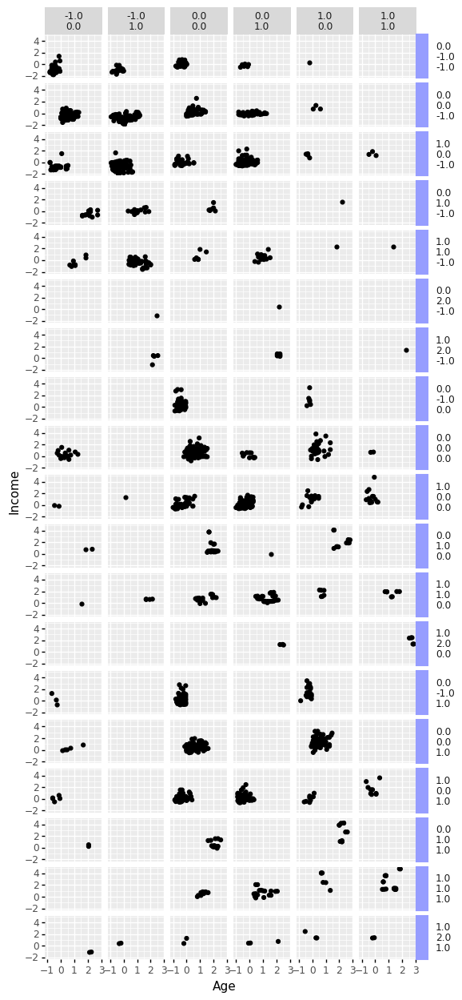

<ggplot: (101345628188)>

In [128]:
(
    ggplot(df_scaled2, aes(x='Age', y='Income'))
    + geom_point()
    + facet_grid('Settlement size + Education + Marital status ~ Occupation + Sex ') # use + to add additional faceting variables
    
    + theme(strip_text_y = element_text(angle = 0,              # change facet text angle
                                        ha = 'left'             # change text alignment
                                       ),
            strip_background_y = element_text(color = '#969dff' # change background colour of facet background
                                              , width = 0.2     # adjust width of facet background to fit facet text
                                             ), figure_size=(6, 15)                                 # adjust width & height of figure to fit y-axis
           )+ labs(x='Age', y='Income')
)

##### contour with only two features of dataset

In [130]:
#contour works only on 2 features of dataset, we will test with the first two
A4 = customer_data_array_scaled[:, :2] #all rows besides two columns
gmm = GaussianMixture(n_components=80, covariance_type="full").fit(A4)

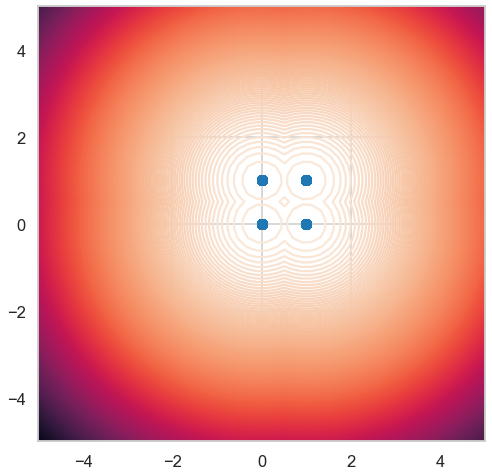

In [131]:
# https://jakevdp.github.io/PythonDataScienceHandbook/04.04-density-and-contour-plots.html
# https://matplotlib.org/3.5.1/api/_as_gen/matplotlib.pyplot.contour.html
# https://www.mghassany.com/MLcourse/pw-6.html
# https://scitools-iris.readthedocs.io/en/latest/_modules/iris/plot.html#contour

#Contour with 250 regions
X, Y = np.meshgrid(np.linspace(-5,5), np.linspace(-5,5))
XX = np.array([X.ravel(), Y.ravel()]).T
Z = gmm.score_samples(XX)   # we only take the first two features.
Z = Z.reshape((50,50))
plt.contour(X, Y, Z, 250)
plt.scatter(A4[:, 0], A4[:, 1])
plt.show()

### another two general method for plotting contour instead of test each time with two different features

###### <font color = 'red'> first method of bivariate</font>

In [80]:
#Two_D_contour(df_scaled2, 80, 'full')
##can't work with no. of component more than possible color choices

###### <font color = 'red'> second method of regions</font>

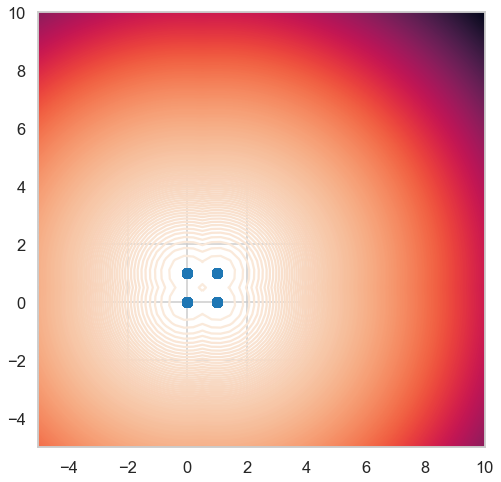

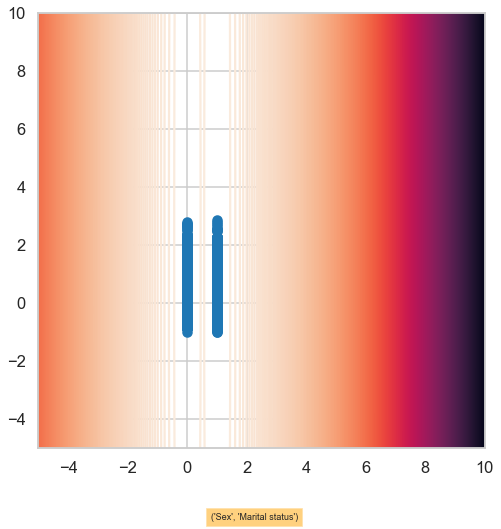

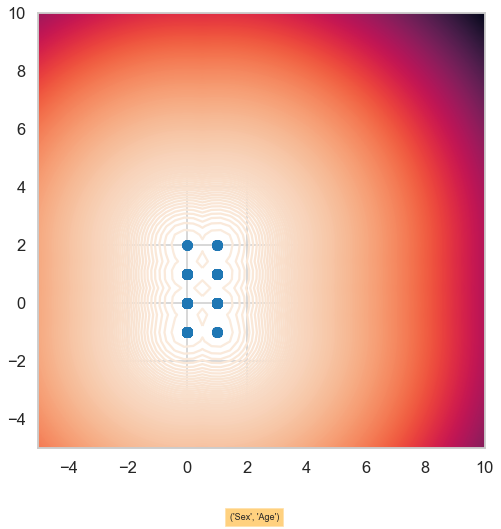

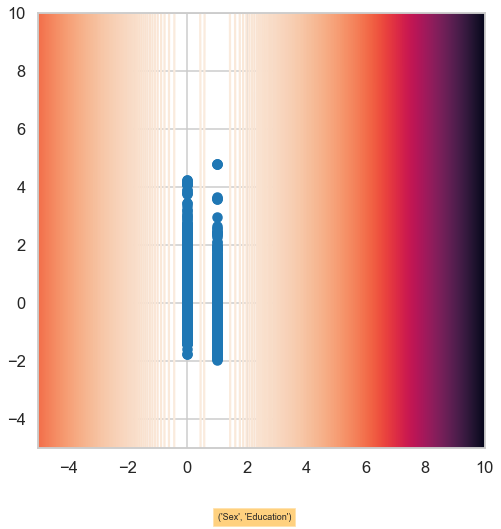

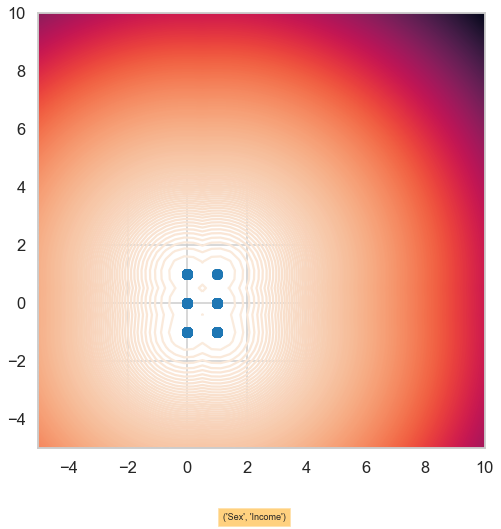

...

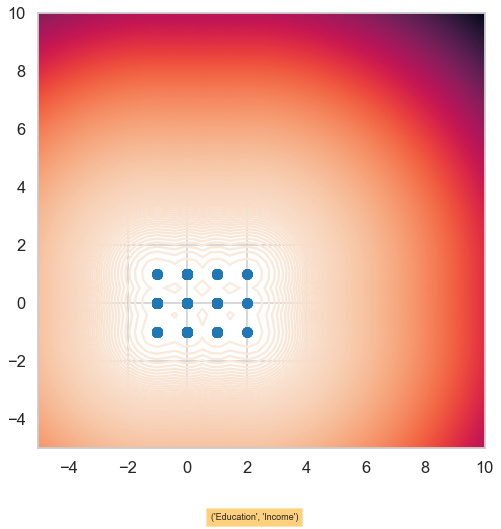

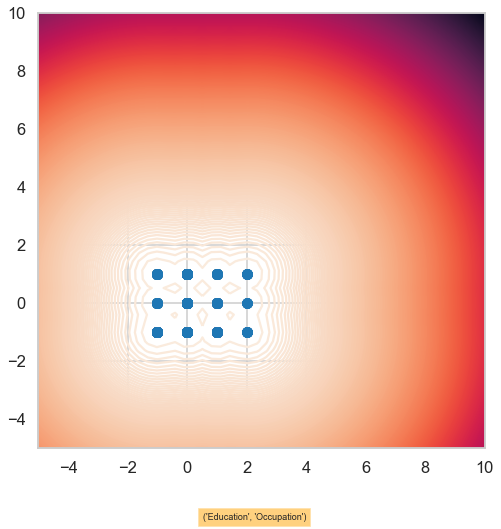

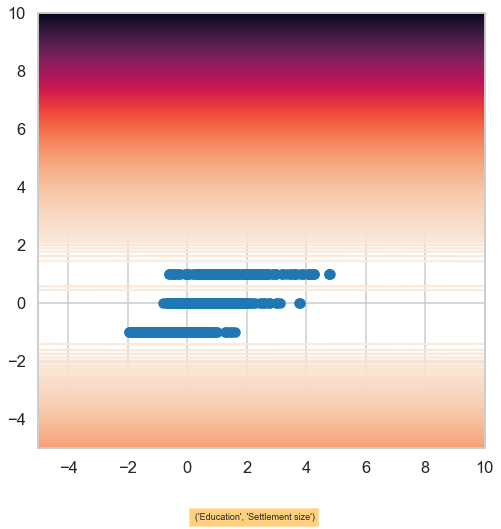

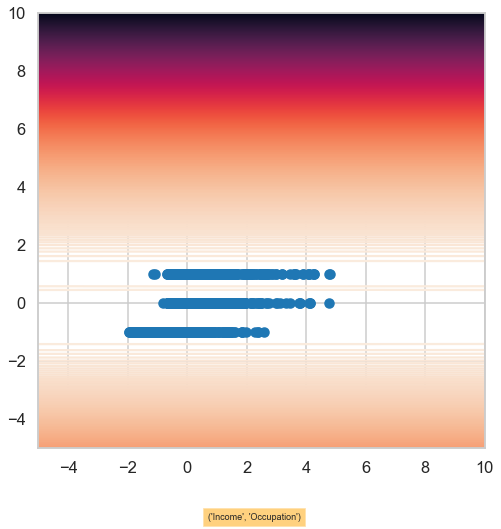

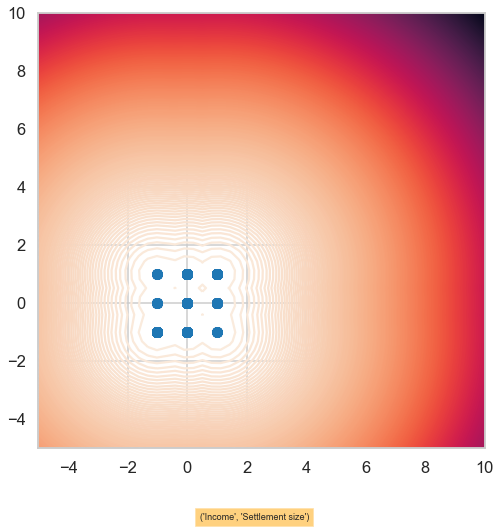

<Figure size 576x576 with 0 Axes>

In [132]:
Two_D_contour_regions(df_scaled2, 80, 'full', 500)